In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/network-intrusion-dataset/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Tuesday-WorkingHours.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Monday-WorkingHours.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Friday-WorkingHours-Morning.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv
/kaggle/input/network-intrusion-dataset/Wednesday-workingHours.pcap_ISCX.csv
/kaggle/input/unsw-nb15/UNSW_NB15_testing-set.csv
/kaggle/input/unsw-nb15/UNSW-NB15_1.csv
/kaggle/input/unsw-nb15/UNSW_NB15_training-set.csv
/kaggle/input/unsw-nb15/UNSW-NB15_LIST_EVENTS.csv
/kaggle/input/unsw-nb15/UNSW-NB15_4.csv
/kaggle/input/unsw-nb15/UNSW-NB15_3.csv
/kaggle/input/unsw-nb15/UNSW-NB15_2.csv
/kag

# NSL-KDD

In [2]:
## NSL-KDD
train_data = pd.read_csv('/kaggle/input/nslkdd/KDDTrain+.txt', header=None)
test_data = pd.read_csv('/kaggle/input/nslkdd/KDDTest+.txt', header=None)

In [3]:
columns = ['duration', 'protocol_type', 'service', 'flag', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment',
           'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted',
           'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'num_outbound_cmds', 'is_host_login',
           'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate',
           'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count',
           'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
           'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
           'dst_host_srv_rerror_rate', 'attack', 'level']

train_data.columns = columns
test_data.columns = columns

In [4]:
full_data = pd.concat([train_data, test_data], ignore_index=True)

nsl_kdd_data = full_data

In [5]:
nsl_kdd_data

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148512,0,tcp,smtp,SF,794,333,0,0,0,0,...,0.72,0.06,0.01,0.01,0.01,0.00,0.00,0.00,normal,21
148513,0,tcp,http,SF,317,938,0,0,0,0,...,1.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,normal,21
148514,0,tcp,http,SF,54540,8314,0,0,0,2,...,1.00,0.00,0.00,0.00,0.00,0.00,0.07,0.07,back,15
148515,0,udp,domain_u,SF,42,42,0,0,0,0,...,0.99,0.01,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [6]:
nsl_kdd_data['attack'].count()

148517

In [7]:
# X = full_data.drop(['attack', 'level'], axis=1)
# y = full_data['attack']

In [8]:
# Get the count of each class in the 'attack' column
class_counts = nsl_kdd_data['attack'].value_counts()

# Print the counts for each class
print("Class counts:\n", class_counts)

# Compute the total sum of all counts
total_count = class_counts.sum()
print("\nTotal count of all classes:", total_count)


Class counts:
 attack
normal             77054
neptune            45871
satan               4368
ipsweep             3740
smurf               3311
portsweep           3088
nmap                1566
back                1315
guess_passwd        1284
mscan                996
warezmaster          964
teardrop             904
warezclient          890
apache2              737
processtable         685
snmpguess            331
saint                319
mailbomb             293
pod                  242
snmpgetattack        178
httptunnel           133
buffer_overflow       50
land                  25
multihop              25
rootkit               23
named                 17
ps                    15
sendmail              14
xterm                 13
imap                  12
loadmodule            11
ftp_write             11
xlock                  9
phf                    6
perl                   5
xsnoop                 4
spy                    2
worm                   2
sqlattack              2
udp

In [9]:
nsl_kdd_data['attack'].value_counts()/len(nsl_kdd_data)

attack
normal             0.518823
neptune            0.308860
satan              0.029411
ipsweep            0.025182
smurf              0.022294
portsweep          0.020792
nmap               0.010544
back               0.008854
guess_passwd       0.008645
mscan              0.006706
warezmaster        0.006491
teardrop           0.006087
warezclient        0.005993
apache2            0.004962
processtable       0.004612
snmpguess          0.002229
saint              0.002148
mailbomb           0.001973
pod                0.001629
snmpgetattack      0.001199
httptunnel         0.000896
buffer_overflow    0.000337
land               0.000168
multihop           0.000168
rootkit            0.000155
named              0.000114
ps                 0.000101
sendmail           0.000094
xterm              0.000088
imap               0.000081
loadmodule         0.000074
ftp_write          0.000074
xlock              0.000061
phf                0.000040
perl               0.000034
xsnoop       

In [10]:
labels_dict = {"normal":0, "neptune":1} #assuming 2 - all other attacks
nsl_kdd_data['labels'] = nsl_kdd_data['attack'].apply(lambda x: labels_dict.get(x, 2)).astype(np.int32)
nsl_kdd_data['labels'].value_counts()/len(nsl_kdd_data)

labels
0    0.518823
1    0.308860
2    0.172317
Name: count, dtype: float64

# UNSW-NB15

In [11]:
root = "/kaggle/input/unsw-nb15/"
train = pd.read_csv(root+"UNSW_NB15_training-set.csv")
test = pd.read_csv(root+"UNSW_NB15_testing-set.csv")
list_events = pd.read_csv(root+"UNSW-NB15_LIST_EVENTS.csv")
features = pd.read_csv(root+"NUSW-NB15_features.csv", encoding='cp1252')

In [12]:
# Creating a empty dict, where I will save all parameters required for test data transformation
saved_dict = {}
# Reading datasets
dfs = []
for i in range(1,5):
    path = root+'UNSW-NB15_{}.csv'  # There are 4 input csv files
    dfs.append(pd.read_csv(path.format(i), header = None))
all_data = pd.concat(dfs).reset_index(drop=True)  # Concat all to a single df
# This csv file contains names of all the features
df_col = pd.read_csv(root+'NUSW-NB15_features.csv', encoding='ISO-8859-1')
# Making column names lower case, removing spaces
df_col['Name'] = df_col['Name'].apply(lambda x: x.strip().replace(' ', '').lower())
# Renaming our dataframe with proper column names
all_data.columns = df_col['Name']
# Saving useful info, later this will be used to transform raw test data
saved_dict['columns'] = df_col['Name'][df_col['Name']!='label'].tolist()
del df_col

<ipython-input-12-6dfda817f5d4>:7: DtypeWarning: Columns (1,3,47) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(path.format(i), header = None))
<ipython-input-12-6dfda817f5d4>:7: DtypeWarning: Columns (3,39,47) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(path.format(i), header = None))


In [13]:
all_data.head()

Name,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,NaN,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,NaN,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,NaN,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,NaN,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,NaN,0


# KDD CUP 99

In [14]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.preprocessing import MinMaxScaler
print(os.listdir('../input/kdd-cup-1999-data'))

['kddcup.data.gz', 'kddcup.data', 'kddcup.testdata.unlabeled', 'training_attack_types', 'kddcup.data.corrected', 'kddcup.newtestdata_10_percent_unlabeled.gz', 'corrected', 'kddcup.testdata.unlabeled.gz', 'kddcup.testdata.unlabeled_10_percent', 'corrected.gz', 'kddcup.newtestdata_10_percent_unlabeled', 'kddcup.data_10_percent.gz', 'kddcup.names', 'kddcup.data_10_percent_corrected', 'typo-correction.txt', 'kddcup.data_10_percent', 'kddcup.testdata.unlabeled_10_percent.gz']


In [15]:
with open("../input/kdd-cup-1999-data/kddcup.names",'r') as f:
    print(f.read())

cols="""duration,
protocol_type,
service,
flag,
src_bytes,
dst_bytes,
land,
wrong_fragment,
urgent,
hot,
num_failed_logins,
logged_in,
num_compromised,
root_shell,
su_attempted,
num_root,
num_file_creations,
num_shells,
num_access_files,
num_outbound_cmds,
is_host_login,
is_guest_login,
count,
srv_count,
serror_rate,
srv_serror_rate,
rerror_rate,
srv_rerror_rate,
same_srv_rate,
diff_srv_rate,
srv_diff_host_rate,
dst_host_count,
dst_host_srv_count,
dst_host_same_srv_rate,
dst_host_diff_srv_rate,
dst_host_same_src_port_rate,
dst_host_srv_diff_host_rate,
dst_host_serror_rate,
dst_host_srv_serror_rate,
dst_host_rerror_rate,
dst_host_srv_rerror_rate"""

columns=[]
for c in cols.split(','):
    if(c.strip()):
       columns.append(c.strip())

columns.append('target')
#print(columns)
print(len(columns))

attacks_types = {
    'normal': 'normal',
'back': 'dos',
'buffer_overflow': 'u2r',
'ftp_write': 'r2l',
'guess_passwd': 'r2l',
'imap': 'r2l',
'ipsweep': 'probe',
'land': 'dos',
'loadmodule': 'u2r',
'multihop': 'r2l',
'neptune': 'dos',
'nmap': 'probe',
'perl': 'u2r',
'phf': 'r2l',
'pod': 'dos',
'portsweep': 'probe',
'rootkit': 'u2r',
'satan': 'probe',
'smurf': 'dos',
'spy': 'r2l',
'teardrop': 'dos',
'warezclient': 'r2l',
'warezmaster': 'r2l',
}

back,buffer_overflow,ftp_write,guess_passwd,imap,ipsweep,land,loadmodule,multihop,neptune,nmap,normal,perl,phf,pod,portsweep,rootkit,satan,smurf,spy,teardrop,warezclient,warezmaster.
duration: continuous.
protocol_type: symbolic.
service: symbolic.
flag: symbolic.
src_bytes: continuous.
dst_bytes: continuous.
land: symbolic.
wrong_fragment: continuous.
urgent: continuous.
hot: continuous.
num_failed_logins: continuous.
logged_in: symbolic.
num_compromised: continuous.
root_shell: continuous.
su_attempted: continuous.
num_root: continuous.
num_file_creations: continuous.
num_shells: continuous.
num_access_files: continuous.
num_outbound_cmds: continuous.
is_host_login: symbolic.
is_guest_login: symbolic.
count: continuous.
srv_count: continuous.
serror_rate: continuous.
srv_serror_rate: continuous.
rerror_rate: continuous.
srv_rerror_rate: continuous.
same_srv_rate: continuous.
diff_srv_rate: continuous.
srv_diff_host_rate: continuous.
dst_host_count: continuous.
dst_host_srv_count: con

In [16]:
path = "../input/kdd-cup-1999-data/kddcup.data_10_percent.gz"
df = pd.read_csv(path,names=columns)

#Adding Attack Type column
df['Attack Type'] = df.target.apply(lambda r:attacks_types[r[:-1]])

df.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,target,Attack Type
0,0,tcp,http,SF,181,5450,0,0,0,0,...,1.0,0.0,0.11,0.0,0.0,0.0,0.0,0.0,normal.,normal
1,0,tcp,http,SF,239,486,0,0,0,0,...,1.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,normal.,normal
2,0,tcp,http,SF,235,1337,0,0,0,0,...,1.0,0.0,0.03,0.0,0.0,0.0,0.0,0.0,normal.,normal
3,0,tcp,http,SF,219,1337,0,0,0,0,...,1.0,0.0,0.03,0.0,0.0,0.0,0.0,0.0,normal.,normal
4,0,tcp,http,SF,217,2032,0,0,0,0,...,1.0,0.0,0.02,0.0,0.0,0.0,0.0,0.0,normal.,normal


In [17]:
df['target'].value_counts()

target
smurf.              280790
neptune.            107201
normal.              97278
back.                 2203
satan.                1589
ipsweep.              1247
portsweep.            1040
warezclient.          1020
teardrop.              979
pod.                   264
nmap.                  231
guess_passwd.           53
buffer_overflow.        30
land.                   21
warezmaster.            20
imap.                   12
rootkit.                10
loadmodule.              9
ftp_write.               8
multihop.                7
phf.                     4
perl.                    3
spy.                     2
Name: count, dtype: int64

In [18]:
df['Attack Type'].value_counts()

Attack Type
dos       391458
normal     97278
probe       4107
r2l         1126
u2r           52
Name: count, dtype: int64

In [19]:
kdd_cup_df = df

# CICD-2017

In [20]:
import pandas as pd
# df1=pd.read_csv('/kaggle/input/network-intrusion-dataset/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')
# df2=pd.read_csv('/kaggle/input/network-intrusion-dataset/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
# df3=pd.read_csv('/kaggle/input/network-intrusion-dataset/Friday-WorkingHours-Morning.pcap_ISCX.csv')
# df4=pd.read_csv('/kaggle/input/network-intrusion-dataset/Monday-WorkingHours.pcap_ISCX.csv')
# df5=pd.read_csv('/kaggle/input/network-intrusion-dataset/Monday-WorkingHours.pcap_ISCX.csv')
# df6=pd.read_csv('/kaggle/input/network-intrusion-dataset/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
# df7=pd.read_csv('/kaggle/input/network-intrusion-dataset/Tuesday-WorkingHours.pcap_ISCX.csv')
cicd2017 = pd.read_csv('/kaggle/input/network-intrusion-dataset/Wednesday-workingHours.pcap_ISCX.csv')

# cicd2017 = pd.concat([df1, df2, df3,df4,df5,df6,df7], ignore_index=True)

In [21]:
cicd2017[' Label'].unique()

array(['BENIGN', 'DoS slowloris', 'DoS Slowhttptest', 'DoS Hulk',
       'DoS GoldenEye', 'Heartbleed'], dtype=object)

# Utils and Pipeline Functions

In [22]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd

def preprocess_data(dataframe):
    # Ensure dataframe is a DataFrame
    df = pd.DataFrame(dataframe)

    # Separate numeric and categorical columns
    numeric_cols = df.select_dtypes(include=["number"]).columns
    categorical_cols = df.select_dtypes(exclude=["number"]).columns
    
    # Replace infinite values with NaN
    df[numeric_cols] = df[numeric_cols].replace([np.inf, -np.inf], np.nan)
    
    # Handle missing values for numeric columns
    num_imputer = SimpleImputer(strategy="mean")
    df[numeric_cols] = num_imputer.fit_transform(df[numeric_cols])
    
    # Handle missing values for categorical columns
    cat_imputer = SimpleImputer(strategy="most_frequent")
    df[categorical_cols] = cat_imputer.fit_transform(df[categorical_cols])
    
    # Convert all categorical columns to string to ensure uniformity
    df[categorical_cols] = df[categorical_cols].astype(str)
    
    # Encode categorical features
    label_encoders = {}
    for col in categorical_cols:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])
        label_encoders[col] = le  # Save encoders if needed for inverse transformation
    
    return df


In [30]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.ensemble import StackingClassifier, VotingClassifier
from sklearn.cluster import KMeans, DBSCAN
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import h2o
from h2o.automl import H2OAutoML
import numpy as np
import pandas as pd
from tpot import TPOTClassifier

# Step 1: AutoML Feature Selection
def automl_feature_selection(train_X, train_y):
    # Initialize TPOT
    tpot = TPOTClassifier(verbosity=2, generations=5, population_size=20, random_state=42)
    
    # Train TPOT model
    tpot.fit(train_X, train_y)
    
    # Get the best model pipeline
    best_pipeline = tpot.fitted_pipeline_

    # Check if the pipeline includes a feature selection step
    selected_features = []
    for name, step in best_pipeline.named_steps.items():
        if hasattr(step, 'coef_') or hasattr(step, 'feature_importances_'):
            # For models with coefficients or feature importances, we can extract important features
            if hasattr(step, 'coef_'):
                importance = abs(step.coef_[0])
            else:
                importance = step.feature_importances_

            # Get indices of important features
            important_features = [i for i, imp in enumerate(importance) if imp > 0.01]  # Threshold can be adjusted

            selected_features = train_X.columns[important_features].tolist()
            break

    if not selected_features:
        # If no feature selection step exists, use all features
        selected_features = train_X.columns.tolist()

    return selected_features


def hybrid_feature_selection(train_X, train_y):
    # Filter: Mutual Information
    filter_selector = SelectKBest(score_func=mutual_info_classif, k=10)
    filter_selector.fit(train_X, train_y)
    filter_features = filter_selector.get_support(indices=True)  # Indices of selected features
    
    # Embedded: Feature Importance from XGBoost
    xgb_model = XGBClassifier()
    xgb_model.fit(train_X, train_y)
    importance = xgb_model.feature_importances_
    embedded_features = np.argsort(importance)[-10:]  # Indices of top 10 features
    
    # Combine features
    hybrid_features = list(set(filter_features).union(set(embedded_features)))
    
    # Map indices to column names
    selected_columns = train_X.columns[hybrid_features].tolist()
    return selected_columns

from sklearn.linear_model import Lasso

def lasso_feature_selection(train_X, train_y, alpha=0.1):
    lasso = Lasso(alpha=alpha)
    lasso.fit(train_X, train_y)
    selected_features = train_X.columns[lasso.coef_ != 0]
    return selected_features

from sklearn.ensemble import RandomForestClassifier

def tree_based_feature_selection(train_X, train_y, n_features=10):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(train_X, train_y)
    feature_importances = model.feature_importances_
    sorted_idx = feature_importances.argsort()[::-1][:n_features]
    selected_features = train_X.columns[sorted_idx]
    return selected_features

from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

def rfe_feature_selection(train_X, train_y):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    rfe = RFE(estimator=model, n_features_to_select=10)
    fit = rfe.fit(train_X, train_y)
    selected_features = train_X.columns[fit.support_]
    return selected_features

# Step 3: Unsupervised Models (K-Means, DBSCAN)
def add_cluster_features(train_X, n_clusters=5):
    # K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
    
    # DBSCAN
    dbscan = DBSCAN(eps=0.5, min_samples=5)
    train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
    return train_X

In [25]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_curve_multi_class(test_y, probas, class_names):
    """
    Plots a single ROC curve for multi-class classification by averaging probabilities.
    
    Args:
    - test_y: True labels (array-like), shape (n_samples,)
    - probas: Predicted probabilities, shape (n_samples, n_classes)
    - class_names: List of class names (or labels)
    """
    # Binarize the true labels for multi-class
    lb = label_binarize(test_y, classes=range(len(class_names)))  # shape: (n_samples, n_classes)

    # Compute ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(lb[:, i], probas[:, i])  # Compute for each class
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and AUC
    fpr["micro"], tpr["micro"], _ = roc_curve(lb.ravel(), probas.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Compute macro-average ROC curve and AUC
    # Aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(class_names))]))

    # Interpolate all ROC curves
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(len(class_names)):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Average and compute AUC
    mean_tpr /= len(class_names)
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Plot all ROC curves
    plt.figure(figsize=(8, 6))
    plt.plot(
        fpr["micro"], tpr["micro"],
        label=f"Micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
        color='deeppink', linestyle=':', linewidth=1,
    )

    plt.plot(
        fpr["macro"], tpr["macro"],
        label=f"Macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
        color='navy', linestyle='-', linewidth=1,
    )

    for i, class_name in enumerate(class_names):
        plt.plot(
            fpr[i], tpr[i], lw=1,
            label=f"ROC curve of class {class_name} (AUC = {roc_auc[i]:.2f})"
        )

    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Multi-class ROC Curve')
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.show()


In [26]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier, VotingClassifier
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelBinarizer

# Step 4: Ensemble Models with Result Tables and Visualizations
def train_ensemble_models(train_X, train_y, test_X, test_y, class_names):
    if len(class_names) == 2:  # Binary classification   
        models = {
            "ENS-LR": LogisticRegression(),
            "ENS-DT": DecisionTreeClassifier(),
            "ENS-NN": MLPClassifier(max_iter=300),
            "ENS-SVM": SVC(probability=True), 
            "ENS-XGBoost": XGBClassifier(),
        }
    else:  
        models = {
            "ENS-LR": LogisticRegression(),
            "ENS-DT": DecisionTreeClassifier(),
            "ENS-NN": MLPClassifier(max_iter=300),
            "ENS-SVM": SVC(probability=True, decision_function_shape='ovr'),  # Adding 'ovr' for multi-class
            "ENS-XGBoost": XGBClassifier(),
        }

    if len(class_names) == 2:  # Binary classification   
        stacking_clf = StackingClassifier(
            estimators=[('lr', models["ENS-LR"]), 
                        ('dt', models["ENS-DT"]), 
                        ('xgb', models["ENS-XGBoost"])],
            final_estimator=SVC(probability=True)
        )
    else:  # Binary classification   
        stacking_clf = StackingClassifier(
            estimators=[('lr', models["ENS-LR"]), 
                        ('dt', models["ENS-DT"]), 
                        ('xgb', models["ENS-XGBoost"])],
            final_estimator=SVC(probability=True, decision_function_shape='ovr')  # Adding 'ovr' for multi-class
        )
        
    voting_clf = VotingClassifier(
        estimators=[('nn', models["ENS-NN"]), 
                    ('svm', models["ENS-SVM"]), 
                    ('xgb', models["ENS-XGBoost"])],
        voting='soft'
    )

    # Add ensemble models
    models["Stacking"] = stacking_clf
    models["Voting"] = voting_clf

    # Result storage
    results = []
    all_auc_curves = {}

    lb = LabelBinarizer()
    lb.fit(train_y)  # Fit LabelBinarizer to handle multi-class scenario

    for name, model in models.items():
        # Fit the model
        model.fit(train_X, train_y)

        # Predictions
        predictions = model.predict(test_X)
        probas = model.predict_proba(test_X) if hasattr(model, "predict_proba") else None

        # Metrics
        accuracy = accuracy_score(test_y, predictions)
        report = classification_report(test_y, predictions, output_dict=True)
        confusion = confusion_matrix(test_y, predictions)

        # AUC-ROC (Handling both binary and multi-class cases)
        auc_score = None
        if probas is not None:
            if len(class_names) == 2:  # Binary classification
                auc_score = roc_auc_score(test_y, probas[:, 1])  # Use the positive class probabilities
                fpr, tpr, _ = roc_curve(test_y, probas[:, 1])
                all_auc_curves[name] = (fpr, tpr, auc_score)
            else:  # Multi-class classification
                auc_score = roc_auc_score(test_y, probas, multi_class='ovr', average='macro')  # Use One-vs-Rest for multi-class
                # Calculate ROC for each class
                fpr_dict, tpr_dict, auc_dict = {}, {}, {}
                for i in range(len(class_names)):
                    fpr_dict[i], tpr_dict[i], _ = roc_curve(lb.transform(test_y)[:, i], probas[:, i])
                    auc_dict[i] = roc_auc_score(lb.transform(test_y)[:, i], probas[:, i])
                all_auc_curves[name] = (fpr_dict, tpr_dict, auc_dict)

        # Extract metrics from the classification report (Precision, Recall, F1-Score)
        precision = report["accuracy"]
        recall = report["macro avg"]["recall"]
        f1_score = report["macro avg"]["f1-score"]

        # Store results with additional metrics
        results.append({
            "Model": name,
            "Accuracy": accuracy,
            "AUC": auc_score,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1_score,
            "Classification Report": report,
            "Confusion Matrix": confusion
        })

    # Generate Results Table
    results_df = pd.DataFrame(results).drop(columns=["Classification Report", "Confusion Matrix"])
    print("Results Table:")
    display(results_df)

    if len(class_names) == 2:  # Binary classification
        # Plot AUC-ROC curves
        plt.figure(figsize=(10, 8))
        for model_name, (fpr, tpr, auc) in all_auc_curves.items():
            plt.plot(fpr, tpr, label=f"{model_name} (AUC={auc:.2f})")
        plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("AUC-ROC Curves")
        plt.legend()
        plt.grid()
        plt.savefig("auc_roc_curves.png")
        plt.show()
    else:
        plot_roc_curve_multi_class(test_y, probas, class_names)

    # Plot Confusion Matrices as Percentages with % Sign
    for result in results:
        model_name = result["Model"]
        confusion = result["Confusion Matrix"]
    
        # Normalize the confusion matrix to percentages (row-wise)
        row_sums = confusion.sum(axis=1, keepdims=True)
        confusion_percentage = (confusion / row_sums) * 100
    
        # Create annotations with the '%' sign
        annotations = np.array([
            [f"{value:.2f}%" for value in row] for row in confusion_percentage
        ])
    
        plt.figure(figsize=(8, 6))
        sns.heatmap(
            confusion_percentage, 
            annot=annotations, 
            fmt='',  # Empty because annotations already include formatted values
            cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names, 
            cbar_kws={'label': 'Percentage'}
        )
        plt.title(f"Confusion Matrix (Percentage): {model_name}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.savefig(f"confusion_matrix_percentage_{model_name}.png")
        plt.show()



    # Print Classification Reports
    for result in results:
        print(f"Classification Report for {result['Model']}:")
        print(pd.DataFrame(result["Classification Report"]).transpose())

    return results_df


# AutoML FS


Processing dataset: NSL-KDD
Shape of NSL-KDD: (148517, 44)
Number of unique classes in 'labels': 3


Version 0.12.1 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9995238095238095

Generation 2 - Current best internal CV score: 0.9995238095238095

Generation 3 - Current best internal CV score: 0.9995238095238095

Generation 4 - Current best internal CV score: 0.9995238095238095

Generation 5 - Current best internal CV score: 0.9995238095238095

Best pipeline: GradientBoostingClassifier(input_matrix, learning_rate=0.001, max_depth=8, max_features=1.0, min_samples_leaf=3, min_samples_split=9, n_estimators=100, subsample=0.9500000000000001)
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.784444,0.844930,0.784444,0.784444,0.758509
1,ENS-DT,0.994444,0.995833,0.994444,0.994444,0.994444
2,ENS-NN,0.736667,0.759738,0.736667,0.736667,0.728650
3,ENS-SVM,0.371111,0.793141,0.371111,0.371111,0.243088
4,ENS-XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000
5,Stacking,0.993333,1.000000,0.993333,0.993333,0.993333
6,Voting,0.917778,0.993552,0.917778,0.917778,0.916508


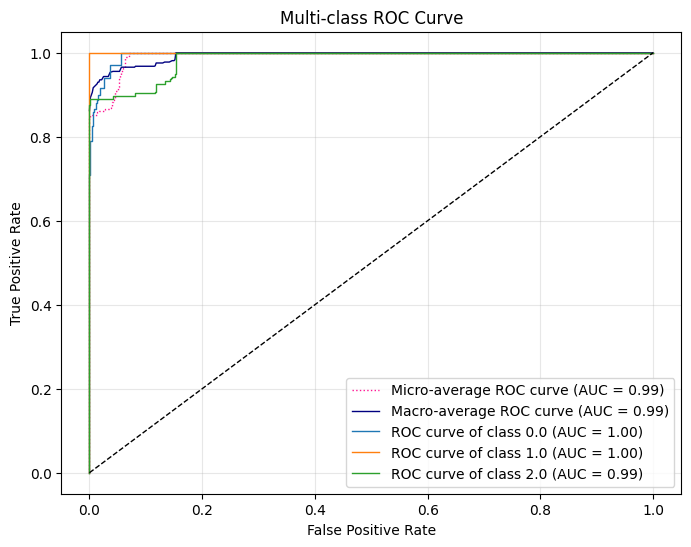

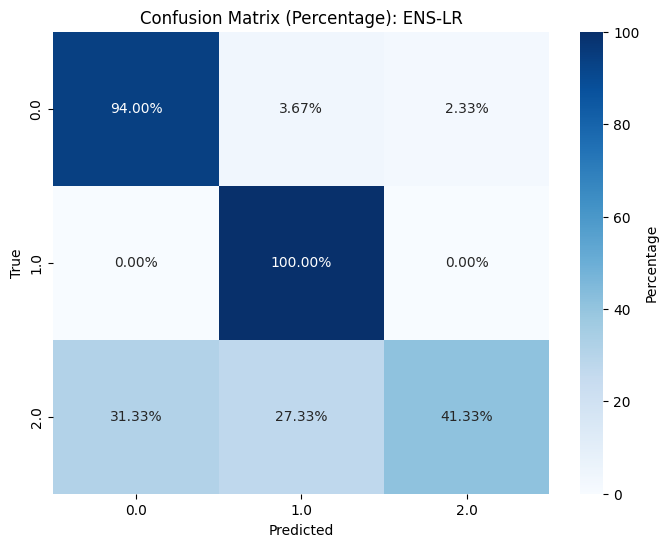

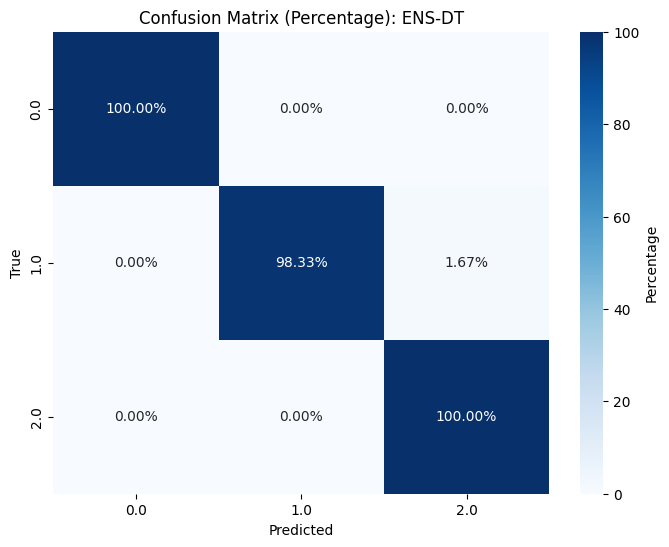

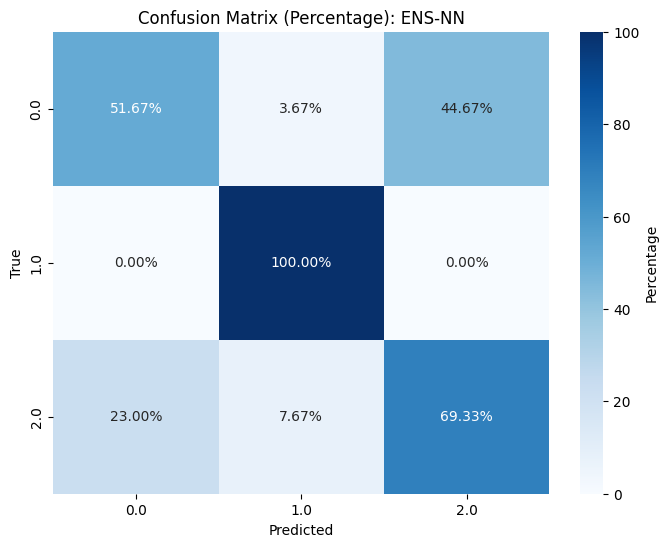

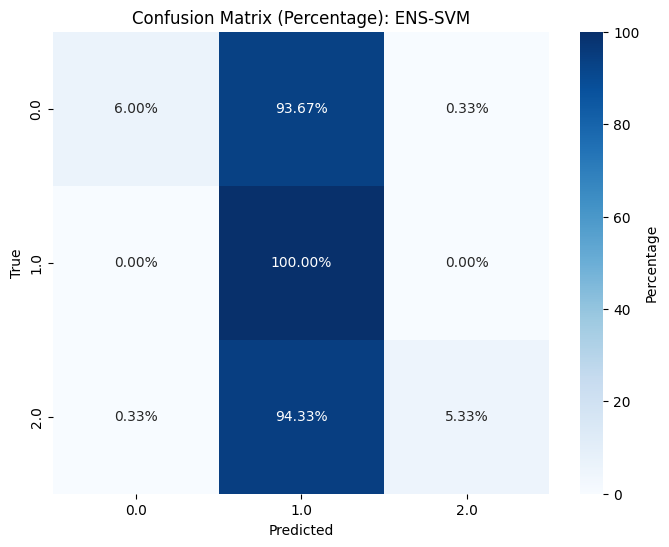

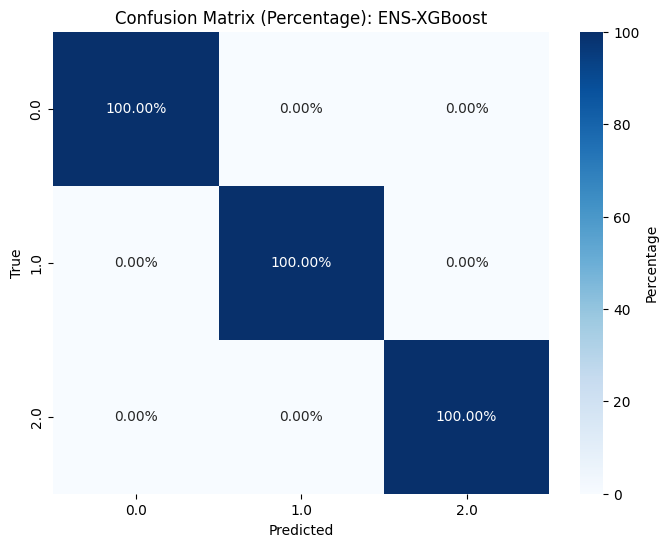

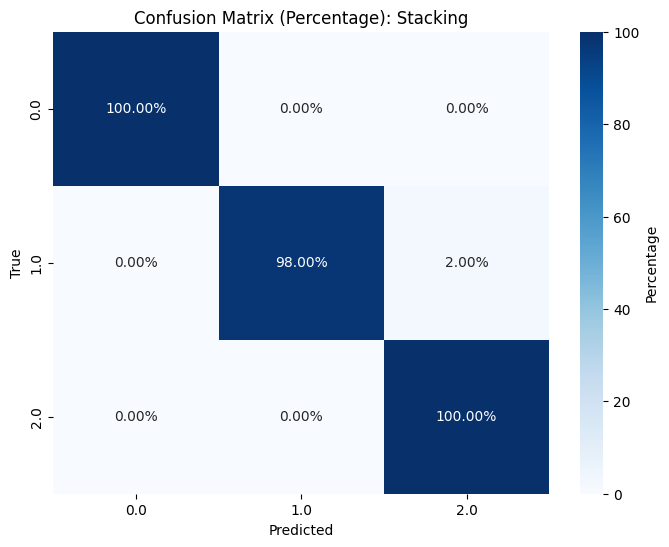

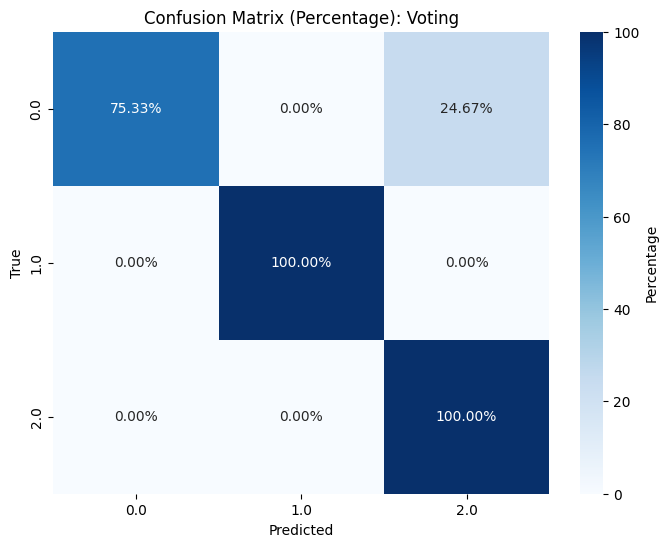

Classification Report for ENS-LR:
              precision    recall  f1-score     support
0.0            0.750000  0.940000  0.834320  300.000000
1.0            0.763359  1.000000  0.865801  300.000000
2.0            0.946565  0.413333  0.575406  300.000000
accuracy       0.784444  0.784444  0.784444    0.784444
macro avg      0.819975  0.784444  0.758509  900.000000
weighted avg   0.819975  0.784444  0.758509  900.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            1.000000  1.000000  1.000000  300.000000
1.0            1.000000  0.983333  0.991597  300.000000
2.0            0.983607  1.000000  0.991736  300.000000
accuracy       0.994444  0.994444  0.994444    0.994444
macro avg      0.994536  0.994444  0.994444  900.000000
weighted avg   0.994536  0.994444  0.994444  900.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.691964  0.516667  0.591603  300.000000
1.

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.784444,0.844930,0.784444,0.784444,0.758509
1,ENS-DT,0.994444,0.995833,0.994444,0.994444,0.994444
2,ENS-NN,0.736667,0.759738,0.736667,0.736667,0.728650
3,ENS-SVM,0.371111,0.793141,0.371111,0.371111,0.243088
4,ENS-XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000
5,Stacking,0.993333,1.000000,0.993333,0.993333,0.993333
6,Voting,0.917778,0.993552,0.917778,0.917778,0.916508



Processing dataset: UNSW-NB15
Shape of UNSW-NB15: (2540047, 49)
Number of unique classes in 'label': 2


Version 0.12.1 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9949999999999999

Generation 2 - Current best internal CV score: 0.9949999999999999

Generation 3 - Current best internal CV score: 0.9949999999999999

Generation 4 - Current best internal CV score: 0.9949999999999999

Generation 5 - Current best internal CV score: 0.9949999999999999

Best pipeline: ExtraTreesClassifier(input_matrix, bootstrap=True, criterion=entropy, max_features=0.8, min_samples_leaf=19, min_samples_split=5, n_estimators=100)
done3
done4


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.995000,0.992256,0.995000,0.995000,0.995000
1,ENS-DT,0.996667,0.996667,0.996667,0.996667,0.996667
2,ENS-NN,0.993333,0.998100,0.993333,0.993333,0.993333
3,ENS-SVM,0.993333,0.994944,0.993333,0.993333,0.993333
4,ENS-XGBoost,0.995000,0.999989,0.995000,0.995000,0.995000
5,Stacking,0.995000,0.999978,0.995000,0.995000,0.995000
6,Voting,0.993333,0.999989,0.993333,0.993333,0.993333


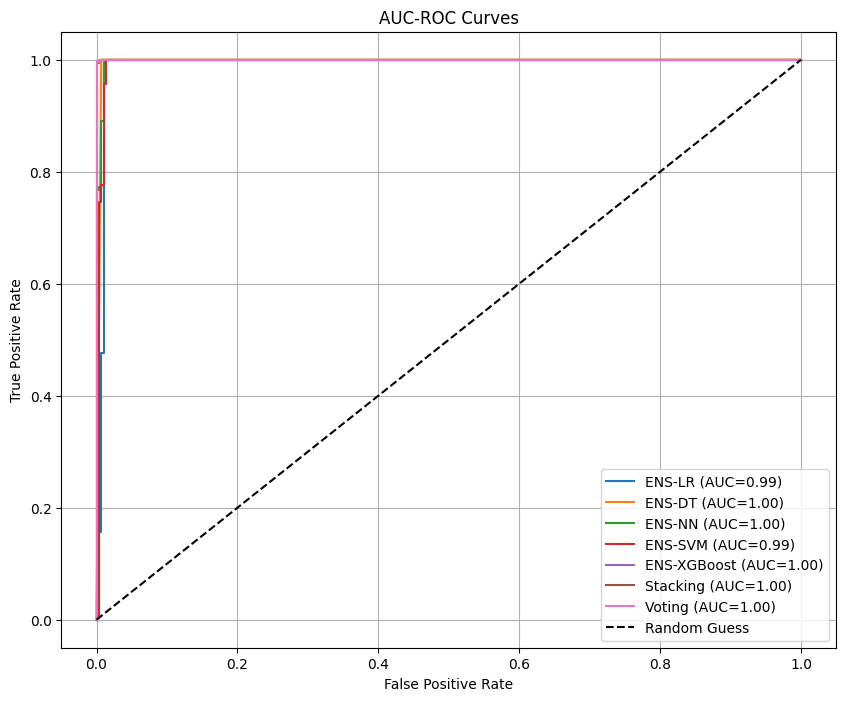

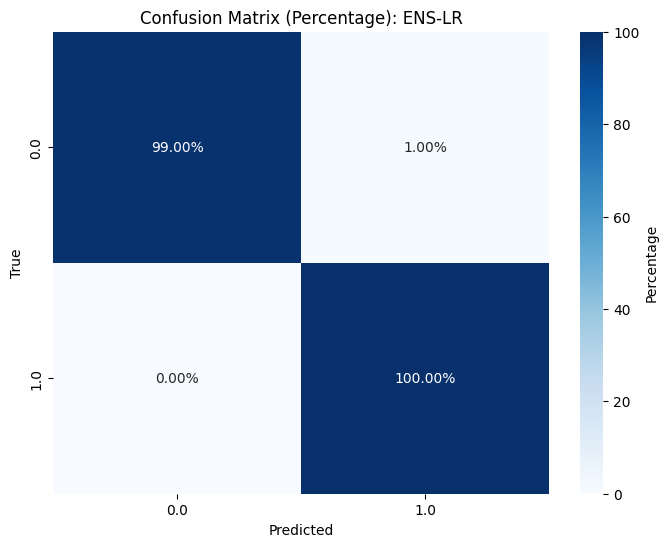

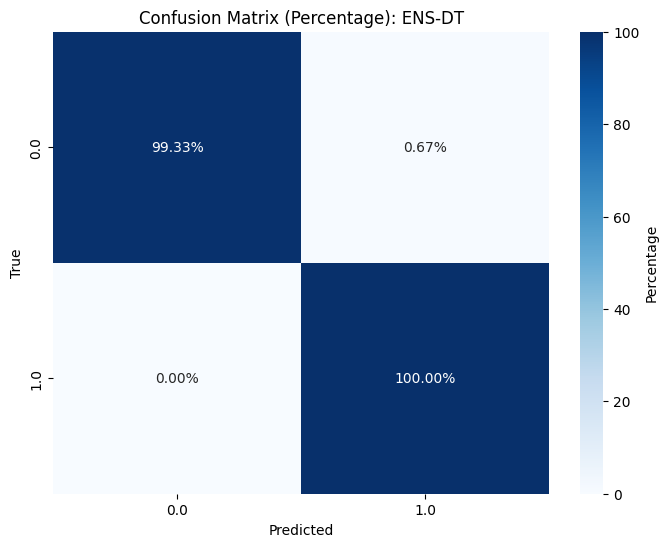

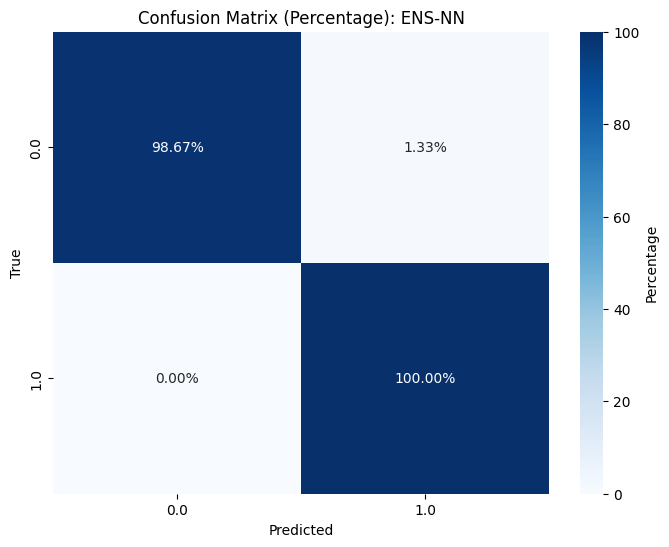

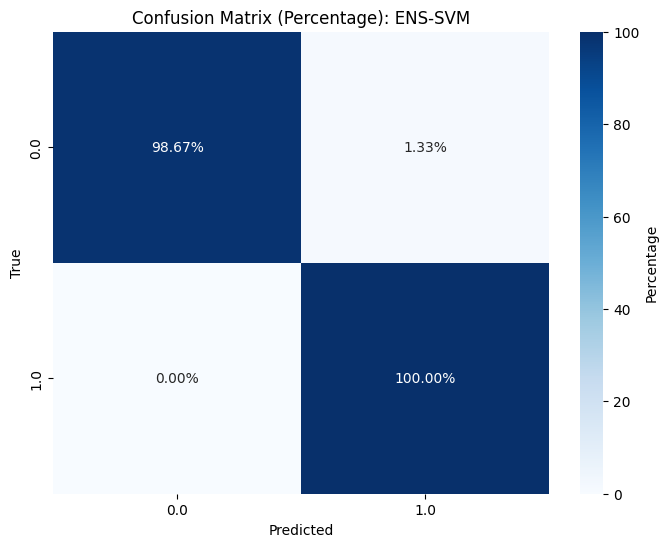

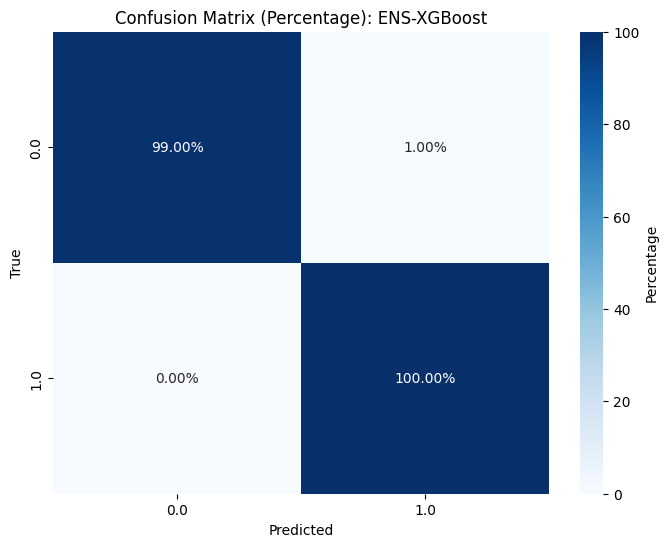

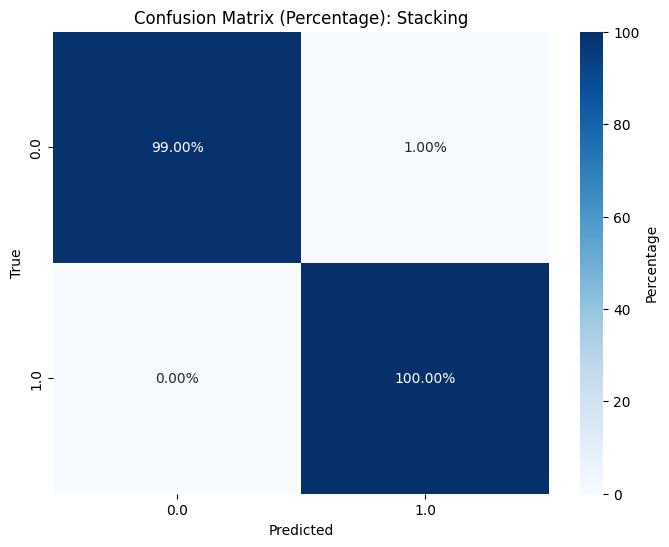

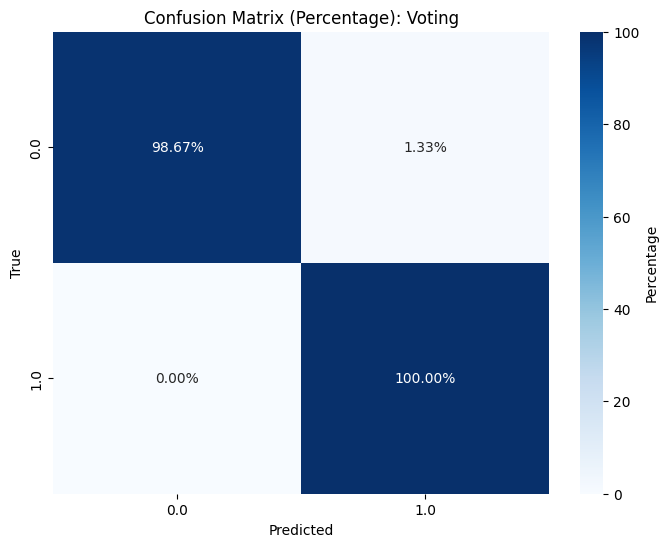

Classification Report for ENS-LR:
              precision  recall  f1-score  support
0.0            1.000000   0.990  0.994975  300.000
1.0            0.990099   1.000  0.995025  300.000
accuracy       0.995000   0.995  0.995000    0.995
macro avg      0.995050   0.995  0.995000  600.000
weighted avg   0.995050   0.995  0.995000  600.000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            1.000000  0.993333  0.996656  300.000000
1.0            0.993377  1.000000  0.996678  300.000000
accuracy       0.996667  0.996667  0.996667    0.996667
macro avg      0.996689  0.996667  0.996667  600.000000
weighted avg   0.996689  0.996667  0.996667  600.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            1.000000  0.986667  0.993289  300.000000
1.0            0.986842  1.000000  0.993377  300.000000
accuracy       0.993333  0.993333  0.993333    0.993333
macro avg      0.993421  0.99333

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.995000,0.992256,0.995000,0.995000,0.995000
1,ENS-DT,0.996667,0.996667,0.996667,0.996667,0.996667
2,ENS-NN,0.993333,0.998100,0.993333,0.993333,0.993333
3,ENS-SVM,0.993333,0.994944,0.993333,0.993333,0.993333
4,ENS-XGBoost,0.995000,0.999989,0.995000,0.995000,0.995000
5,Stacking,0.995000,0.999978,0.995000,0.995000,0.995000
6,Voting,0.993333,0.999989,0.993333,0.993333,0.993333



Processing dataset: CICIDS2017
Shape of CICIDS2017: (692703, 79)
Number of unique classes in ' Label': 6


Version 0.12.1 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9917293569219389

Generation 2 - Current best internal CV score: 0.9917293569219389

Generation 3 - Current best internal CV score: 0.992301189590776

Generation 4 - Current best internal CV score: 0.9948685435133366

Generation 5 - Current best internal CV score: 0.9948685435133366

Best pipeline: GradientBoostingClassifier(input_matrix, learning_rate=0.5, max_depth=8, max_features=0.15000000000000002, min_samples_leaf=1, min_samples_split=16, n_estimators=100, subsample=0.9500000000000001)
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.633644,0.953815,0.633644,0.652778,0.661334
1,ENS-DT,0.992021,0.995836,0.992021,0.993333,0.993335
2,ENS-NN,0.815824,0.914705,0.815824,0.846111,0.828314
3,ENS-SVM,0.744016,0.948537,0.744016,0.621667,0.628555
4,ENS-XGBoost,0.993351,0.999518,0.993351,0.994444,0.994441
5,Stacking,0.994016,0.999264,0.994016,0.995000,0.995002
6,Voting,0.925532,0.995921,0.925532,0.937778,0.937800


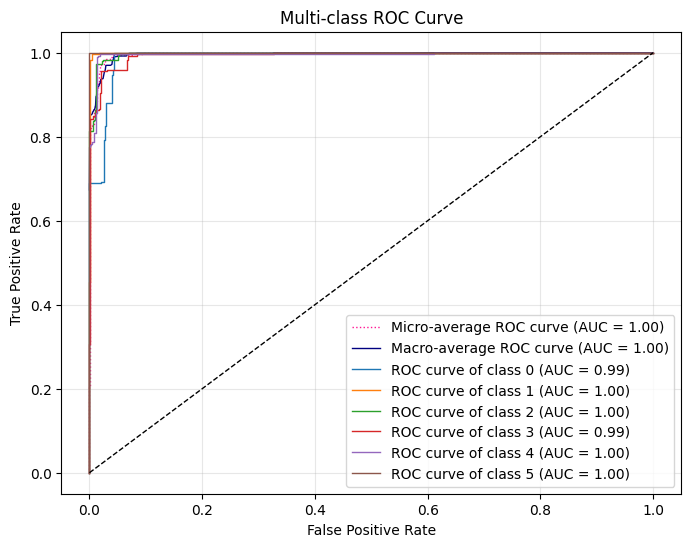

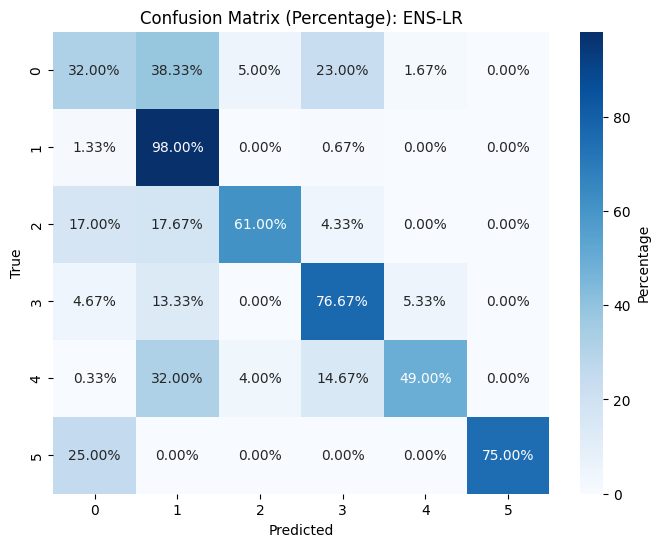

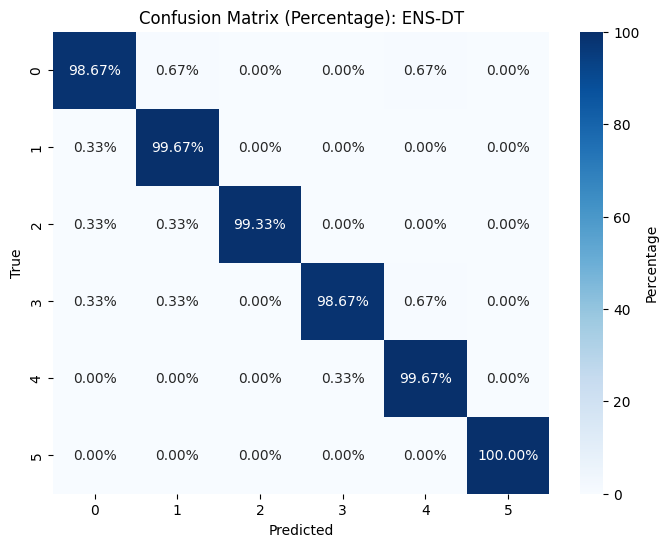

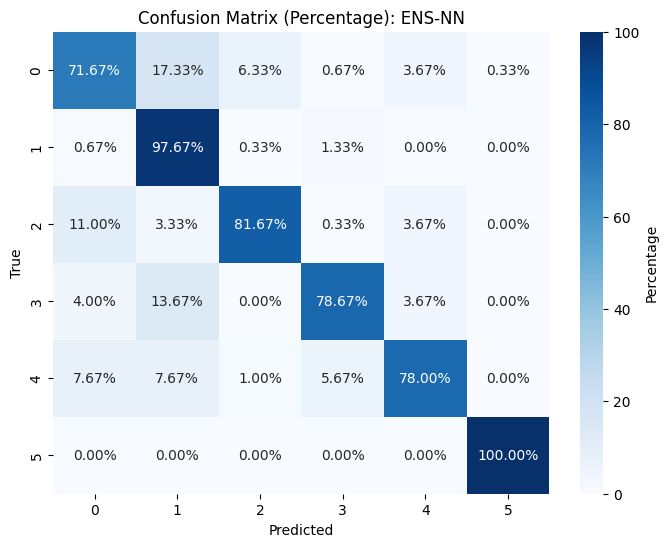

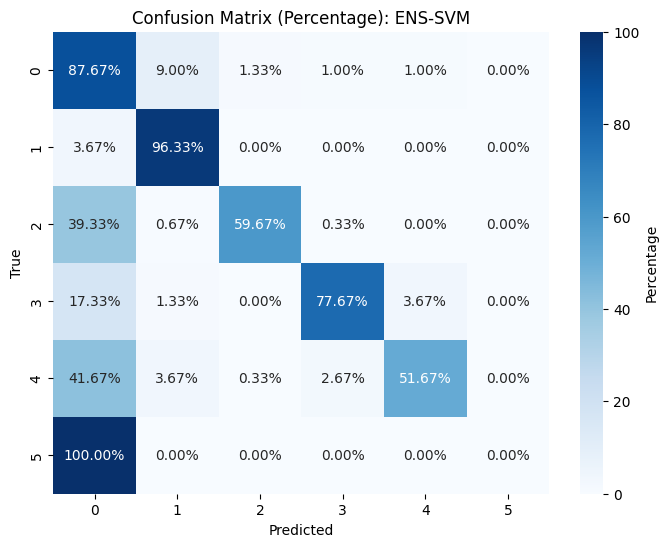

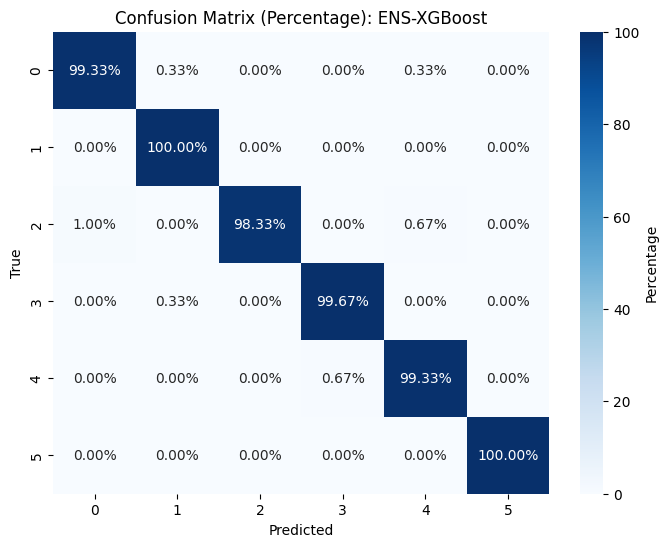

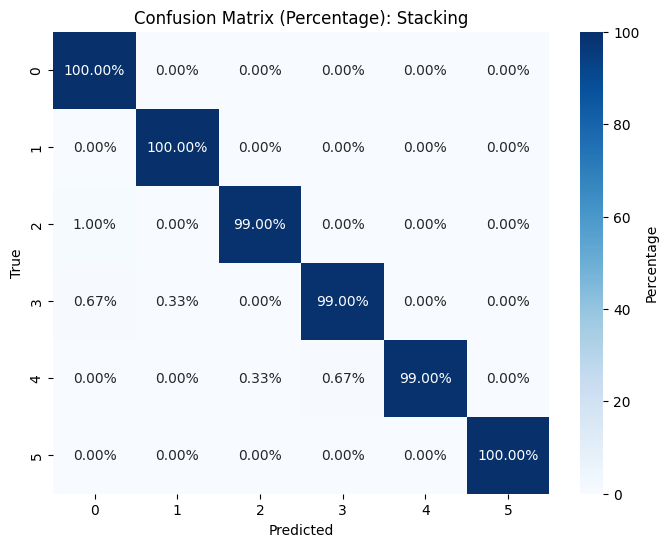

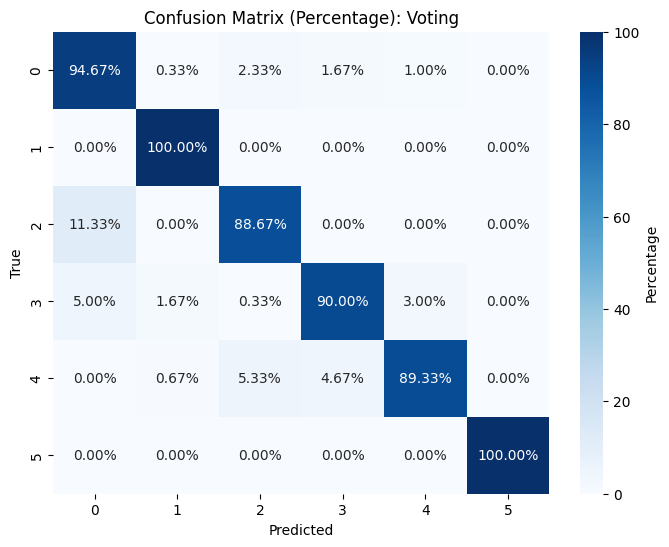

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.574850  0.320000  0.411135   300.000000
1              0.491639  0.980000  0.654788   300.000000
2              0.871429  0.610000  0.717647   300.000000
3              0.642458  0.766667  0.699088   300.000000
4              0.875000  0.490000  0.628205   300.000000
5              1.000000  0.750000  0.857143     4.000000
accuracy       0.633644  0.633644  0.633644     0.633644
macro avg      0.742563  0.652778  0.661334  1504.000000
weighted avg   0.691897  0.633644  0.622798  1504.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.989967  0.986667  0.988314   300.000000
1              0.986799  0.996667  0.991708   300.000000
2              1.000000  0.993333  0.996656   300.000000
3              0.996633  0.986667  0.991625   300.000000
4              0.986799  0.996667  0.991708   300.000000
5              1.000

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.633644,0.953815,0.633644,0.652778,0.661334
1,ENS-DT,0.992021,0.995836,0.992021,0.993333,0.993335
2,ENS-NN,0.815824,0.914705,0.815824,0.846111,0.828314
3,ENS-SVM,0.744016,0.948537,0.744016,0.621667,0.628555
4,ENS-XGBoost,0.993351,0.999518,0.993351,0.994444,0.994441
5,Stacking,0.994016,0.999264,0.994016,0.995000,0.995002
6,Voting,0.925532,0.995921,0.925532,0.937778,0.937800



Processing dataset: KDD CUP 99
Shape of KDD CUP 99: (494021, 43)
Number of unique classes in 'Attack Type': 5


Version 0.12.1 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.985542265941327

Generation 2 - Current best internal CV score: 0.9865992249795067

Generation 3 - Current best internal CV score: 0.9918896092605014

Generation 4 - Current best internal CV score: 0.9950642124351046

Generation 5 - Current best internal CV score: 0.9950642124351046

Best pipeline: XGBClassifier(input_matrix, learning_rate=0.1, max_depth=4, min_child_weight=2, n_estimators=100, n_jobs=1, subsample=0.45, verbosity=0)
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.564145,0.801476,0.564145,0.457333,0.444108
1,ENS-DT,0.980263,0.983592,0.980263,0.972167,0.952648
2,ENS-NN,0.852796,0.826521,0.852796,0.726833,0.742619
3,ENS-SVM,0.267270,0.826576,0.267270,0.216667,0.111881
4,ENS-XGBoost,0.995888,0.999859,0.995888,0.996667,0.985566
5,Stacking,0.993421,0.999636,0.993421,0.982833,0.972468
6,Voting,0.967105,0.999180,0.967105,0.795833,0.802056


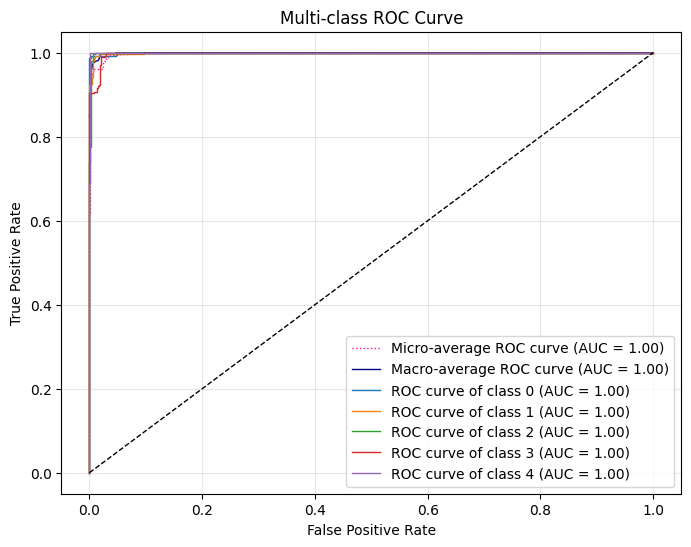

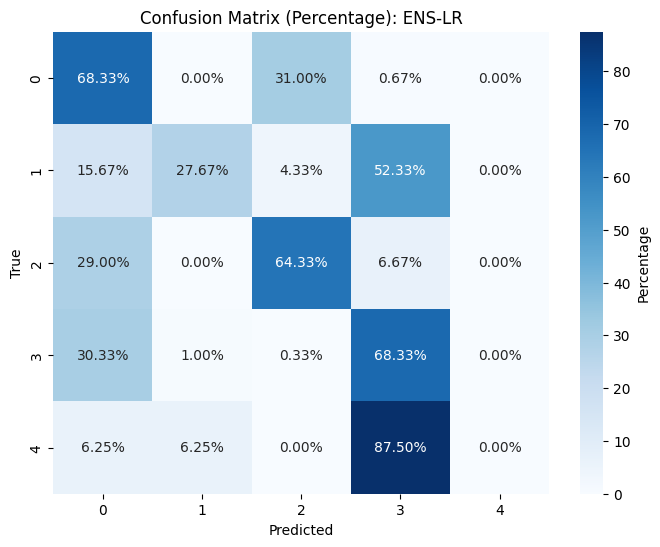

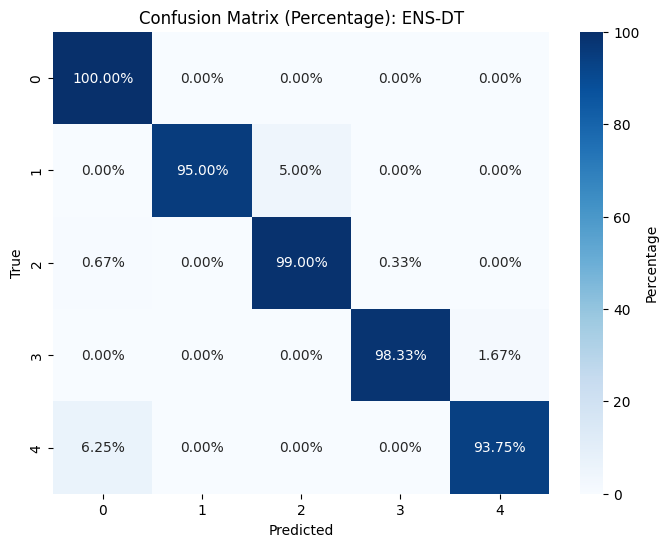

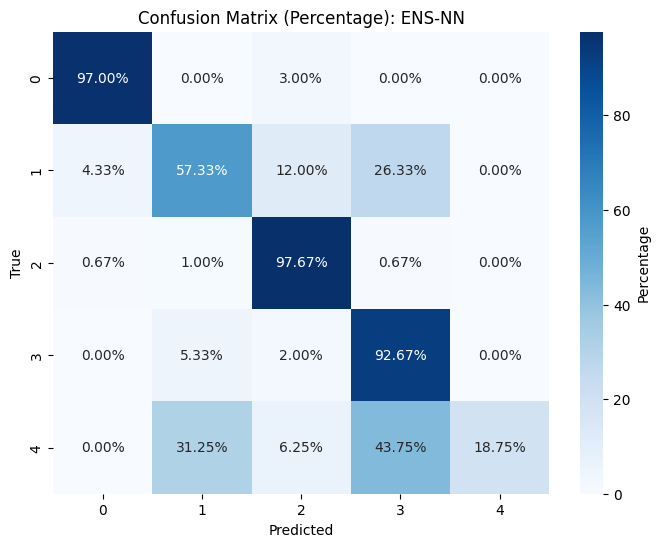

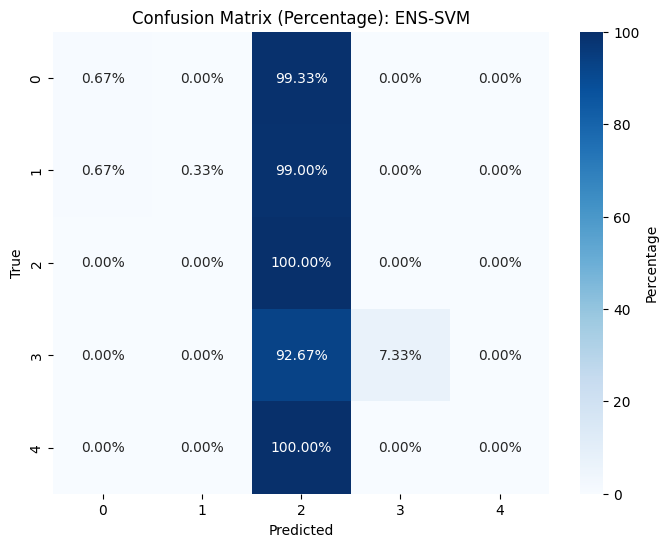

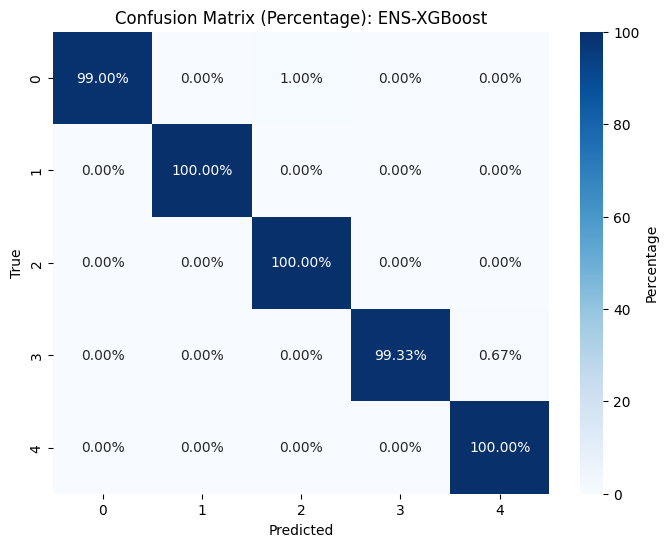

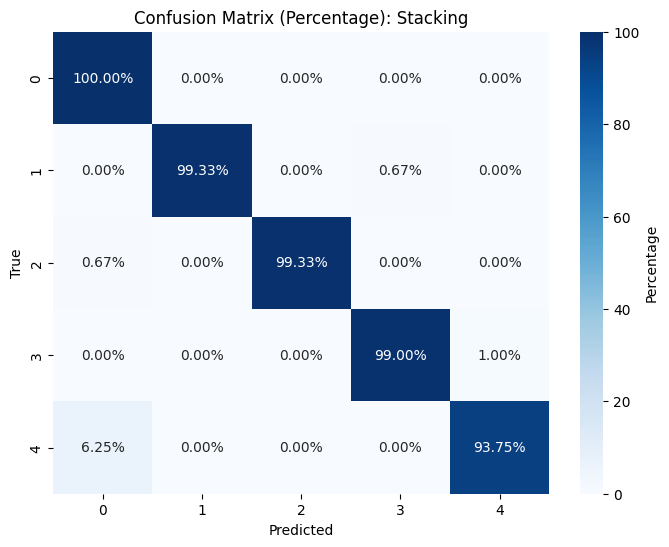

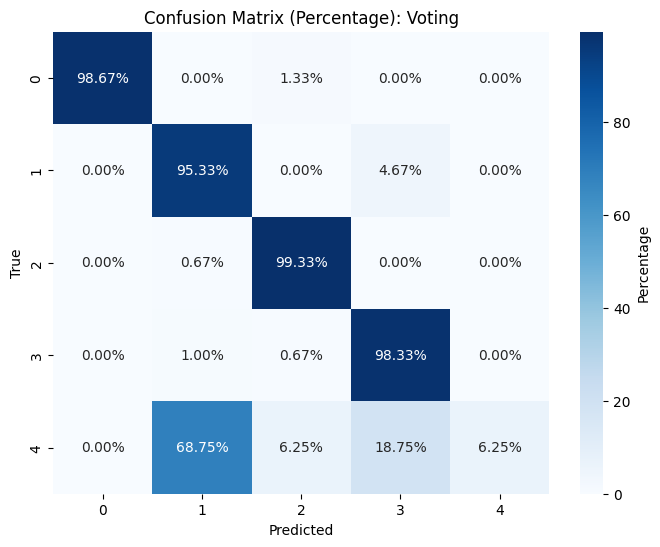

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.475638  0.683333  0.560876   300.000000
1              0.954023  0.276667  0.428941   300.000000
2              0.643333  0.643333  0.643333   300.000000
3              0.515075  0.683333  0.587393   300.000000
4              0.000000  0.000000  0.000000    16.000000
accuracy       0.564145  0.564145  0.564145     0.564145
macro avg      0.517614  0.457333  0.444108  1216.000000
weighted avg   0.638504  0.564145  0.547831  1216.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.990099  1.000000  0.995025   300.000000
1              1.000000  0.950000  0.974359   300.000000
2              0.951923  0.990000  0.970588   300.000000
3              0.996622  0.983333  0.989933   300.000000
4              0.750000  0.937500  0.833333    16.000000
accuracy       0.980263  0.980263  0.980263     0.980263
macro avg      0.937

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.564145,0.801476,0.564145,0.457333,0.444108
1,ENS-DT,0.980263,0.983592,0.980263,0.972167,0.952648
2,ENS-NN,0.852796,0.826521,0.852796,0.726833,0.742619
3,ENS-SVM,0.267270,0.826576,0.267270,0.216667,0.111881
4,ENS-XGBoost,0.995888,0.999859,0.995888,0.996667,0.985566
5,Stacking,0.993421,0.999636,0.993421,0.982833,0.972468
6,Voting,0.967105,0.999180,0.967105,0.795833,0.802056


In [33]:
datasets = {
    "NSL-KDD": nsl_kdd_data,
    "UNSW-NB15": all_data,
    "CICIDS2017": cicd2017,
    "KDD CUP 99": kdd_cup_df
}

target_columns = {
    "NSL-KDD": 'labels',
    "UNSW-NB15": "label",
    "CICIDS2017": ' Label',
    "KDD CUP 99": 'Attack Type'
}


for dataset_name, path in datasets.items():
    print(f"\nProcessing dataset: {dataset_name}")
    target_col = target_columns[dataset_name]
    
    # Preprocess dataset
    df = preprocess_data(path)
    print(f"Shape of {dataset_name}: {df.shape}")
    print(f"Number of unique classes in '{target_col}': {len(df[target_col].unique())}")
    
    # Sample data from each class
    class_counts = df[target_col].value_counts()
    sampled_data = []
    for class_label, count in class_counts.items():
        if count >= 1000:
            sampled_class = df[df[target_col] == class_label].sample(n=1000, random_state=42)
        else:
            sampled_class = df[df[target_col] == class_label]
        sampled_data.append(sampled_class)
    df = pd.concat(sampled_data).reset_index(drop=True)
    
    # Split data
    X = df.drop(columns=[target_col])
    y = df[target_col]
    train_X, test_X, train_y, test_y = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )
    
    # Step 2: AutoML Feature Selection
    selected_features = automl_feature_selection(train_X, train_y)
    train_X = train_X[selected_features]
    test_X = test_X[selected_features]
    print('done3')
    
    # Step 3: Add Clustering Features
    train_X = add_cluster_features(train_X)
    test_X = add_cluster_features(test_X)
    print('done4')
    
    # Step 4: Train and Evaluate Models
    results = train_ensemble_models(train_X, train_y, test_X, test_y, class_names=sorted(test_y.unique()))
    display(results)


# Hybrid FS


Processing dataset: NSL-KDD
Shape of NSL-KDD: (148517, 44)
Number of unique classes in 'labels': 3
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.700000,0.834259,0.700000,0.700000,0.672007
1,ENS-DT,0.995556,0.996667,0.995556,0.995556,0.995556
2,ENS-NN,0.901111,0.931790,0.901111,0.901111,0.900889
3,ENS-SVM,0.371111,0.782246,0.371111,0.371111,0.243088
4,ENS-XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000
5,Stacking,1.000000,1.000000,1.000000,1.000000,1.000000
6,Voting,0.984444,0.999313,0.984444,0.984444,0.984461


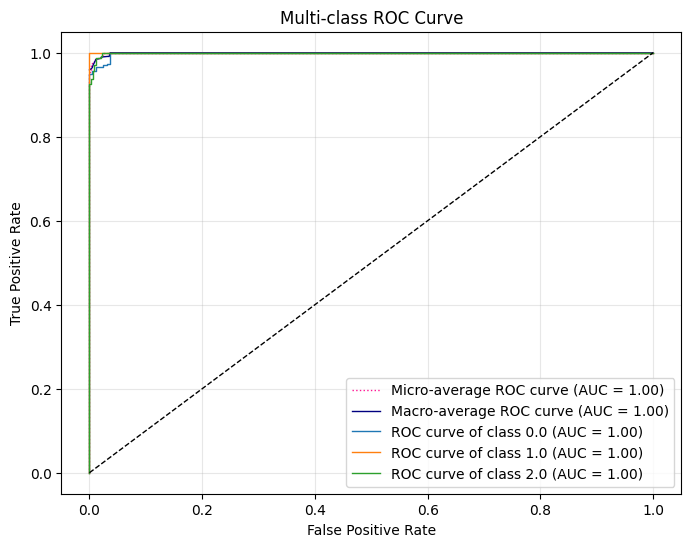

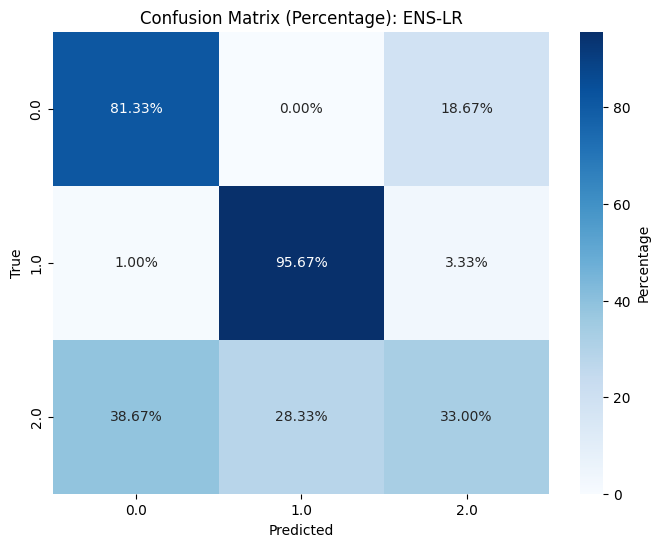

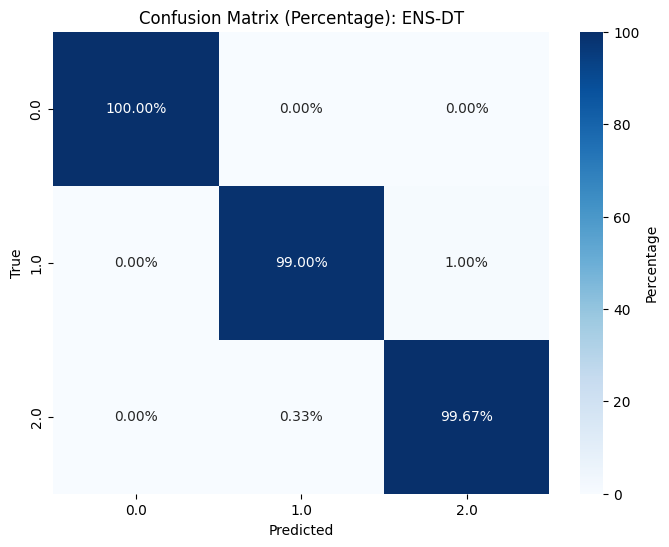

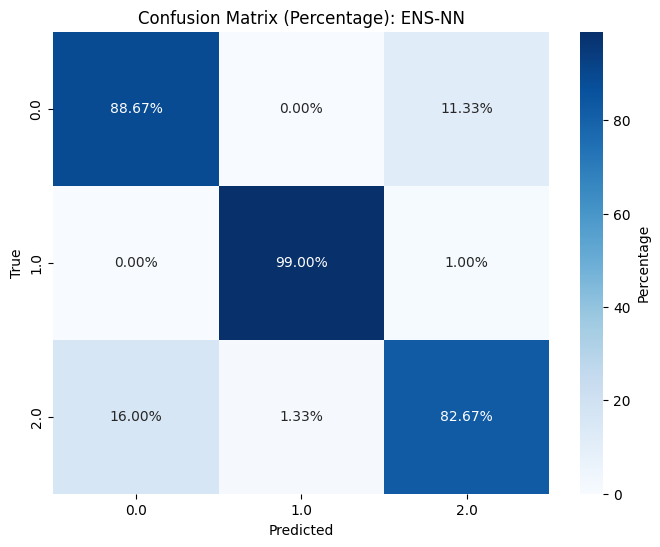

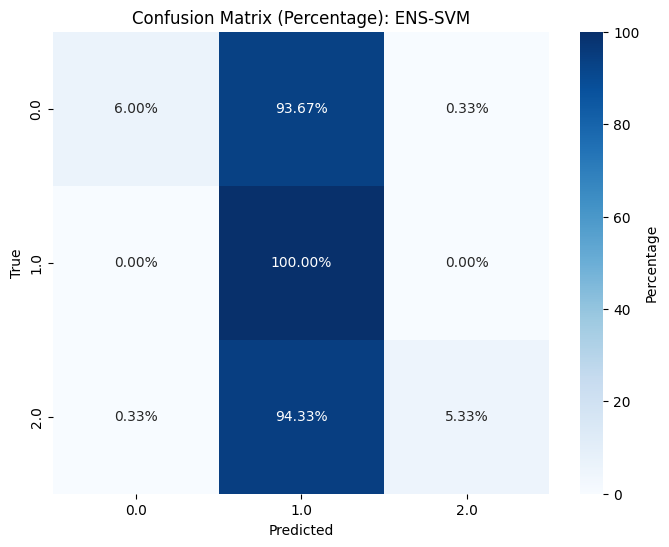

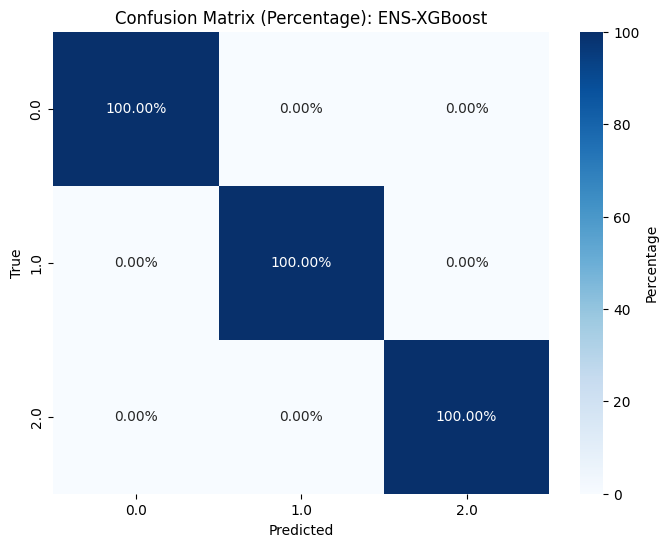

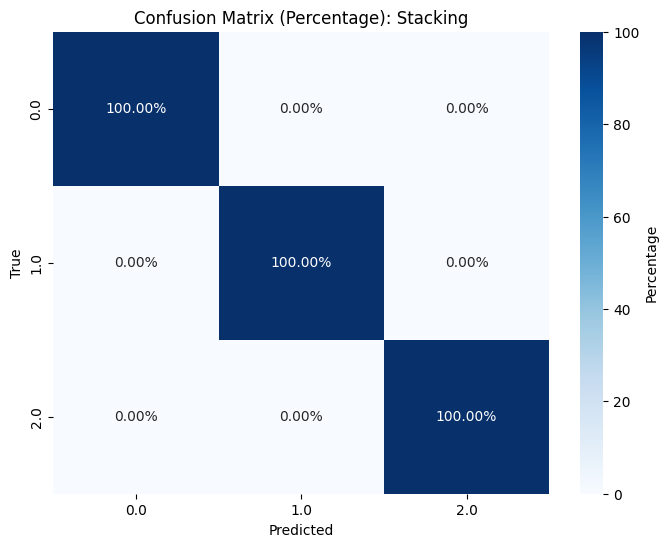

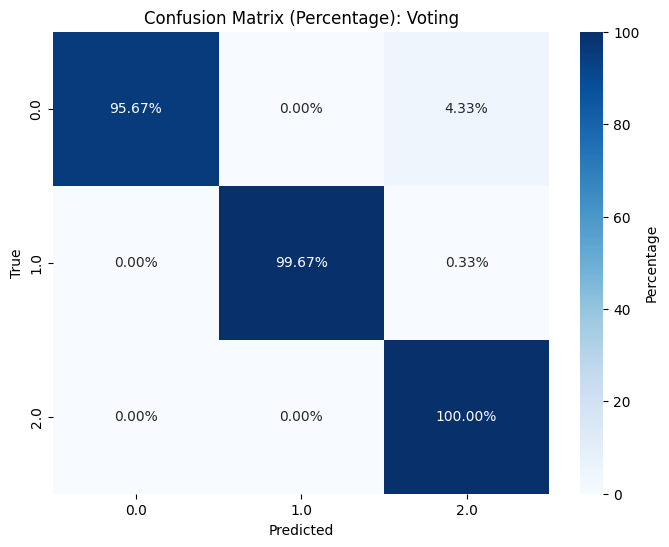

Classification Report for ENS-LR:
              precision    recall  f1-score  support
0.0            0.672176  0.813333  0.736048    300.0
1.0            0.771505  0.956667  0.854167    300.0
2.0            0.600000  0.330000  0.425806    300.0
accuracy       0.700000  0.700000  0.700000      0.7
macro avg      0.681227  0.700000  0.672007    900.0
weighted avg   0.681227  0.700000  0.672007    900.0
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            1.000000  1.000000  1.000000  300.000000
1.0            0.996644  0.990000  0.993311  300.000000
2.0            0.990066  0.996667  0.993355  300.000000
accuracy       0.995556  0.995556  0.995556    0.995556
macro avg      0.995570  0.995556  0.995556  900.000000
weighted avg   0.995570  0.995556  0.995556  900.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.847134  0.886667  0.866450  300.000000
1.0            0.986711

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.700000,0.834259,0.700000,0.700000,0.672007
1,ENS-DT,0.995556,0.996667,0.995556,0.995556,0.995556
2,ENS-NN,0.901111,0.931790,0.901111,0.901111,0.900889
3,ENS-SVM,0.371111,0.782246,0.371111,0.371111,0.243088
4,ENS-XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000
5,Stacking,1.000000,1.000000,1.000000,1.000000,1.000000
6,Voting,0.984444,0.999313,0.984444,0.984444,0.984461



Processing dataset: UNSW-NB15
Shape of UNSW-NB15: (2540047, 49)
Number of unique classes in 'label': 2
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4
Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.785000,0.815578,0.785000,0.785000,0.781009
1,ENS-DT,0.996667,0.996667,0.996667,0.996667,0.996667
2,ENS-NN,0.718333,0.725222,0.718333,0.718333,0.698744
3,ENS-SVM,0.853333,0.783833,0.853333,0.853333,0.852743
4,ENS-XGBoost,0.996667,1.000000,0.996667,0.996667,0.996667
5,Stacking,0.996667,0.996678,0.996667,0.996667,0.996667
6,Voting,0.940000,0.994867,0.940000,0.940000,0.939967


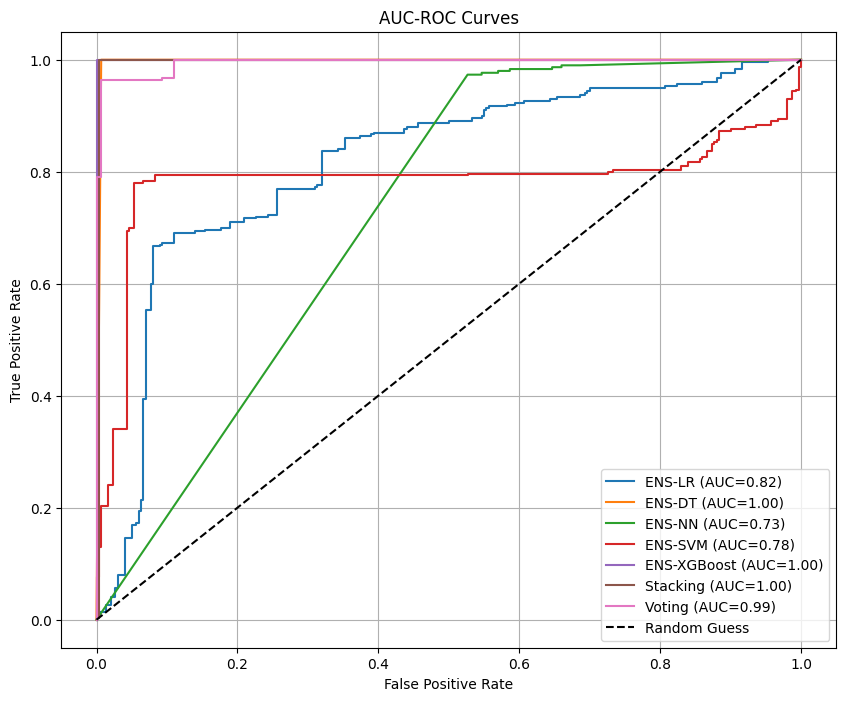

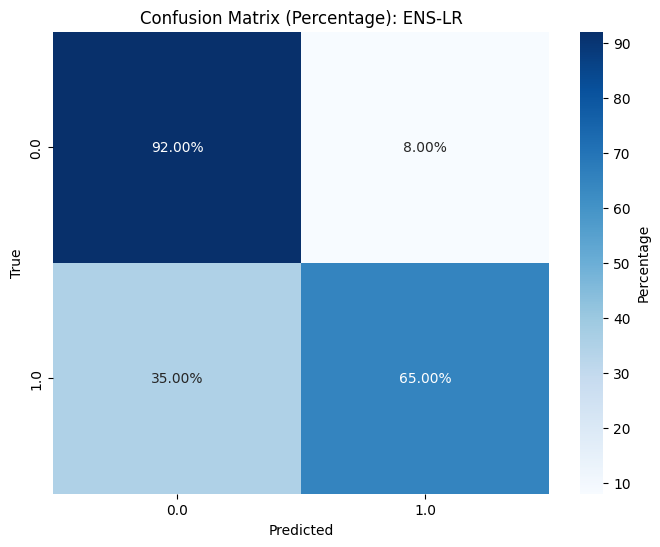

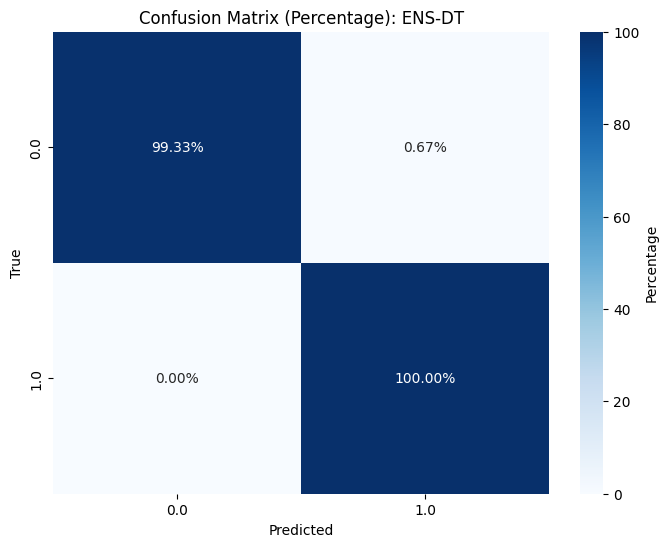

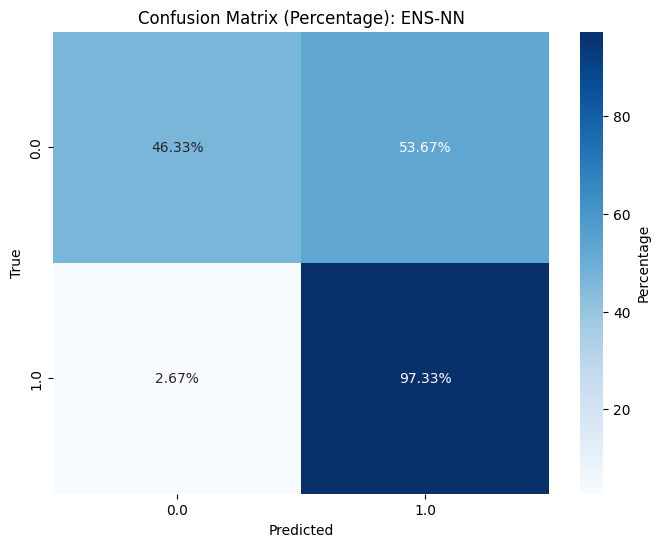

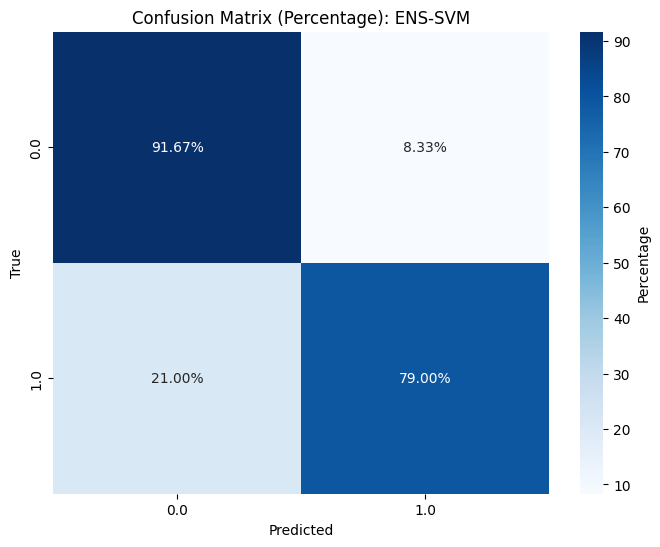

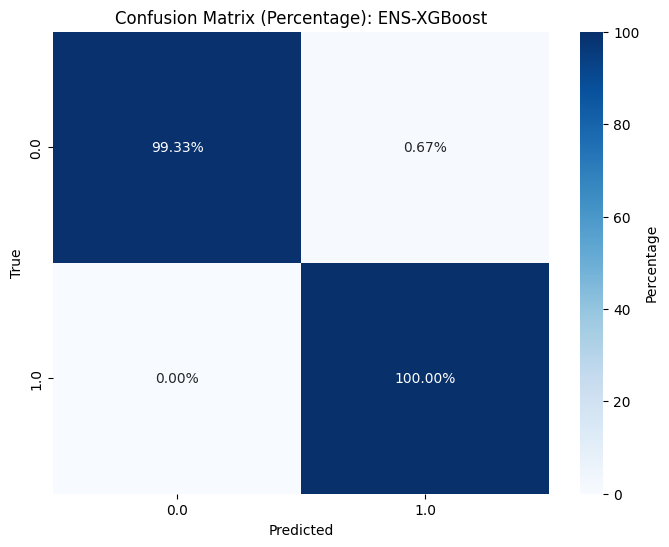

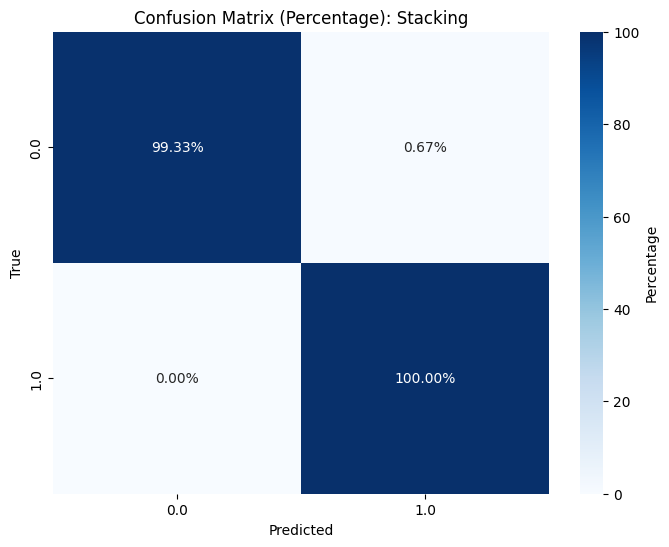

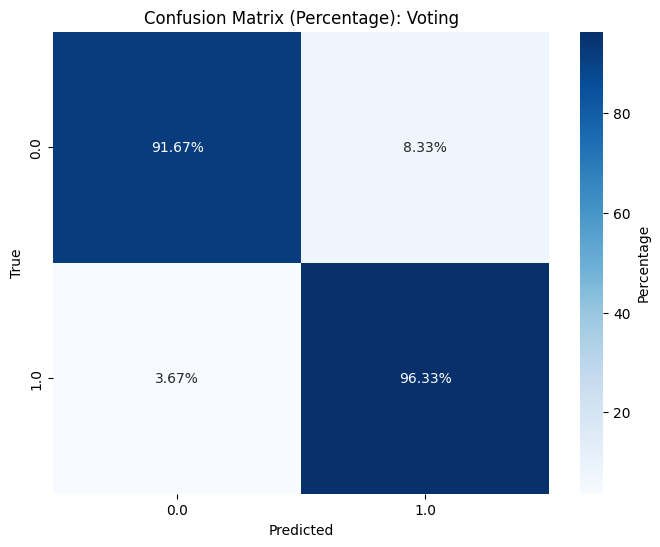

Classification Report for ENS-LR:
              precision  recall  f1-score  support
0.0            0.724409   0.920  0.810573  300.000
1.0            0.890411   0.650  0.751445  300.000
accuracy       0.785000   0.785  0.785000    0.785
macro avg      0.807410   0.785  0.781009  600.000
weighted avg   0.807410   0.785  0.781009  600.000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            1.000000  0.993333  0.996656  300.000000
1.0            0.993377  1.000000  0.996678  300.000000
accuracy       0.996667  0.996667  0.996667    0.996667
macro avg      0.996689  0.996667  0.996667  600.000000
weighted avg   0.996689  0.996667  0.996667  600.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.945578  0.463333  0.621924  300.000000
1.0            0.644592  0.973333  0.775564  300.000000
accuracy       0.718333  0.718333  0.718333    0.718333
macro avg      0.795085  0.71833

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.785000,0.815578,0.785000,0.785000,0.781009
1,ENS-DT,0.996667,0.996667,0.996667,0.996667,0.996667
2,ENS-NN,0.718333,0.725222,0.718333,0.718333,0.698744
3,ENS-SVM,0.853333,0.783833,0.853333,0.853333,0.852743
4,ENS-XGBoost,0.996667,1.000000,0.996667,0.996667,0.996667
5,Stacking,0.996667,0.996678,0.996667,0.996667,0.996667
6,Voting,0.940000,0.994867,0.940000,0.940000,0.939967



Processing dataset: CICIDS2017
Shape of CICIDS2017: (692703, 79)
Number of unique classes in ' Label': 6
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.702128,0.935373,0.702128,0.668889,0.662341
1,ENS-DT,0.989362,0.973893,0.989362,0.950000,0.967587
2,ENS-NN,0.755984,0.861748,0.755984,0.713889,0.708710
3,ENS-SVM,0.736037,0.947202,0.736037,0.615000,0.621211
4,ENS-XGBoost,0.992021,0.999486,0.992021,0.993333,0.993329
5,Stacking,0.990691,0.997854,0.990691,0.951111,0.968719
6,Voting,0.934176,0.995831,0.934176,0.945000,0.945596


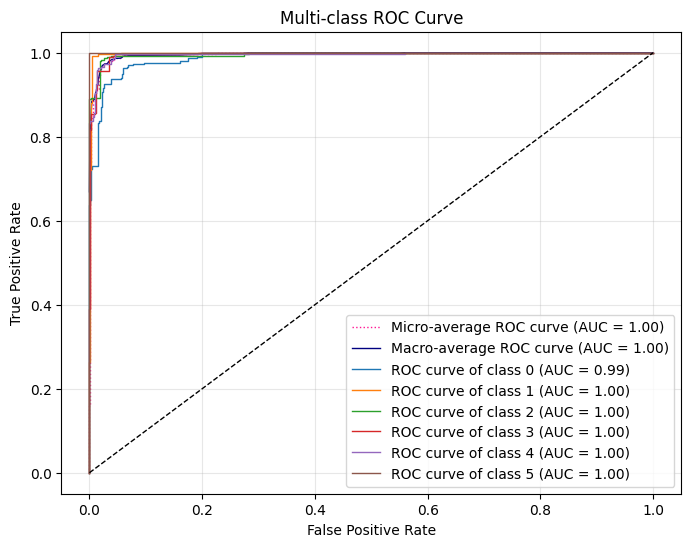

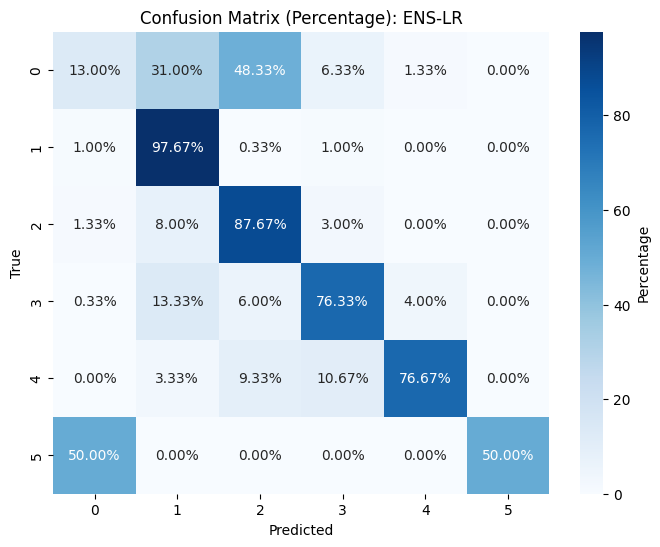

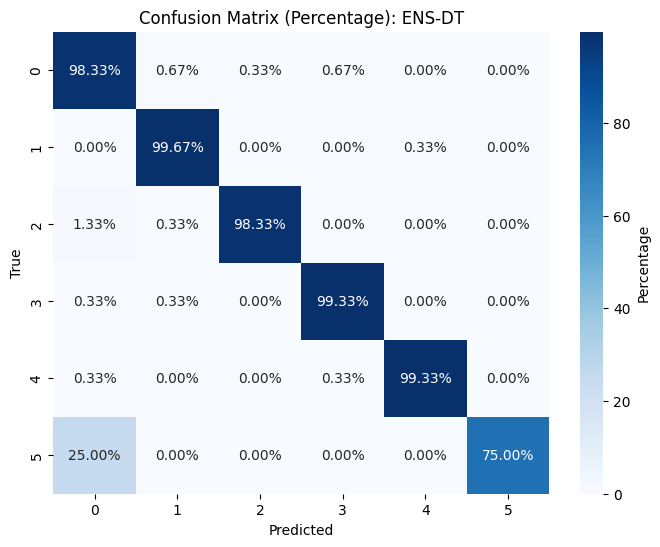

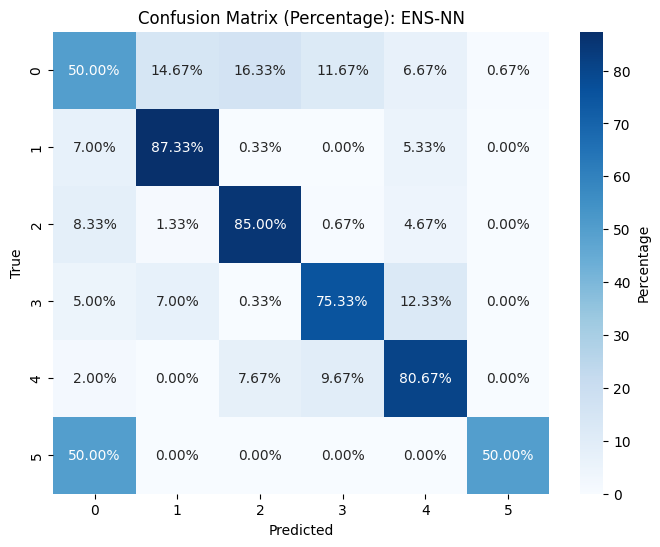

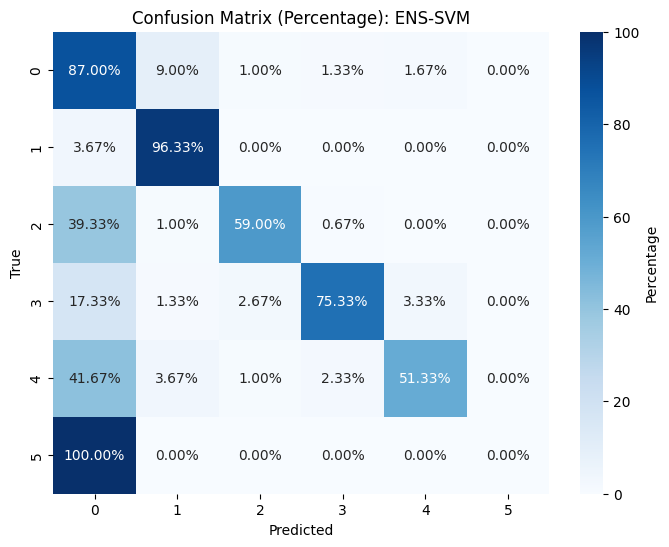

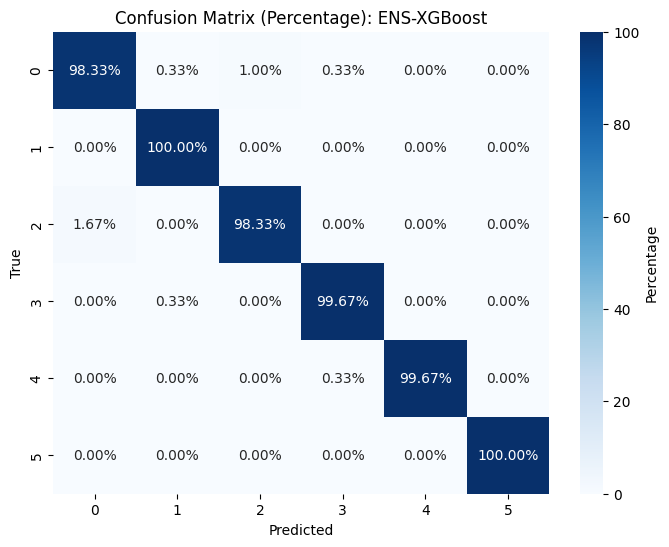

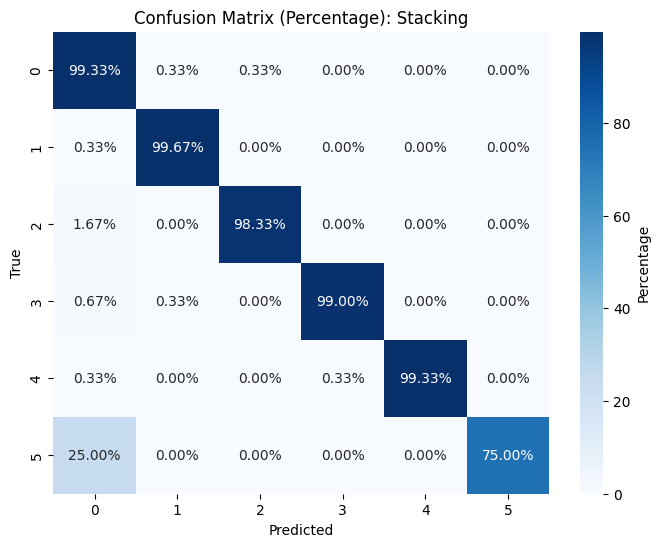

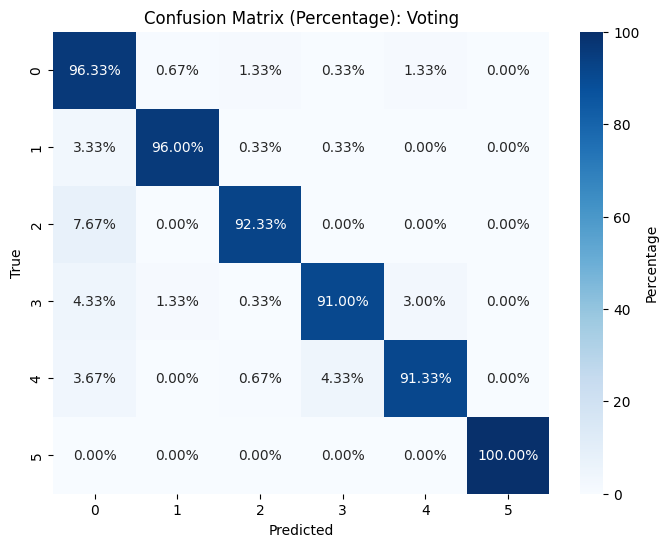

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.795918  0.130000  0.223496   300.000000
1              0.636957  0.976667  0.771053   300.000000
2              0.578022  0.876667  0.696689   300.000000
3              0.784247  0.763333  0.773649   300.000000
4              0.934959  0.766667  0.842491   300.000000
5              1.000000  0.500000  0.666667     4.000000
accuracy       0.702128  0.702128  0.702128     0.702128
macro avg      0.788350  0.668889  0.662341  1504.000000
weighted avg   0.746696  0.702128  0.661489  1504.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.976821  0.983333  0.980066   300.000000
1              0.986799  0.996667  0.991708   300.000000
2              0.996622  0.983333  0.989933   300.000000
3              0.990033  0.993333  0.991681   300.000000
4              0.996656  0.993333  0.994992   300.000000
5              1.000

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.702128,0.935373,0.702128,0.668889,0.662341
1,ENS-DT,0.989362,0.973893,0.989362,0.950000,0.967587
2,ENS-NN,0.755984,0.861748,0.755984,0.713889,0.708710
3,ENS-SVM,0.736037,0.947202,0.736037,0.615000,0.621211
4,ENS-XGBoost,0.992021,0.999486,0.992021,0.993333,0.993329
5,Stacking,0.990691,0.997854,0.990691,0.951111,0.968719
6,Voting,0.934176,0.995831,0.934176,0.945000,0.945596



Processing dataset: KDD CUP 99
Shape of KDD CUP 99: (494021, 43)
Number of unique classes in 'Attack Type': 5
done3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-30-76097d3d1df5>:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-30-76097d3d1df5>:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

done4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.585526,0.855835,0.585526,0.474667,0.442793
1,ENS-DT,0.987664,0.987601,0.987664,0.978167,0.954469
2,ENS-NN,0.893914,0.817829,0.893914,0.736500,0.740668
3,ENS-SVM,0.267270,0.824438,0.267270,0.216667,0.111881
4,ENS-XGBoost,0.994243,0.999899,0.994243,0.995333,0.974440
5,Stacking,0.994243,0.999744,0.994243,0.983500,0.968420
6,Voting,0.953125,0.997673,0.953125,0.879167,0.908499


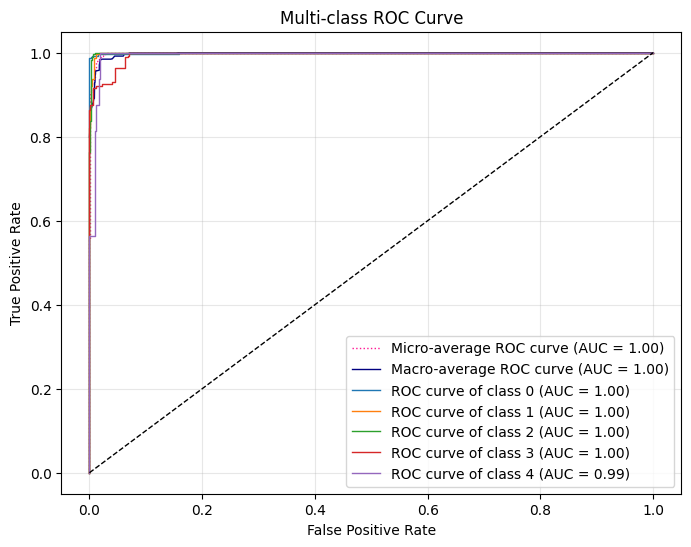

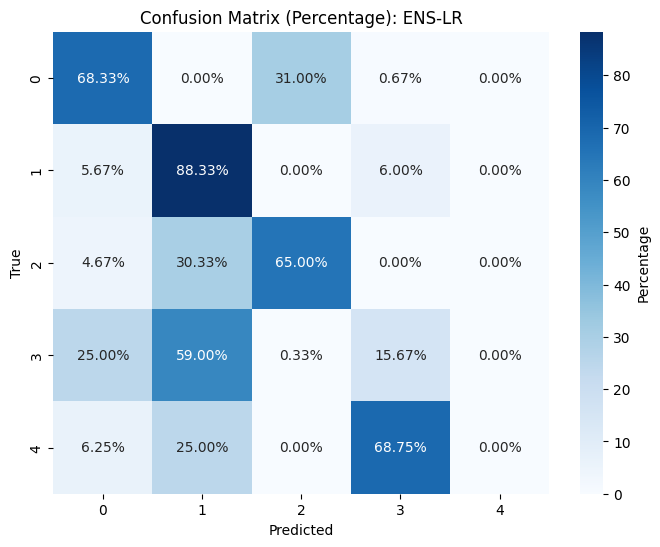

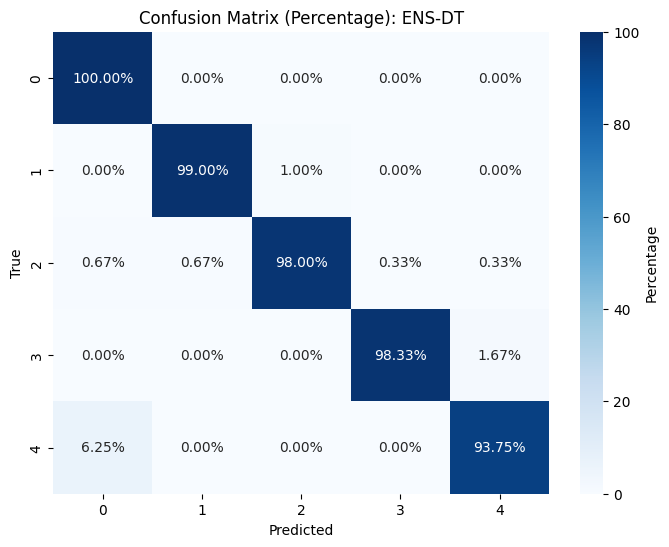

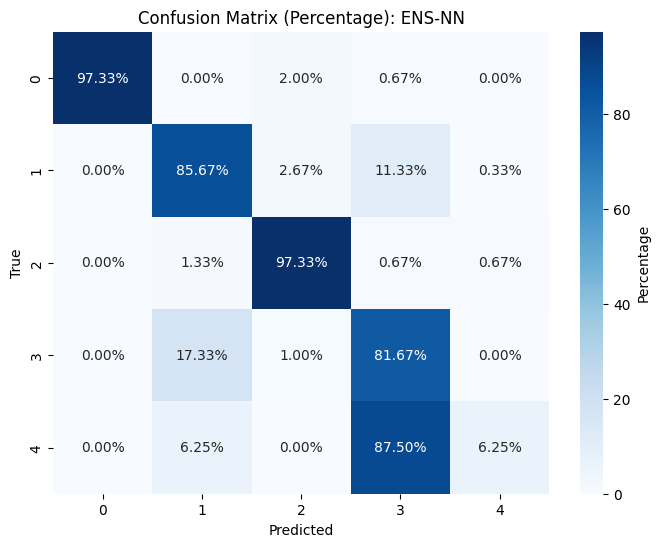

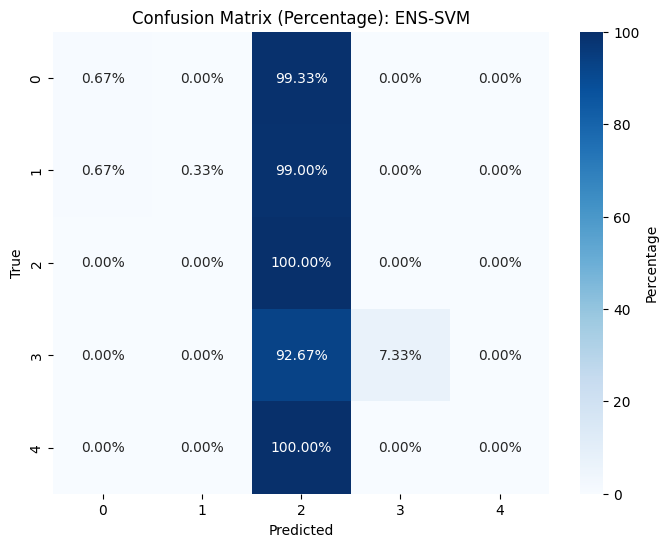

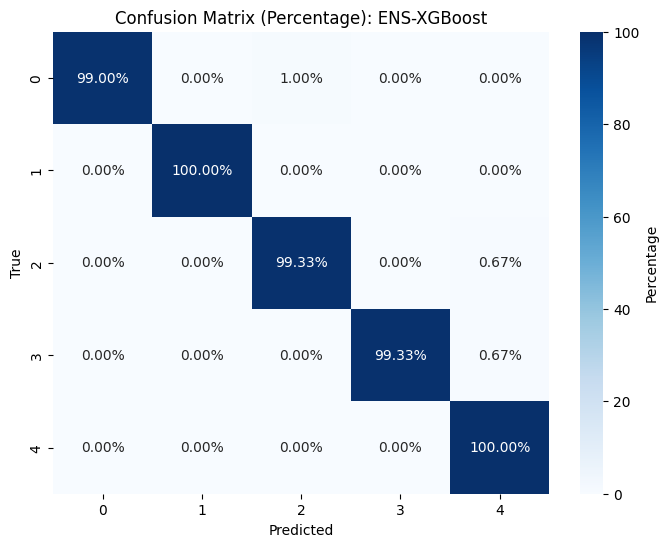

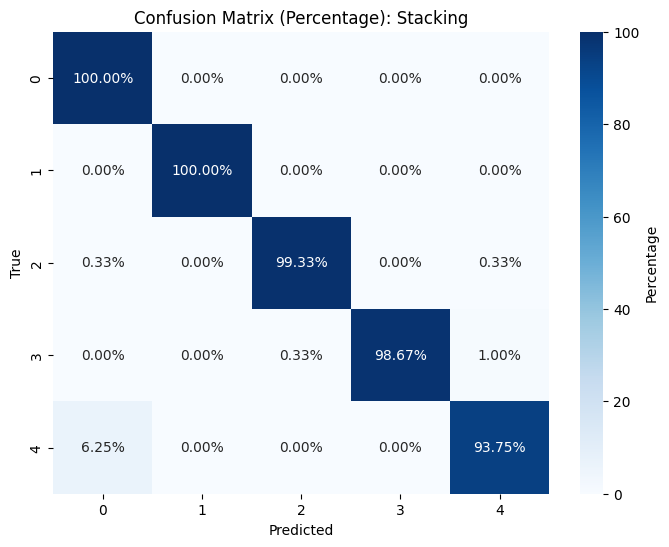

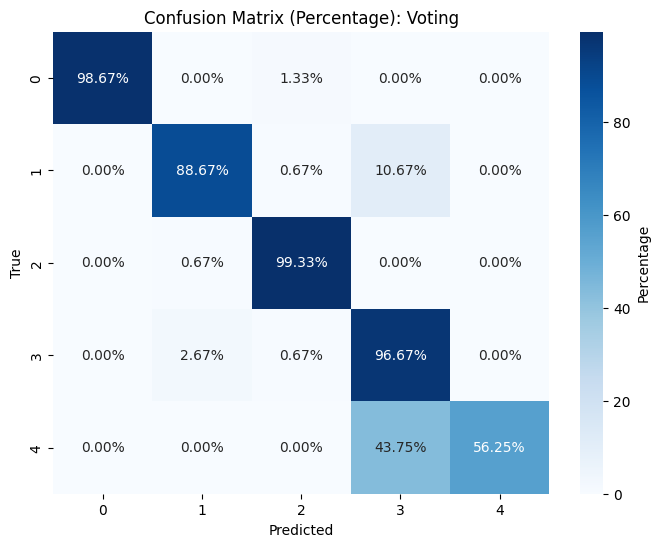

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.657051  0.683333  0.669935   300.000000
1              0.493482  0.883333  0.633214   300.000000
2              0.674740  0.650000  0.662139   300.000000
3              0.602564  0.156667  0.248677   300.000000
4              0.000000  0.000000  0.000000    16.000000
accuracy       0.585526  0.585526  0.585526     0.585526
macro avg      0.485568  0.474667  0.442793  1216.000000
weighted avg   0.598973  0.585526  0.546208  1216.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.990099  1.000000  0.995025   300.000000
1              0.993311  0.990000  0.991653   300.000000
2              0.989899  0.980000  0.984925   300.000000
3              0.996622  0.983333  0.989933   300.000000
4              0.714286  0.937500  0.810811    16.000000
accuracy       0.987664  0.987664  0.987664     0.987664
macro avg      0.936

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.585526,0.855835,0.585526,0.474667,0.442793
1,ENS-DT,0.987664,0.987601,0.987664,0.978167,0.954469
2,ENS-NN,0.893914,0.817829,0.893914,0.736500,0.740668
3,ENS-SVM,0.267270,0.824438,0.267270,0.216667,0.111881
4,ENS-XGBoost,0.994243,0.999899,0.994243,0.995333,0.974440
5,Stacking,0.994243,0.999744,0.994243,0.983500,0.968420
6,Voting,0.953125,0.997673,0.953125,0.879167,0.908499


In [31]:
datasets = {
    "NSL-KDD": nsl_kdd_data,
    "UNSW-NB15": all_data,
    "CICIDS2017": cicd2017,
    "KDD CUP 99": kdd_cup_df
}

target_columns = {
    "NSL-KDD": 'labels',
    "UNSW-NB15": "label",
    "CICIDS2017": ' Label',
    "KDD CUP 99": 'Attack Type'
}


for dataset_name, path in datasets.items():
    print(f"\nProcessing dataset: {dataset_name}")
    target_col = target_columns[dataset_name]
    
    # Preprocess dataset
    df = preprocess_data(path)
    print(f"Shape of {dataset_name}: {df.shape}")
    print(f"Number of unique classes in '{target_col}': {len(df[target_col].unique())}")
    
    # Sample data from each class
    class_counts = df[target_col].value_counts()
    sampled_data = []
    for class_label, count in class_counts.items():
        if count >= 1000:
            sampled_class = df[df[target_col] == class_label].sample(n=1000, random_state=42)
        else:
            sampled_class = df[df[target_col] == class_label]
        sampled_data.append(sampled_class)
    df = pd.concat(sampled_data).reset_index(drop=True)
    
    # Split data
    X = df.drop(columns=[target_col])
    y = df[target_col]
    train_X, test_X, train_y, test_y = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )
    
    # Step 2: Feature Selection
    selected_features = hybrid_feature_selection(train_X, train_y)
    train_X = train_X[selected_features]
    test_X = test_X[selected_features]
    print('done3')
    
    # Step 3: Add Clustering Features
    train_X = add_cluster_features(train_X)
    test_X = add_cluster_features(test_X)
    print('done4')
    
    # Step 4: Train and Evaluate Models
    results = train_ensemble_models(train_X, train_y, test_X, test_y, class_names=sorted(test_y.unique()))
    display(results)


# Other FS techniques


Processing dataset: NSL-KDD
Shape of NSL-KDD: (148517, 44)
Number of unique classes in 'labels': 3

Evaluating feature selection method: Lasso
Selected features (Lasso): Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'count', 'srv_count', 'dst_host_count',
       'dst_host_srv_count', 'level'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.691111,0.854493,0.691111,0.691111,0.648765
1,ENS-DT,0.983333,0.987500,0.983333,0.983333,0.983314
2,ENS-NN,0.795556,0.877203,0.795556,0.795556,0.793360
3,ENS-SVM,0.384444,0.830802,0.384444,0.384444,0.267945
4,ENS-XGBoost,0.986667,0.999257,0.986667,0.986667,0.986688
5,Stacking,0.986667,0.998265,0.986667,0.986667,0.986695
6,Voting,0.931111,0.993057,0.931111,0.931111,0.930988


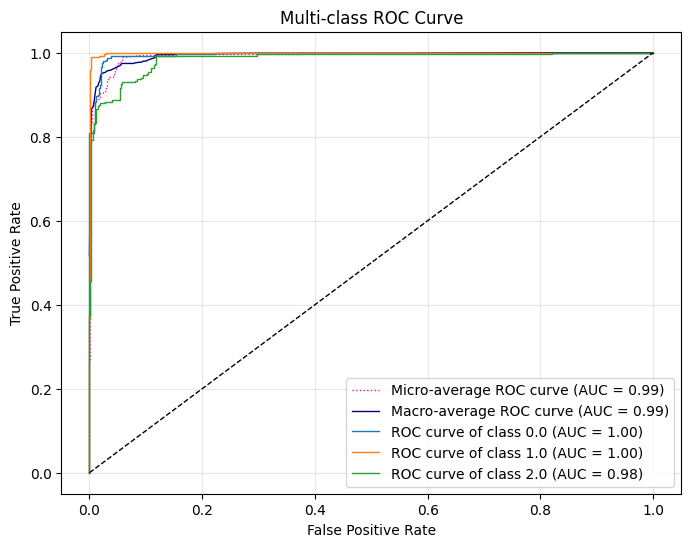

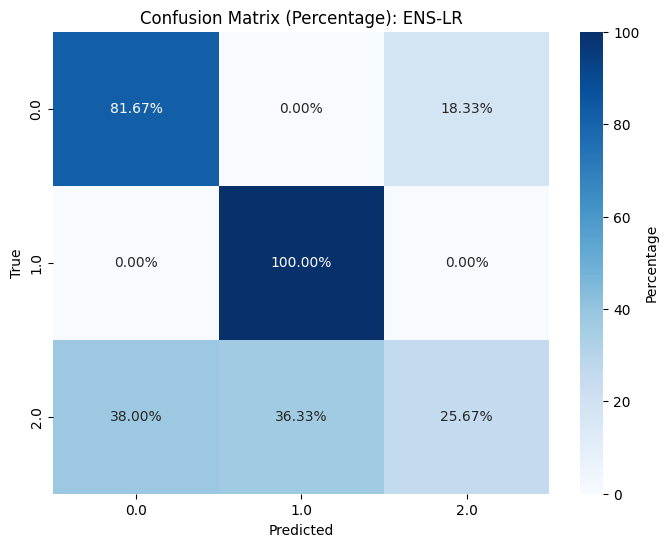

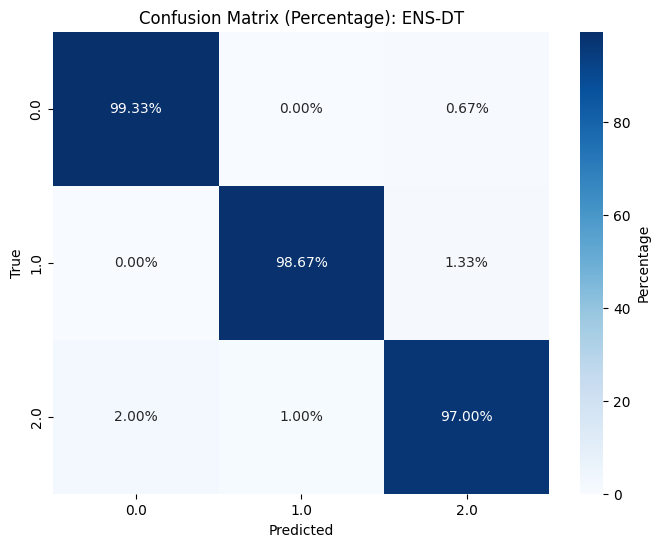

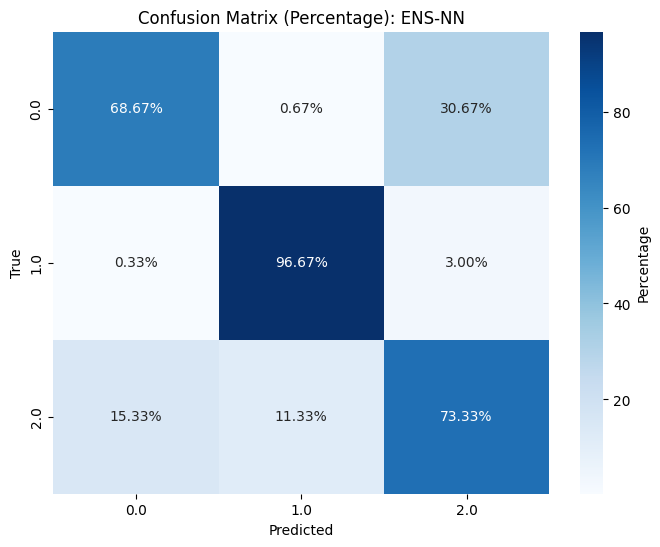

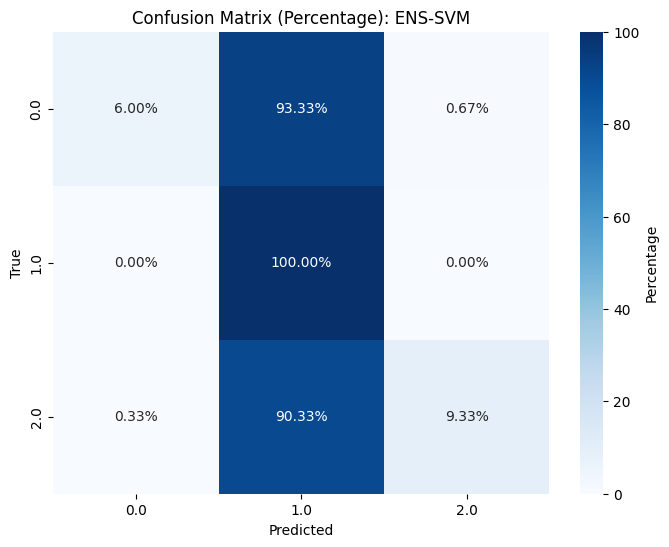

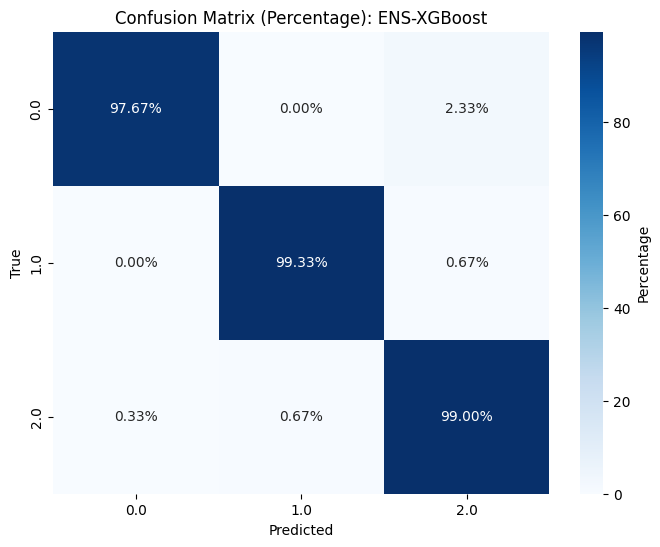

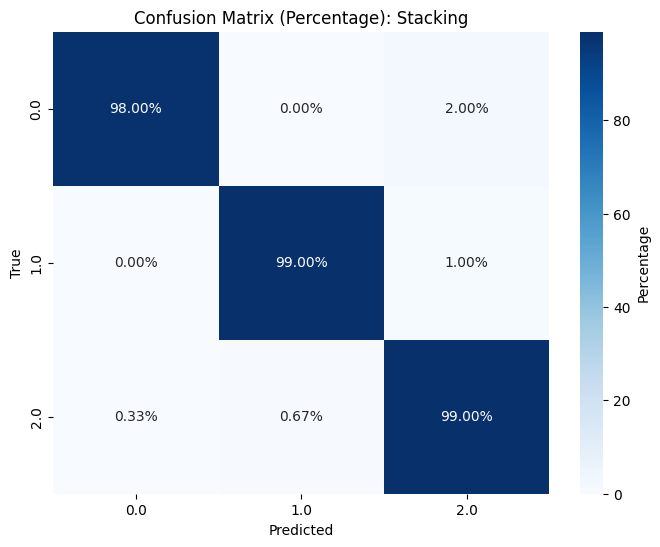

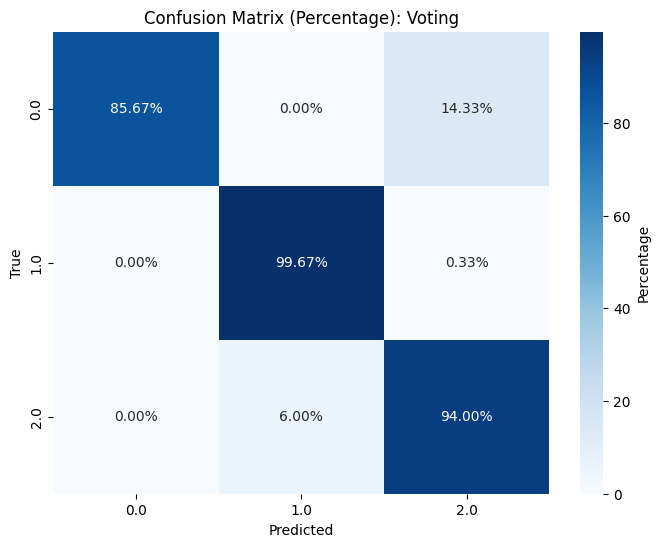

Classification Report for ENS-LR:
              precision    recall  f1-score     support
0.0            0.682451  0.816667  0.743551  300.000000
1.0            0.733496  1.000000  0.846262  300.000000
2.0            0.583333  0.256667  0.356481  300.000000
accuracy       0.691111  0.691111  0.691111    0.691111
macro avg      0.666427  0.691111  0.648765  900.000000
weighted avg   0.666427  0.691111  0.648765  900.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            0.980263  0.993333  0.986755  300.000000
1.0            0.989967  0.986667  0.988314  300.000000
2.0            0.979798  0.970000  0.974874  300.000000
accuracy       0.983333  0.983333  0.983333    0.983333
macro avg      0.983343  0.983333  0.983314  900.000000
weighted avg   0.983343  0.983333  0.983314  900.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.814229  0.686667  0.745027  300.000000
1.

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.691111,0.854493,0.691111,0.691111,0.648765
1,ENS-DT,0.983333,0.987500,0.983333,0.983333,0.983314
2,ENS-NN,0.795556,0.877203,0.795556,0.795556,0.793360
3,ENS-SVM,0.384444,0.830802,0.384444,0.384444,0.267945
4,ENS-XGBoost,0.986667,0.999257,0.986667,0.986667,0.986688
5,Stacking,0.986667,0.998265,0.986667,0.986667,0.986695
6,Voting,0.931111,0.993057,0.931111,0.931111,0.930988



Evaluating feature selection method: Tree-based
Selected features (Tree-based): Index(['attack', 'level', 'src_bytes', 'same_srv_rate', 'dst_bytes',
       'dst_host_serror_rate', 'diff_srv_rate', 'count',
       'dst_host_srv_serror_rate', 'flag'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.674444,0.829863,0.674444,0.674444,0.614995
1,ENS-DT,0.992222,0.994167,0.992222,0.992222,0.992219
2,ENS-NN,0.837778,0.877138,0.837778,0.837778,0.836773
3,ENS-SVM,0.371111,0.798074,0.371111,0.371111,0.243088
4,ENS-XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000
5,Stacking,0.997778,0.999993,0.997778,0.997778,0.997778
6,Voting,0.924444,0.993191,0.924444,0.924444,0.924196


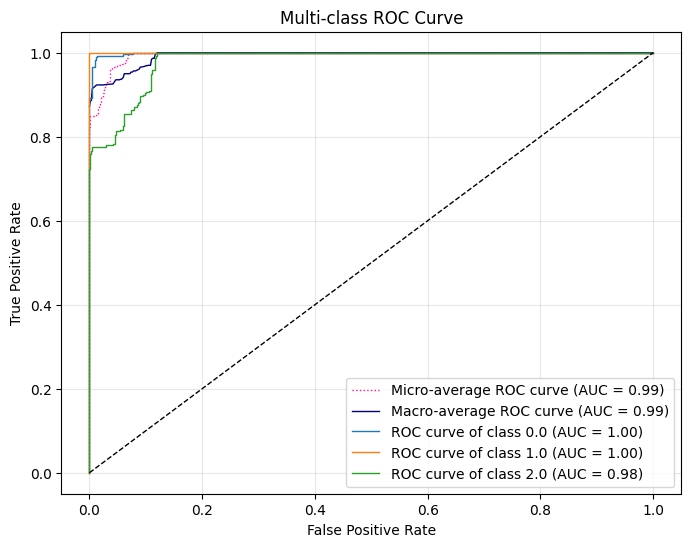

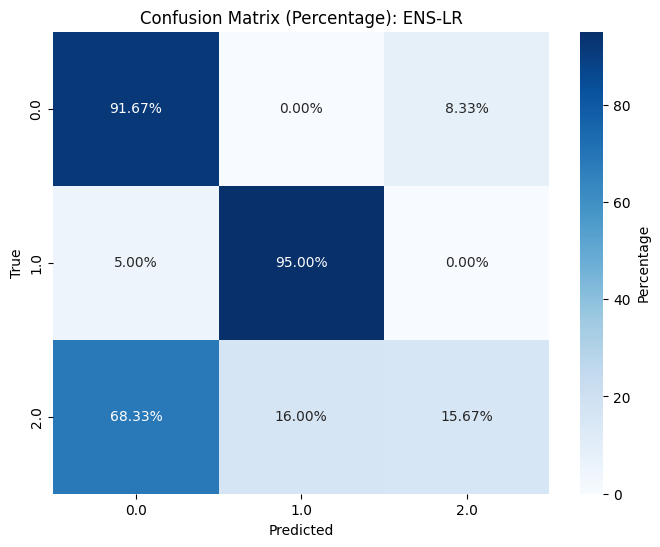

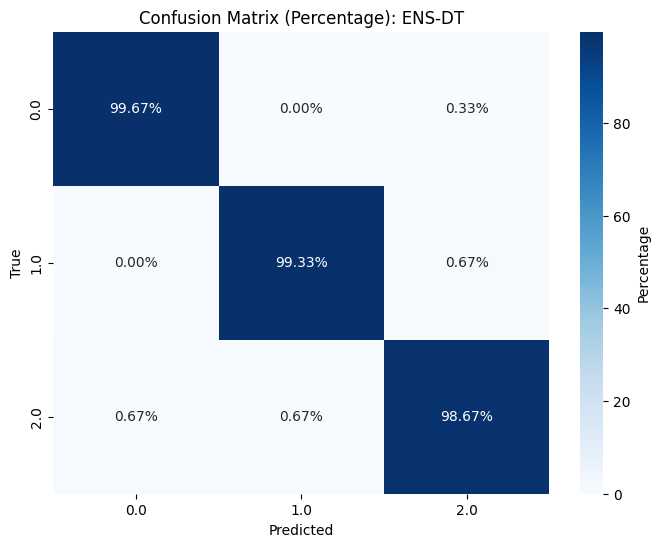

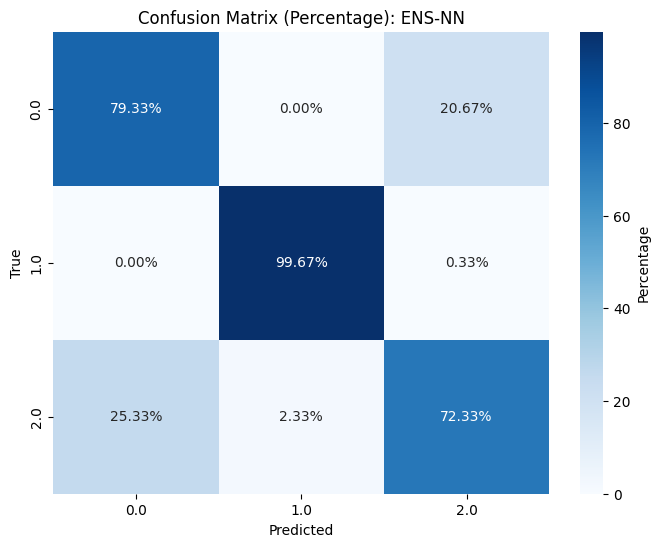

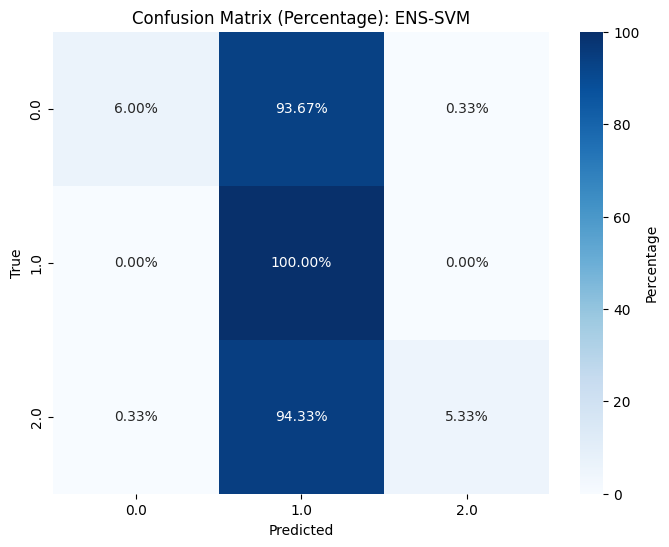

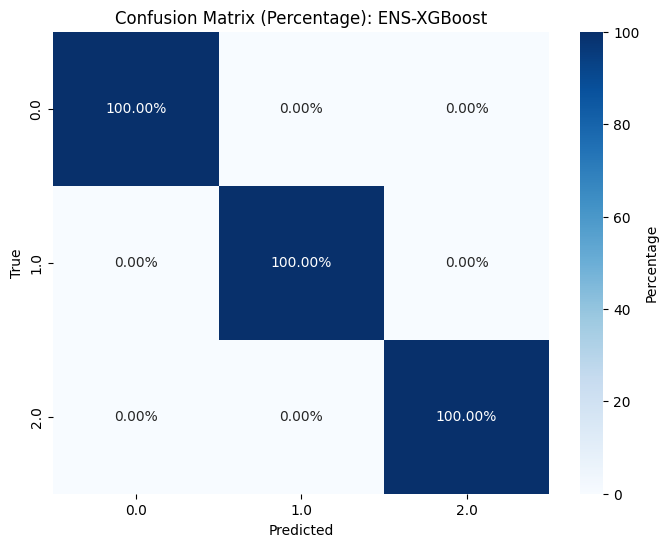

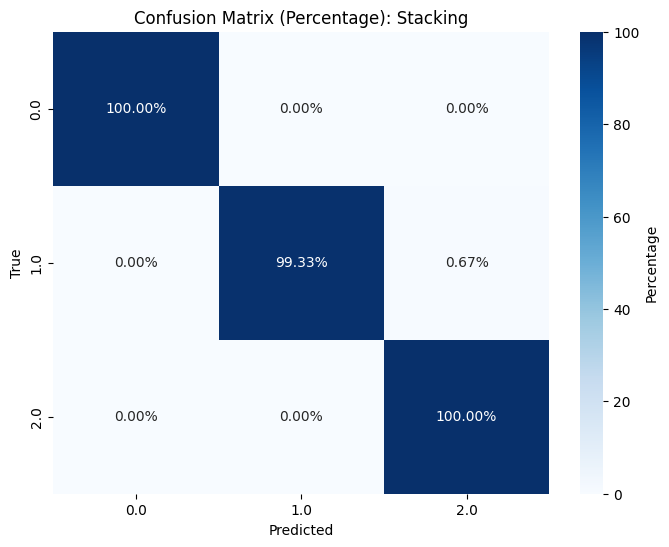

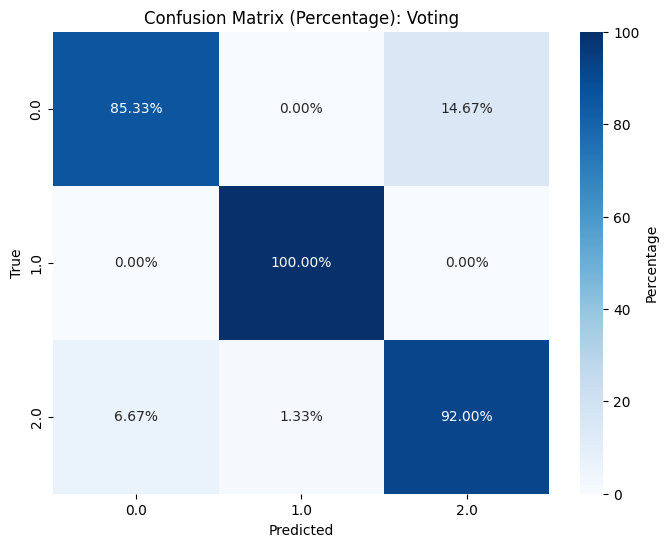

Classification Report for ENS-LR:
              precision    recall  f1-score     support
0.0            0.555556  0.916667  0.691824  300.000000
1.0            0.855856  0.950000  0.900474  300.000000
2.0            0.652778  0.156667  0.252688  300.000000
accuracy       0.674444  0.674444  0.674444    0.674444
macro avg      0.688063  0.674444  0.614995  900.000000
weighted avg   0.688063  0.674444  0.614995  900.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            0.993355  0.996667  0.995008  300.000000
1.0            0.993333  0.993333  0.993333  300.000000
2.0            0.989967  0.986667  0.988314  300.000000
accuracy       0.992222  0.992222  0.992222    0.992222
macro avg      0.992218  0.992222  0.992219  900.000000
weighted avg   0.992218  0.992222  0.992219  900.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.757962  0.793333  0.775244  300.000000
1.

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.674444,0.829863,0.674444,0.674444,0.614995
1,ENS-DT,0.992222,0.994167,0.992222,0.992222,0.992219
2,ENS-NN,0.837778,0.877138,0.837778,0.837778,0.836773
3,ENS-SVM,0.371111,0.798074,0.371111,0.371111,0.243088
4,ENS-XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000
5,Stacking,0.997778,0.999993,0.997778,0.997778,0.997778
6,Voting,0.924444,0.993191,0.924444,0.924444,0.924196



Evaluating feature selection method: RFE
Selected features (RFE): Index(['flag', 'src_bytes', 'dst_bytes', 'count', 'same_srv_rate',
       'diff_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_serror_rate',
       'attack', 'level'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.672222,0.833228,0.672222,0.672222,0.609027
1,ENS-DT,0.998889,0.999167,0.998889,0.998889,0.998889
2,ENS-NN,0.806667,0.851447,0.806667,0.806667,0.804409
3,ENS-SVM,0.371111,0.810320,0.371111,0.371111,0.243088
4,ENS-XGBoost,0.998889,1.000000,0.998889,0.998889,0.998889
5,Stacking,0.998889,1.000000,0.998889,0.998889,0.998889
6,Voting,0.961111,0.995531,0.961111,0.961111,0.961086


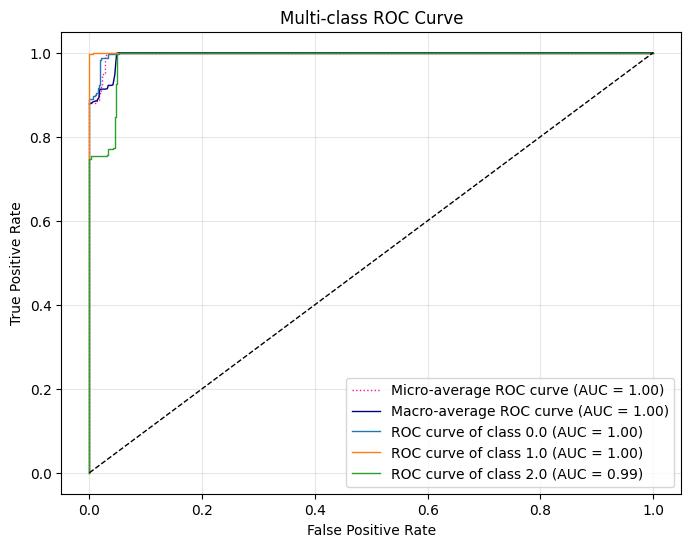

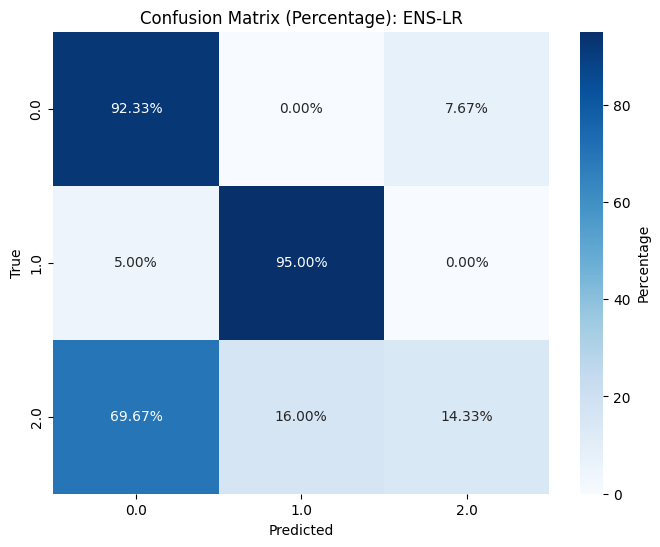

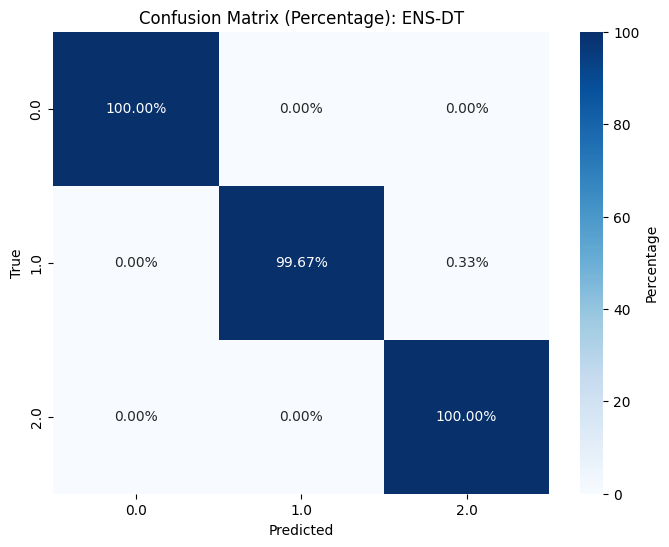

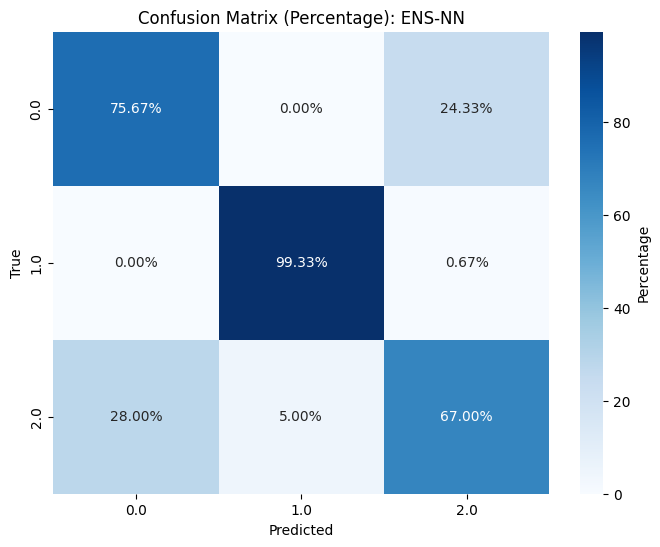

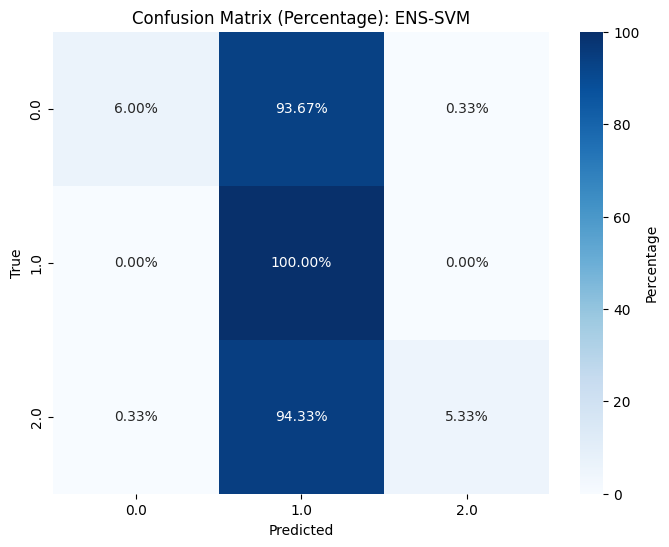

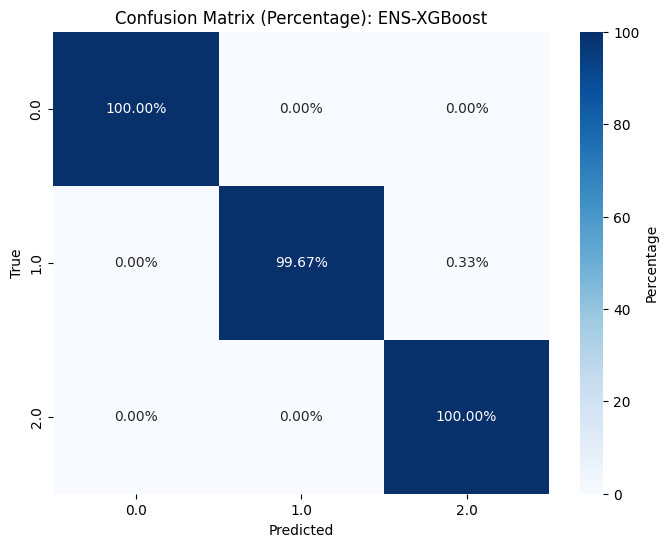

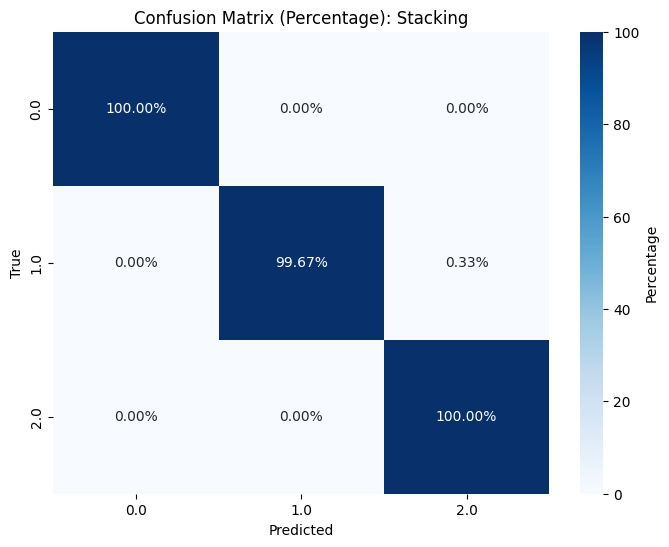

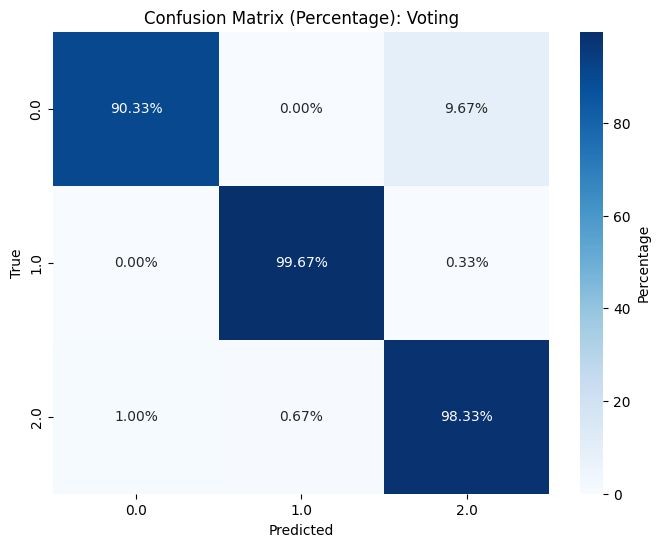

Classification Report for ENS-LR:
              precision    recall  f1-score     support
0.0            0.552894  0.923333  0.691635  300.000000
1.0            0.855856  0.950000  0.900474  300.000000
2.0            0.651515  0.143333  0.234973  300.000000
accuracy       0.672222  0.672222  0.672222    0.672222
macro avg      0.686755  0.672222  0.609027  900.000000
weighted avg   0.686755  0.672222  0.609027  900.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            1.000000  1.000000  1.000000  300.000000
1.0            1.000000  0.996667  0.998331  300.000000
2.0            0.996678  1.000000  0.998336  300.000000
accuracy       0.998889  0.998889  0.998889    0.998889
macro avg      0.998893  0.998889  0.998889  900.000000
weighted avg   0.998893  0.998889  0.998889  900.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.729904  0.756667  0.743044  300.000000
1.

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.672222,0.833228,0.672222,0.672222,0.609027
1,ENS-DT,0.998889,0.999167,0.998889,0.998889,0.998889
2,ENS-NN,0.806667,0.851447,0.806667,0.806667,0.804409
3,ENS-SVM,0.371111,0.810320,0.371111,0.371111,0.243088
4,ENS-XGBoost,0.998889,1.000000,0.998889,0.998889,0.998889
5,Stacking,0.998889,1.000000,0.998889,0.998889,0.998889
6,Voting,0.961111,0.995531,0.961111,0.961111,0.961086



Processing dataset: UNSW-NB15
Shape of UNSW-NB15: (2540047, 49)
Number of unique classes in 'label': 2

Evaluating feature selection method: Lasso
Selected features (Lasso): Index(['sport', 'dstip', 'dsport', 'sbytes', 'dbytes', 'sttl', 'dttl', 'sload',
       'dload', 'spkts', 'dpkts', 'swin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'res_bdy_len', 'sjit', 'djit', 'stime', 'ltime', 'sintpkt',
       'ct_dst_src_ltm'],
      dtype='object', name='Name')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.645e+00, tolerance: 3.500e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.861667,0.945533,0.861667,0.861667,0.861247
1,ENS-DT,0.988333,0.988333,0.988333,0.988333,0.988333
2,ENS-NN,0.881667,0.881667,0.881667,0.881667,0.881627
3,ENS-SVM,0.721667,0.832889,0.721667,0.721667,0.718361
4,ENS-XGBoost,0.993333,0.999311,0.993333,0.993333,0.993333
5,Stacking,0.993333,0.989922,0.993333,0.993333,0.993333
6,Voting,0.878333,0.983389,0.878333,0.878333,0.878086


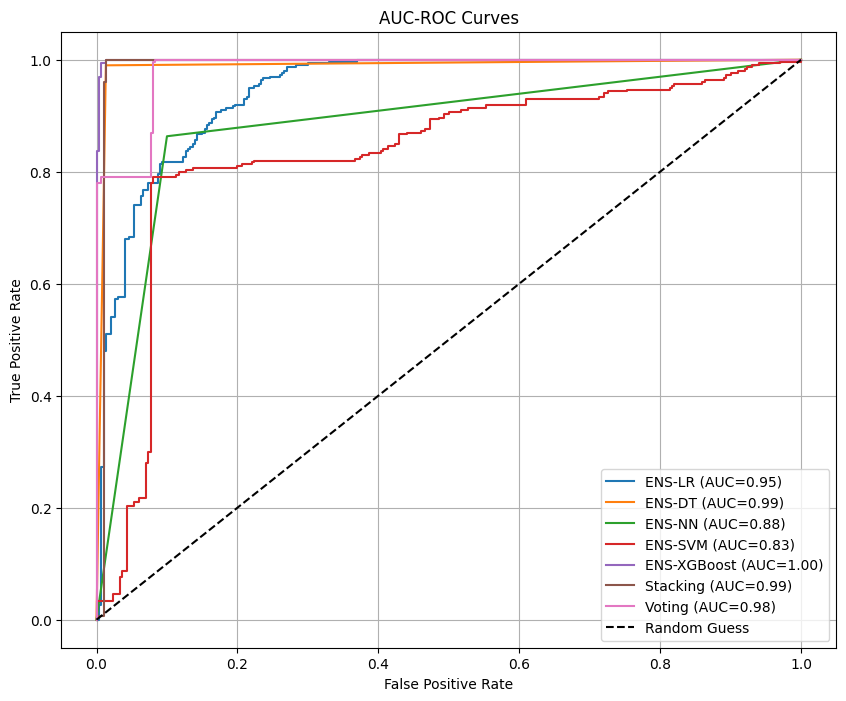

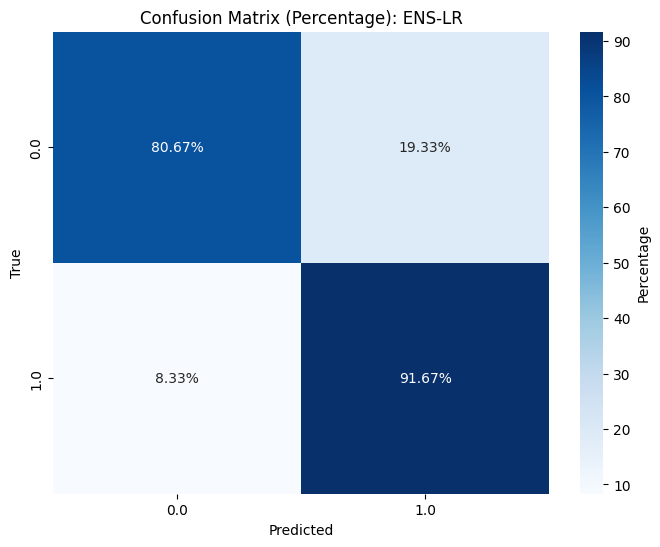

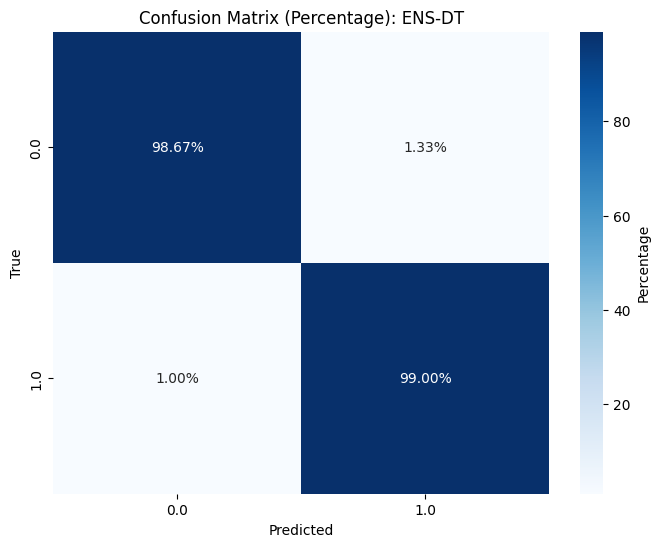

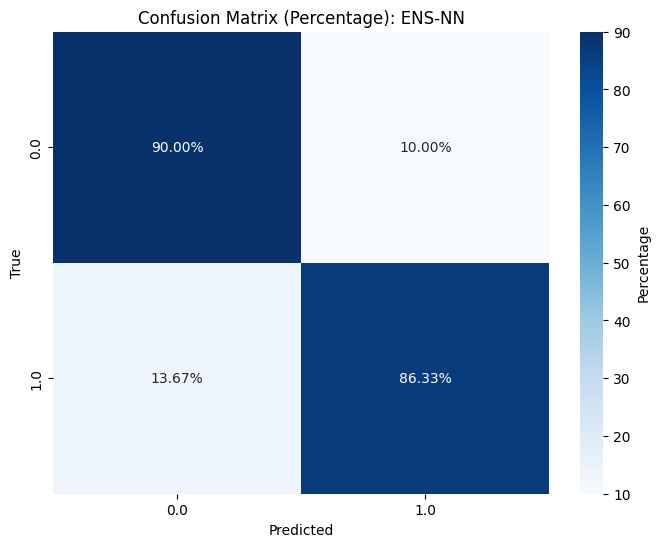

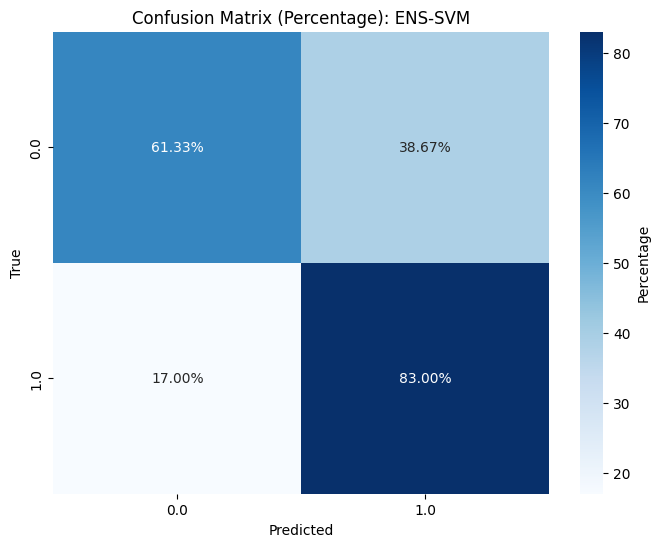

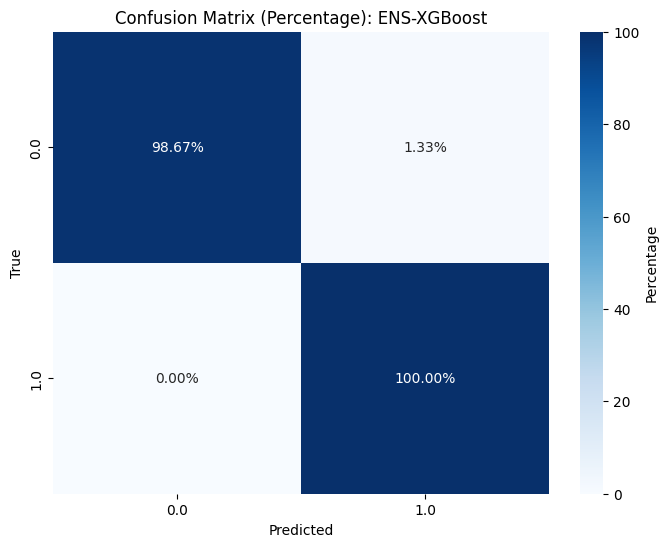

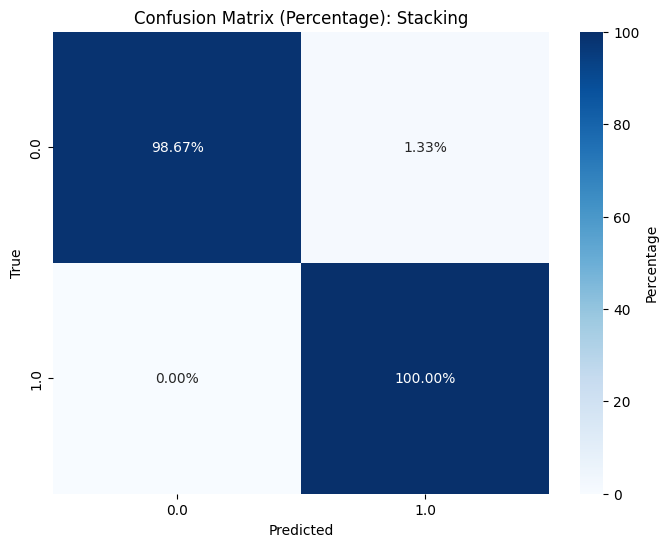

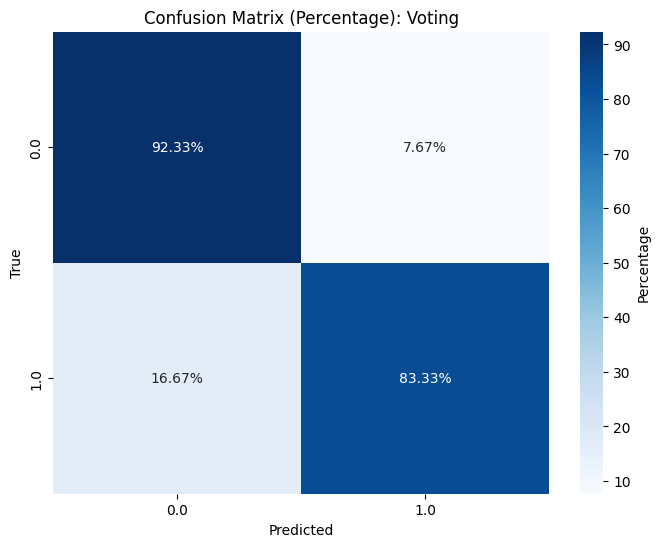

Classification Report for ENS-LR:
              precision    recall  f1-score     support
0.0            0.906367  0.806667  0.853616  300.000000
1.0            0.825826  0.916667  0.868878  300.000000
accuracy       0.861667  0.861667  0.861667    0.861667
macro avg      0.866096  0.861667  0.861247  600.000000
weighted avg   0.866096  0.861667  0.861247  600.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            0.989967  0.986667  0.988314  300.000000
1.0            0.986711  0.990000  0.988353  300.000000
accuracy       0.988333  0.988333  0.988333    0.988333
macro avg      0.988339  0.988333  0.988333  600.000000
weighted avg   0.988339  0.988333  0.988333  600.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.868167  0.900000  0.883797  300.000000
1.0            0.896194  0.863333  0.879457  300.000000
accuracy       0.881667  0.881667  0.881667    0.881667
ma

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.861667,0.945533,0.861667,0.861667,0.861247
1,ENS-DT,0.988333,0.988333,0.988333,0.988333,0.988333
2,ENS-NN,0.881667,0.881667,0.881667,0.881667,0.881627
3,ENS-SVM,0.721667,0.832889,0.721667,0.721667,0.718361
4,ENS-XGBoost,0.993333,0.999311,0.993333,0.993333,0.993333
5,Stacking,0.993333,0.989922,0.993333,0.993333,0.993333
6,Voting,0.878333,0.983389,0.878333,0.878333,0.878086



Evaluating feature selection method: Tree-based
Selected features (Tree-based): Index(['sttl', 'dstip', 'ct_state_ttl', 'srcip', 'dttl', 'dload', 'dbytes',
       'dintpkt', 'dpkts', 'dmeansz'],
      dtype='object', name='Name')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.990000,0.989433,0.990000,0.990000,0.989999
1,ENS-DT,0.986667,0.985889,0.986667,0.986667,0.986667
2,ENS-NN,0.950000,0.965956,0.950000,0.950000,0.950000
3,ENS-SVM,0.833333,0.972800,0.833333,0.833333,0.828955
4,ENS-XGBoost,0.988333,0.998944,0.988333,0.988333,0.988333
5,Stacking,0.993333,0.992833,0.993333,0.993333,0.993333
6,Voting,0.976667,0.997444,0.976667,0.976667,0.976663


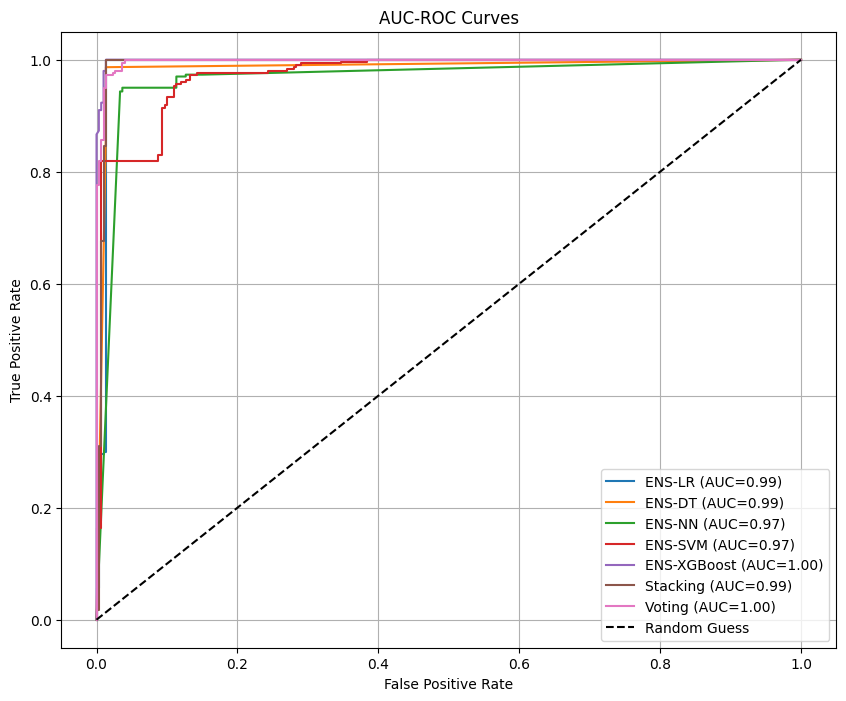

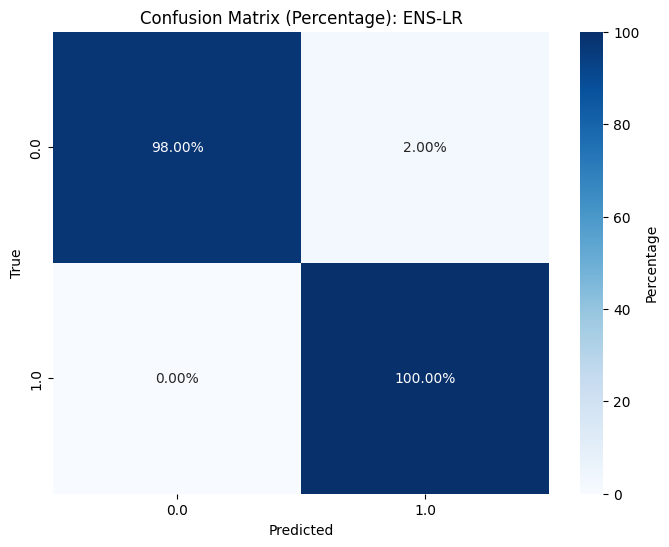

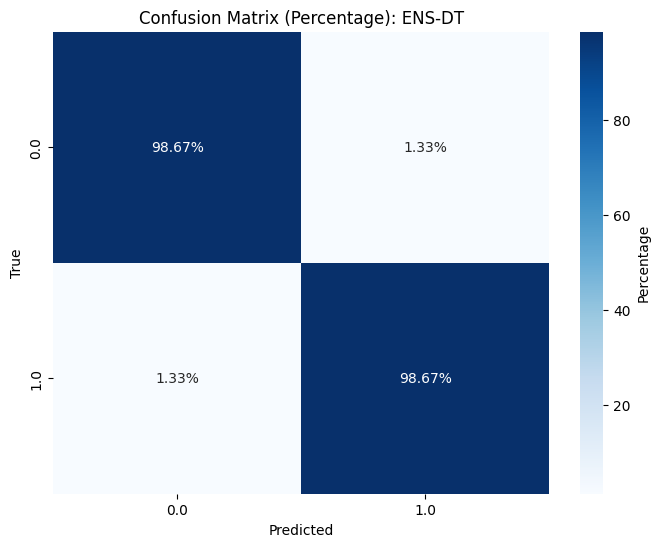

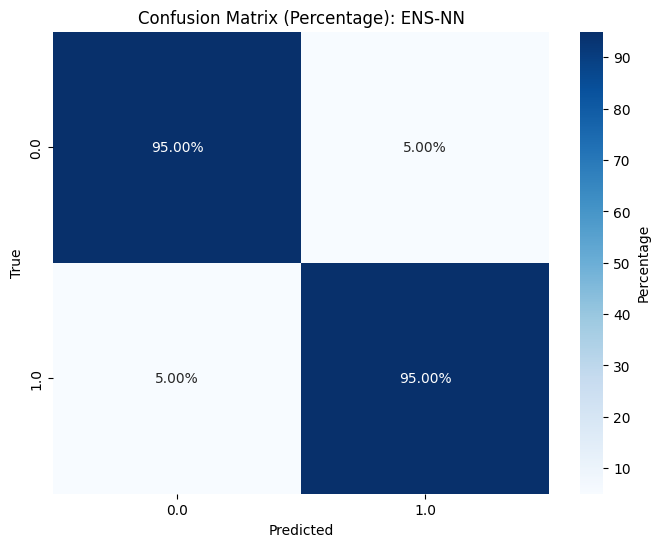

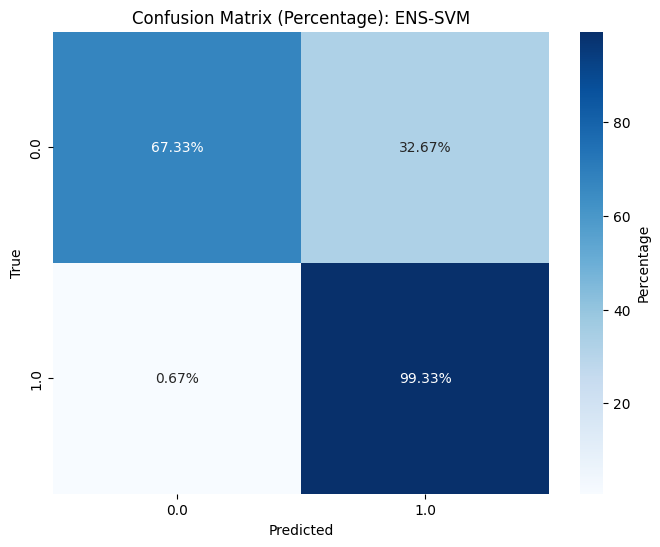

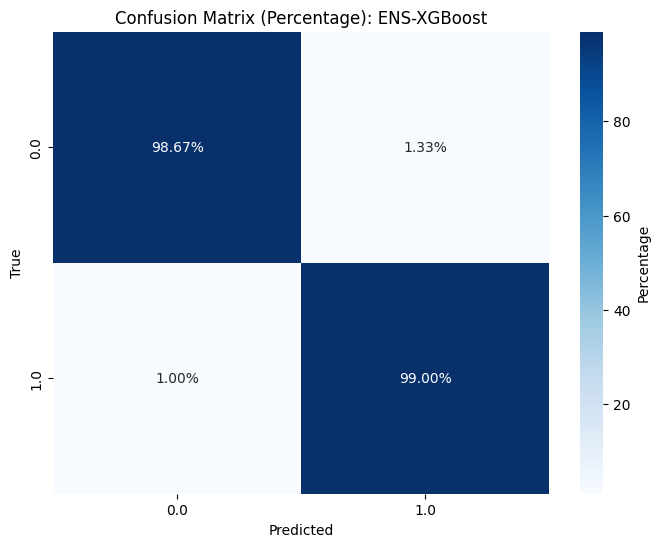

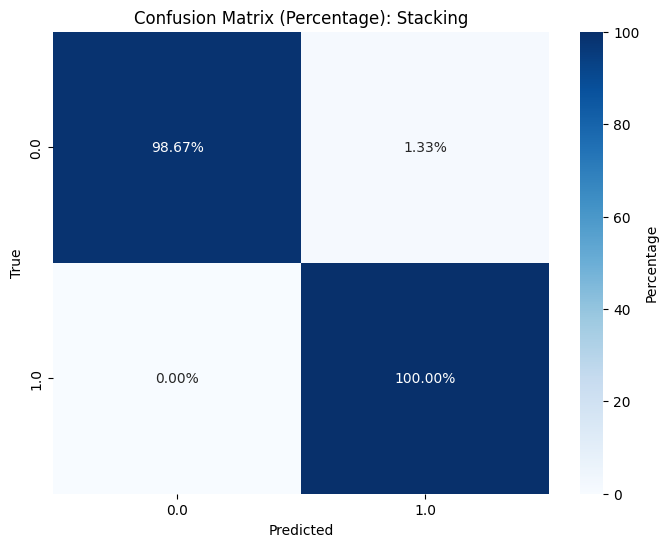

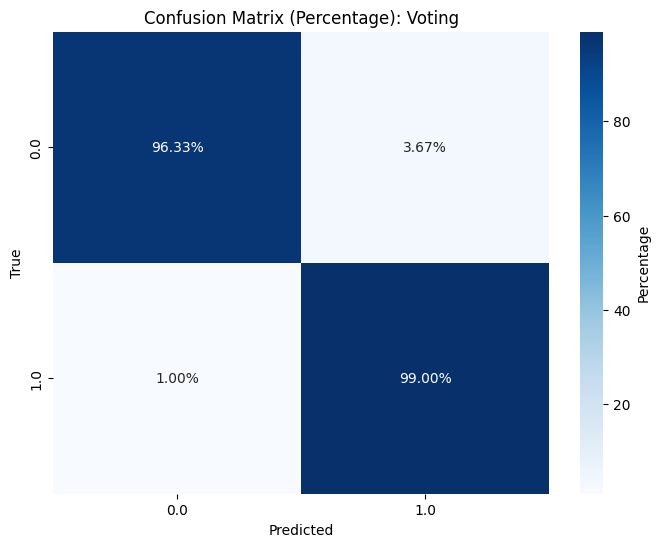

Classification Report for ENS-LR:
              precision  recall  f1-score  support
0.0            1.000000    0.98  0.989899   300.00
1.0            0.980392    1.00  0.990099   300.00
accuracy       0.990000    0.99  0.990000     0.99
macro avg      0.990196    0.99  0.989999   600.00
weighted avg   0.990196    0.99  0.989999   600.00
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            0.986667  0.986667  0.986667  300.000000
1.0            0.986667  0.986667  0.986667  300.000000
accuracy       0.986667  0.986667  0.986667    0.986667
macro avg      0.986667  0.986667  0.986667  600.000000
weighted avg   0.986667  0.986667  0.986667  600.000000
Classification Report for ENS-NN:
              precision  recall  f1-score  support
0.0                0.95    0.95      0.95   300.00
1.0                0.95    0.95      0.95   300.00
accuracy           0.95    0.95      0.95     0.95
macro avg          0.95    0.95      0.95   600.00
w

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.990000,0.989433,0.990000,0.990000,0.989999
1,ENS-DT,0.986667,0.985889,0.986667,0.986667,0.986667
2,ENS-NN,0.950000,0.965956,0.950000,0.950000,0.950000
3,ENS-SVM,0.833333,0.972800,0.833333,0.833333,0.828955
4,ENS-XGBoost,0.988333,0.998944,0.988333,0.988333,0.988333
5,Stacking,0.993333,0.992833,0.993333,0.993333,0.993333
6,Voting,0.976667,0.997444,0.976667,0.976667,0.976663



Evaluating feature selection method: RFE
Selected features (RFE): Index(['srcip', 'dstip', 'sttl', 'dttl', 'dload', 'smeansz', 'dmeansz',
       'dintpkt', 'ct_state_ttl', 'attack_cat'],
      dtype='object', name='Name')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.988333,0.990200,0.988333,0.988333,0.988333
1,ENS-DT,0.996667,0.996667,0.996667,0.996667,0.996667
2,ENS-NN,0.906667,0.933367,0.906667,0.906667,0.906250
3,ENS-SVM,0.833333,0.973900,0.833333,0.833333,0.828955
4,ENS-XGBoost,0.996667,1.000000,0.996667,0.996667,0.996667
5,Stacking,0.993333,1.000000,0.993333,0.993333,0.993333
6,Voting,0.980000,0.998022,0.980000,0.980000,0.979998


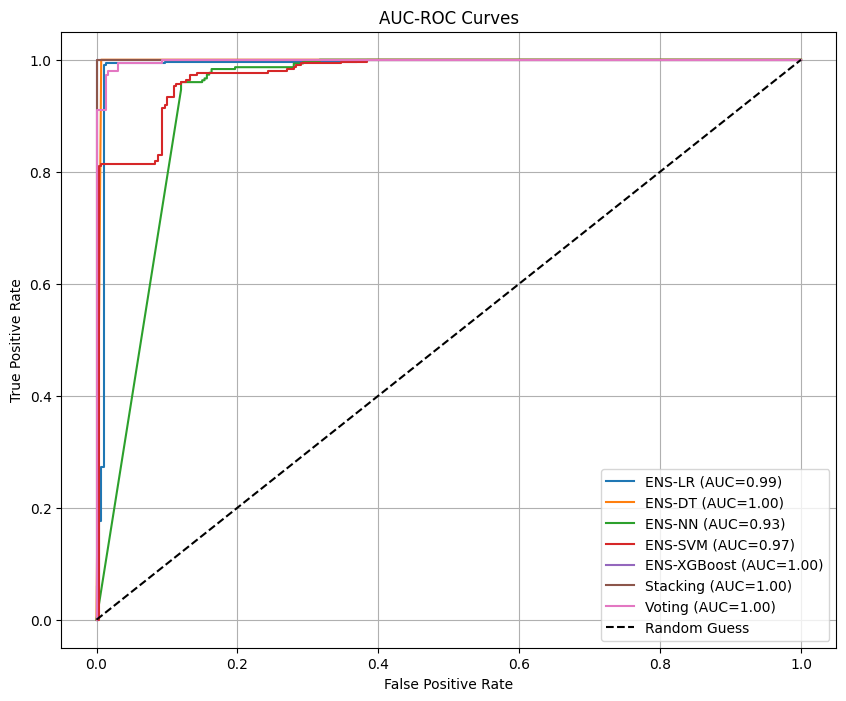

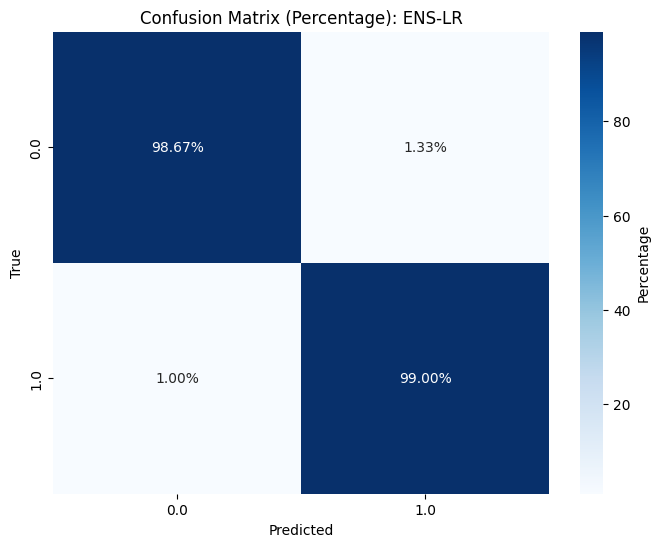

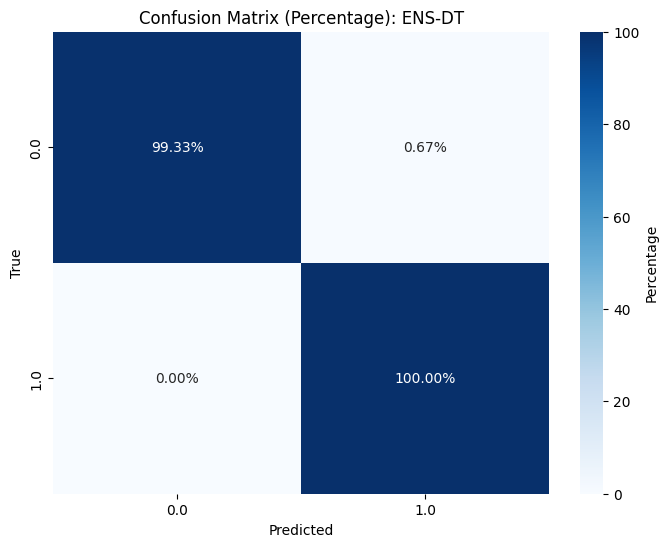

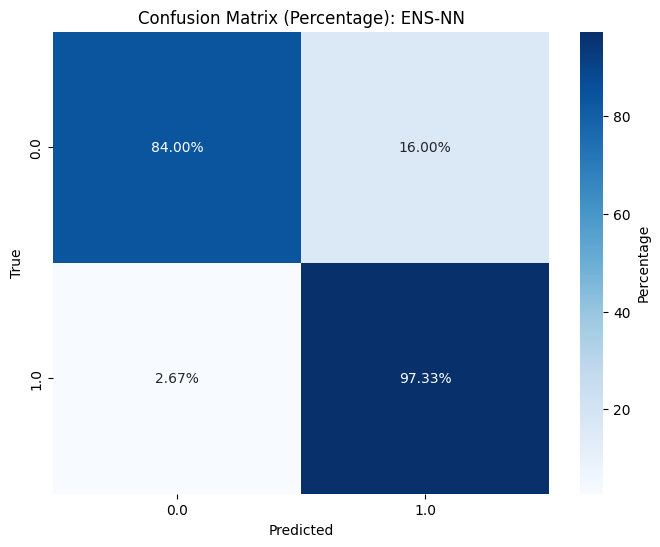

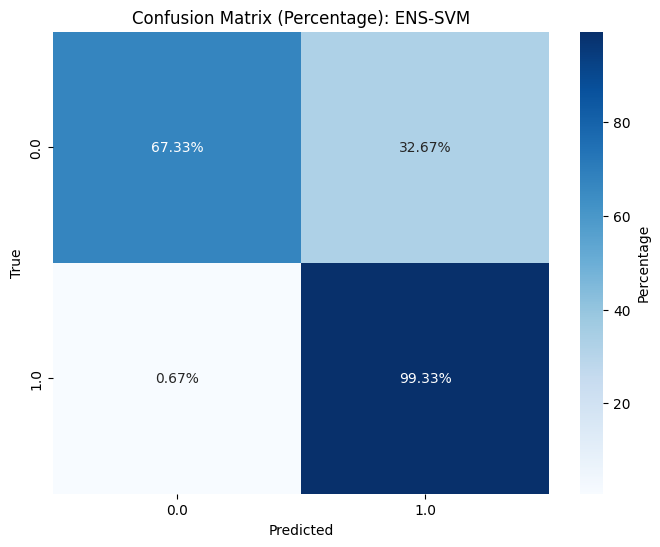

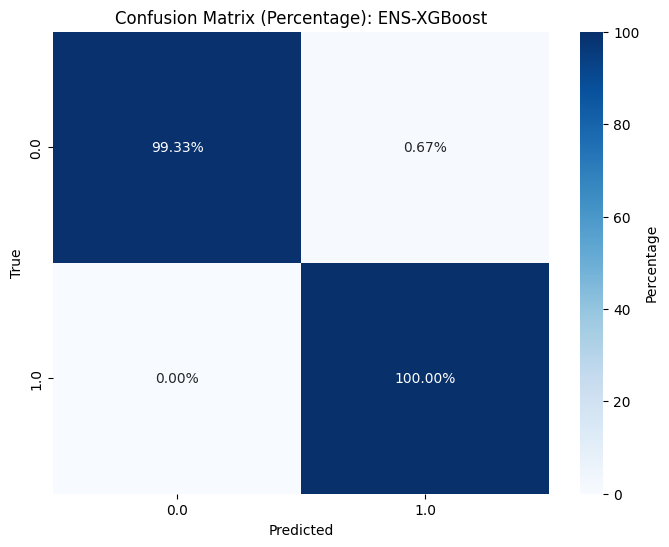

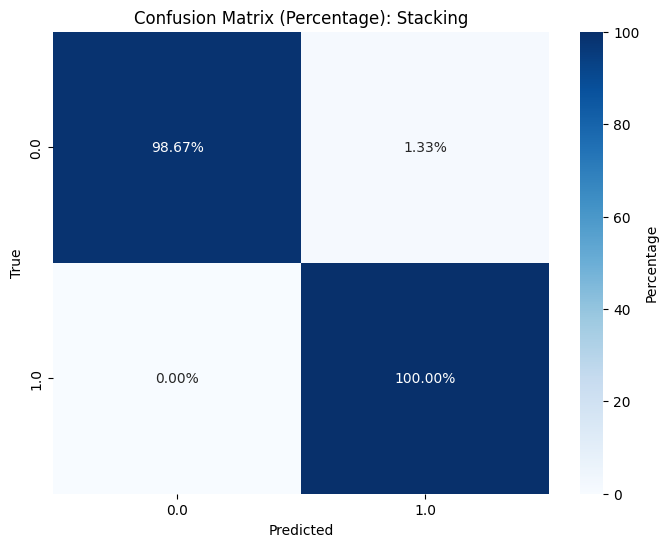

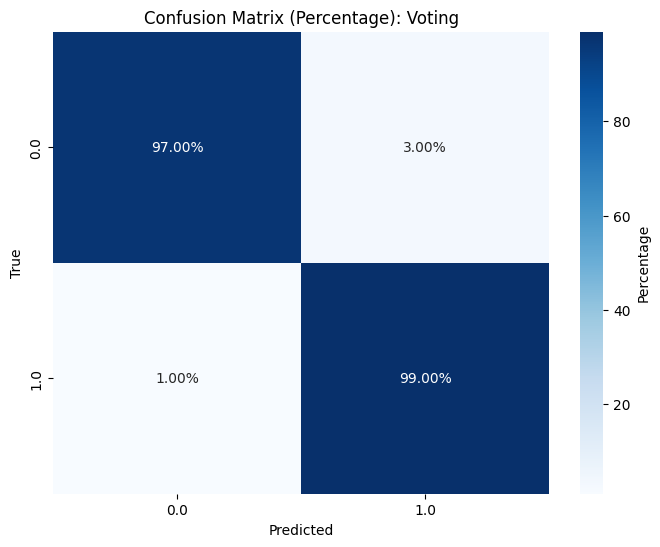

Classification Report for ENS-LR:
              precision    recall  f1-score     support
0.0            0.989967  0.986667  0.988314  300.000000
1.0            0.986711  0.990000  0.988353  300.000000
accuracy       0.988333  0.988333  0.988333    0.988333
macro avg      0.988339  0.988333  0.988333  600.000000
weighted avg   0.988339  0.988333  0.988333  600.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0.0            1.000000  0.993333  0.996656  300.000000
1.0            0.993377  1.000000  0.996678  300.000000
accuracy       0.996667  0.996667  0.996667    0.996667
macro avg      0.996689  0.996667  0.996667  600.000000
weighted avg   0.996689  0.996667  0.996667  600.000000
Classification Report for ENS-NN:
              precision    recall  f1-score     support
0.0            0.969231  0.840000  0.900000  300.000000
1.0            0.858824  0.973333  0.912500  300.000000
accuracy       0.906667  0.906667  0.906667    0.906667
ma

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.988333,0.990200,0.988333,0.988333,0.988333
1,ENS-DT,0.996667,0.996667,0.996667,0.996667,0.996667
2,ENS-NN,0.906667,0.933367,0.906667,0.906667,0.906250
3,ENS-SVM,0.833333,0.973900,0.833333,0.833333,0.828955
4,ENS-XGBoost,0.996667,1.000000,0.996667,0.996667,0.996667
5,Stacking,0.993333,1.000000,0.993333,0.993333,0.993333
6,Voting,0.980000,0.998022,0.980000,0.980000,0.979998



Processing dataset: CICIDS2017
Shape of CICIDS2017: (692703, 79)
Number of unique classes in ' Label': 6

Evaluating feature selection method: Lasso


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.040e+03, tolerance: 1.389e+00
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Selected features (Lasso): Index([' Destination Port', ' Flow Duration', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Std',
       'Bwd Packet Length Max', ' Bwd Packet Length Min',
       ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s',
       ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max',
       ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std',
       ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean',
       ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
       ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean',
       ' Packet Length Std', ' Packet Length Variance', ' Average Packet Size',
       ' Avg Fwd Segment Size', ' Avg Bwd Segment Size',
       ' Fwd Header Length.1', ' Subflow Bwd Bytes', 'Init_Wi

<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.812675,0.958883,0.812675,0.730070,0.739532
1,ENS-DT,0.992777,0.995087,0.992777,0.991915,0.950799
2,ENS-NN,0.907735,0.935607,0.907735,0.878130,0.842641
3,ENS-SVM,0.817801,0.950547,0.817801,0.556687,0.577383
4,ENS-XGBoost,0.995573,0.999686,0.995573,0.996753,0.996305
5,Stacking,0.995107,0.999195,0.995107,0.995642,0.995421
6,Voting,0.954334,0.999013,0.954334,0.922996,0.938511


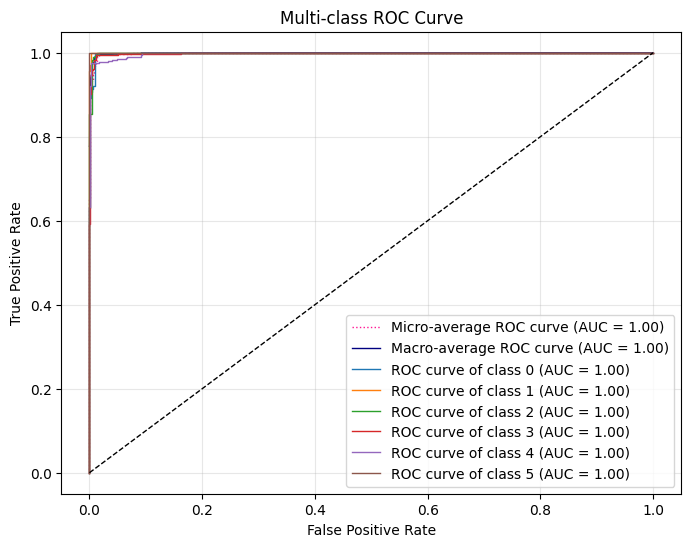

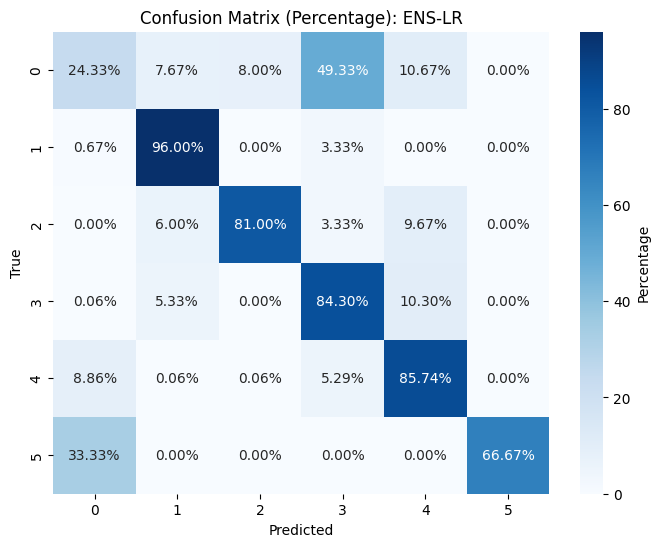

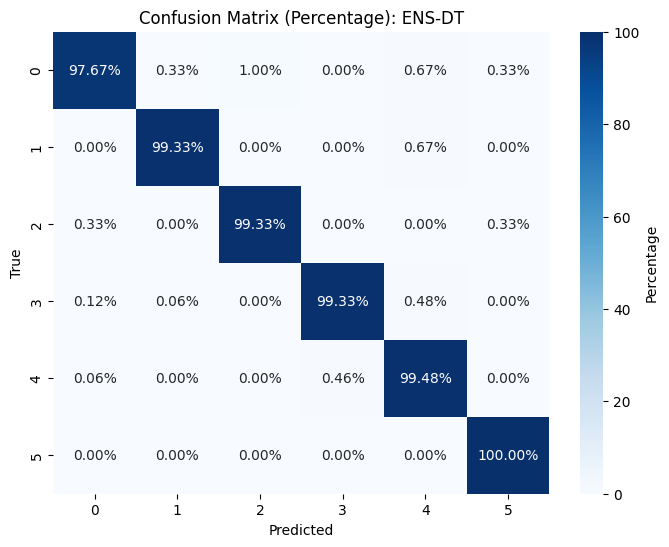

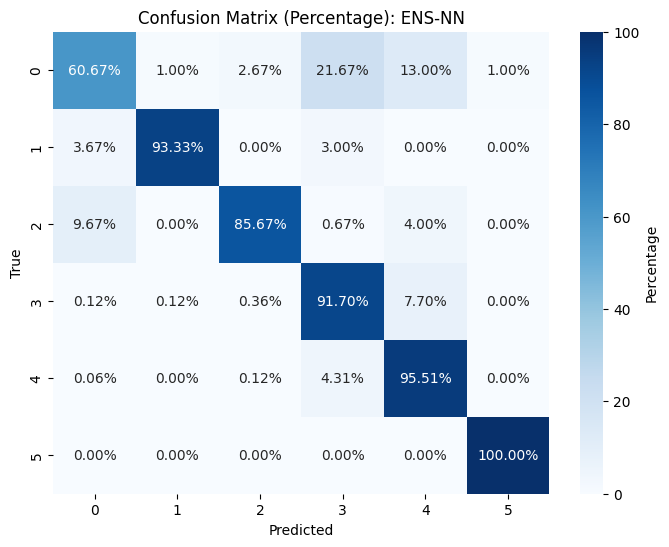

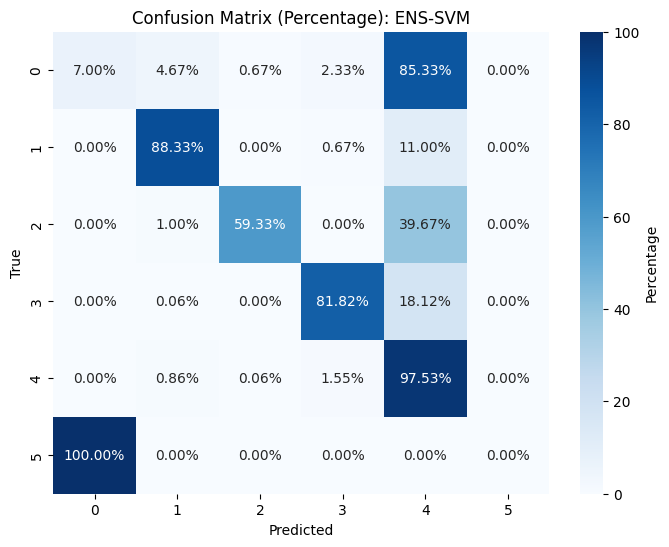

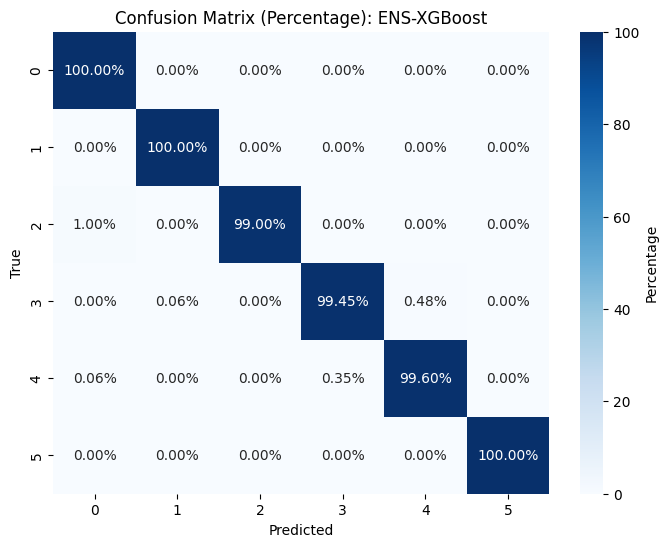

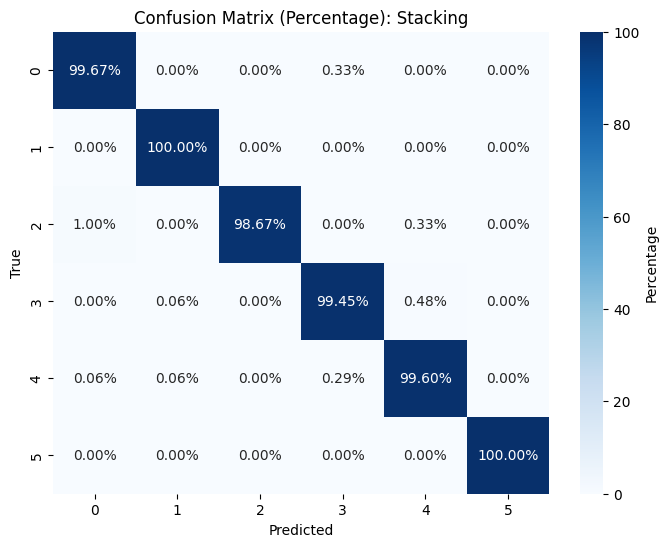

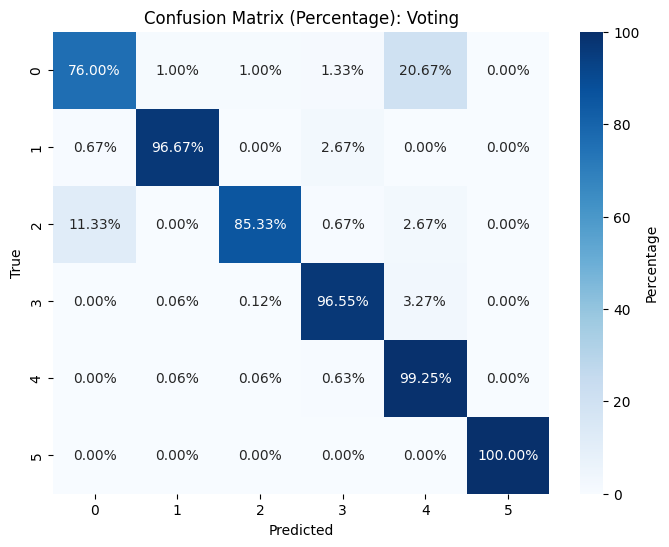

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.316017  0.243333  0.274953   300.000000
1              0.688995  0.960000  0.802228   300.000000
2              0.906716  0.810000  0.855634   300.000000
3              0.842520  0.843030  0.842775  1650.000000
4              0.865854  0.857389  0.861601  1739.000000
5              1.000000  0.666667  0.800000     3.000000
accuracy       0.812675  0.812675  0.812675     0.812675
macro avg      0.770017  0.730070  0.739532  4292.000000
weighted avg   0.809039  0.812675  0.808748  4292.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.986532  0.976667  0.981575   300.000000
1              0.993333  0.993333  0.993333   300.000000
2              0.990033  0.993333  0.991681   300.000000
3              0.995143  0.993333  0.994237  1650.000000
4              0.993111  0.994825  0.993967  1739.000000
5              0.600

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.812675,0.958883,0.812675,0.730070,0.739532
1,ENS-DT,0.992777,0.995087,0.992777,0.991915,0.950799
2,ENS-NN,0.907735,0.935607,0.907735,0.878130,0.842641
3,ENS-SVM,0.817801,0.950547,0.817801,0.556687,0.577383
4,ENS-XGBoost,0.995573,0.999686,0.995573,0.996753,0.996305
5,Stacking,0.995107,0.999195,0.995107,0.995642,0.995421
6,Voting,0.954334,0.999013,0.954334,0.922996,0.938511



Evaluating feature selection method: Tree-based
Selected features (Tree-based): Index([' Flow IAT Mean', ' Active Min', ' Flow Packets/s',
       ' Packet Length Std', ' Packet Length Mean', ' Average Packet Size',
       ' Max Packet Length', ' Fwd IAT Mean', 'Active Mean', ' Flow IAT Std'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.590168,0.889788,0.590168,0.397038,0.353990
1,ENS-DT,0.985322,0.987937,0.985322,0.976891,0.977640
2,ENS-NN,0.761184,0.872411,0.761184,0.649395,0.588392
3,ENS-SVM,0.736021,0.911463,0.736021,0.414559,0.431236
4,ENS-XGBoost,0.988816,0.999142,0.988816,0.983380,0.983086
5,Stacking,0.989515,0.997576,0.989515,0.984587,0.983252
6,Voting,0.934762,0.994868,0.934762,0.725968,0.743606


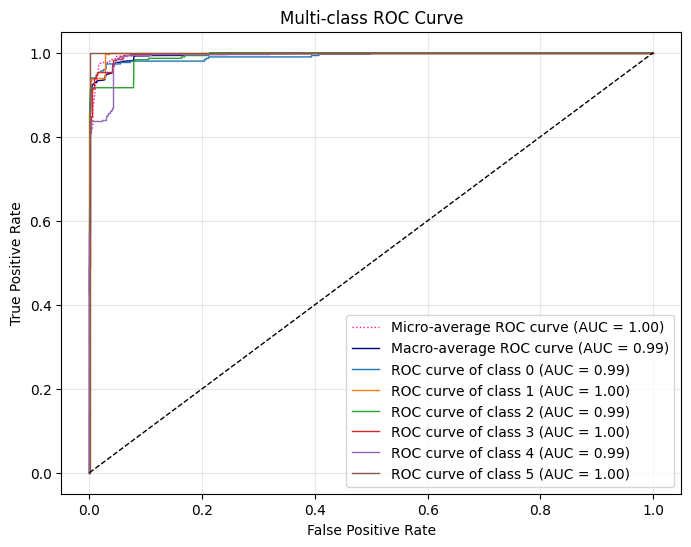

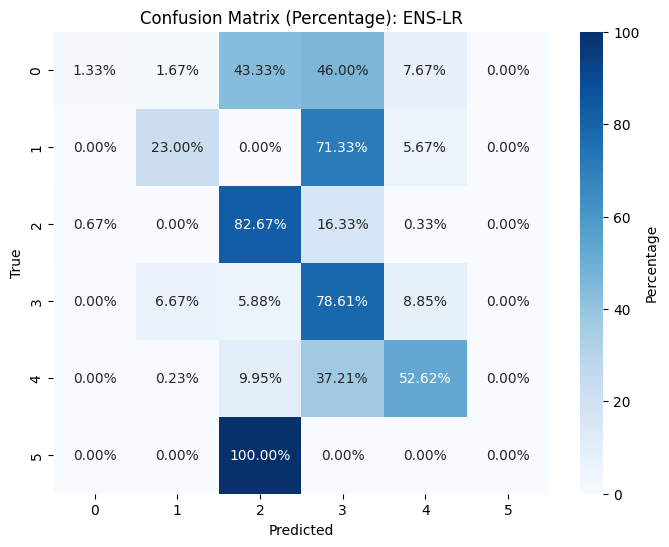

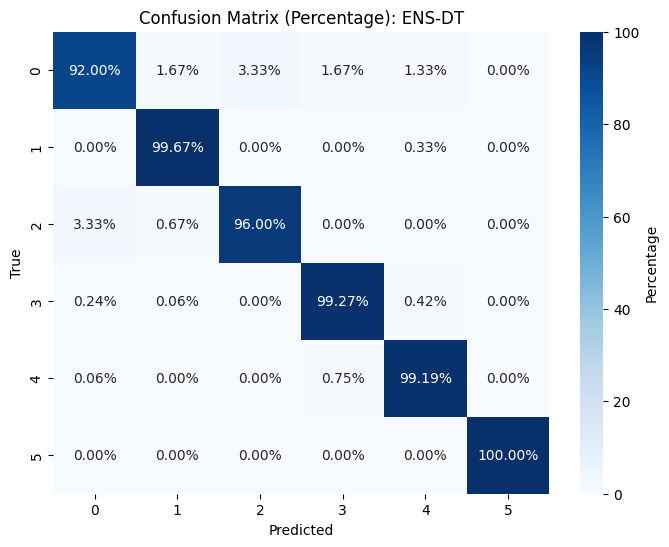

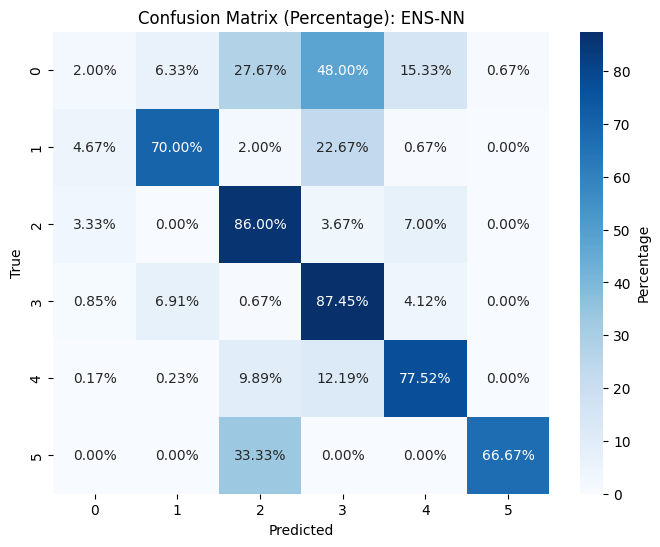

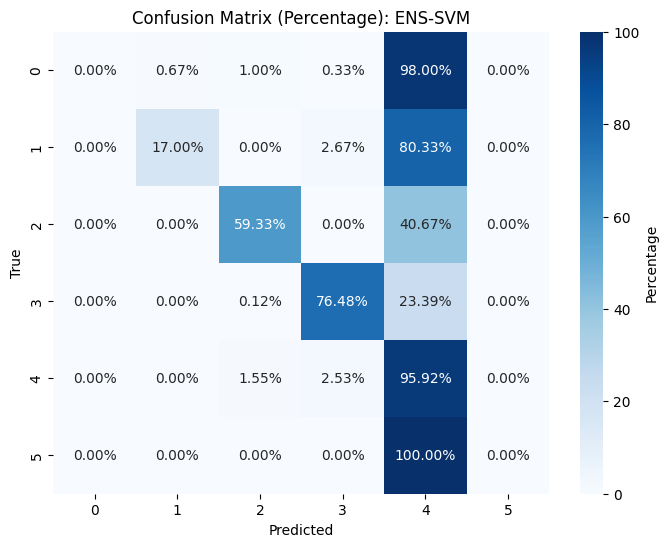

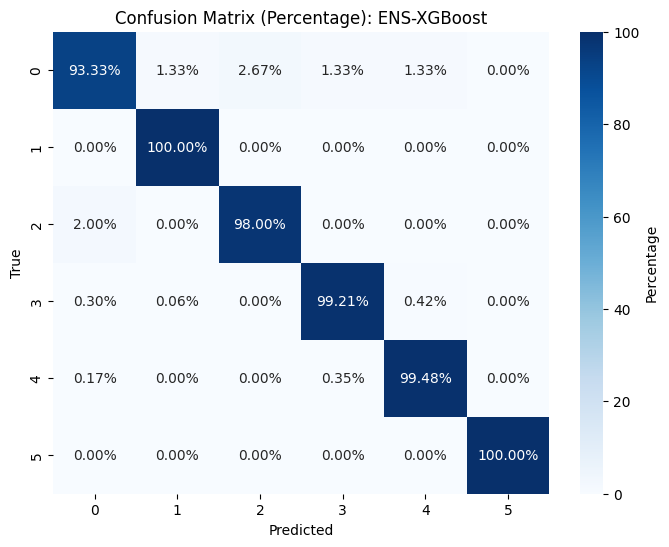

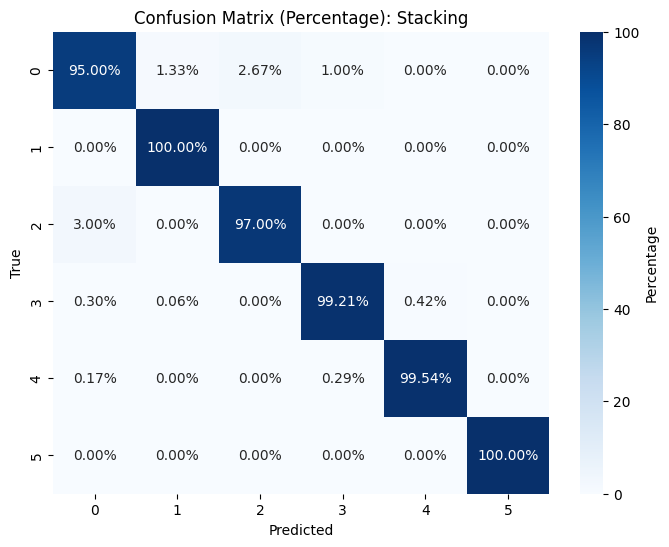

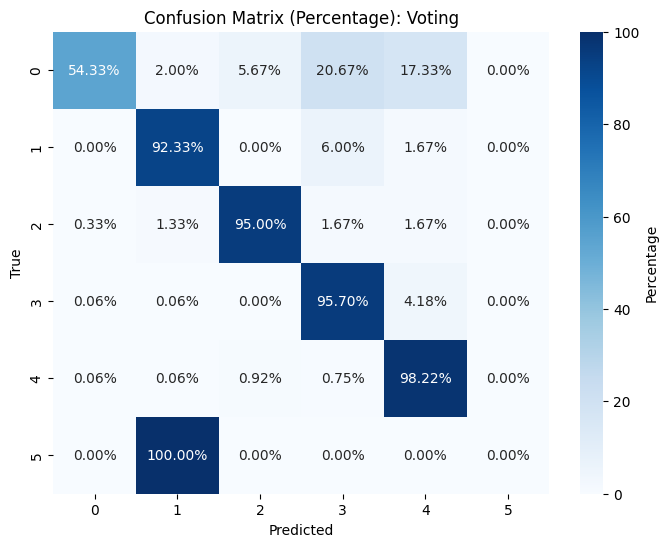

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.666667  0.013333  0.026144   300.000000
1              0.367021  0.230000  0.282787   300.000000
2              0.380952  0.826667  0.521556   300.000000
3              0.553092  0.786061  0.649312  1650.000000
4              0.830309  0.526164  0.644139  1739.000000
5              0.000000  0.000000  0.000000     3.000000
accuracy       0.590168  0.590168  0.590168     0.590168
macro avg      0.466340  0.397038  0.353990  4292.000000
weighted avg   0.647926  0.590168  0.568655  4292.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.948454  0.920000  0.934010   300.000000
1              0.973941  0.996667  0.985173   300.000000
2              0.966443  0.960000  0.963211   300.000000
3              0.989130  0.992727  0.990926  1650.000000
4              0.993092  0.991949  0.992520  1739.000000
5              1.000

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.590168,0.889788,0.590168,0.397038,0.353990
1,ENS-DT,0.985322,0.987937,0.985322,0.976891,0.977640
2,ENS-NN,0.761184,0.872411,0.761184,0.649395,0.588392
3,ENS-SVM,0.736021,0.911463,0.736021,0.414559,0.431236
4,ENS-XGBoost,0.988816,0.999142,0.988816,0.983380,0.983086
5,Stacking,0.989515,0.997576,0.989515,0.984587,0.983252
6,Voting,0.934762,0.994868,0.934762,0.725968,0.743606



Evaluating feature selection method: RFE
Selected features (RFE): Index([' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Fwd IAT Mean',
       ' Bwd Header Length', ' Max Packet Length', ' Packet Length Mean',
       ' Average Packet Size', 'Init_Win_bytes_forward', ' Active Min'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.560578,0.869385,0.560578,0.378563,0.336105
1,ENS-DT,0.988350,0.991146,0.988350,0.985027,0.985113
2,ENS-NN,0.700373,0.827458,0.700373,0.633792,0.662015
3,ENS-SVM,0.737418,0.905621,0.737418,0.416053,0.438080
4,ENS-XGBoost,0.991612,0.999631,0.991612,0.988683,0.989117
5,Stacking,0.991845,0.998314,0.991845,0.935142,0.956020
6,Voting,0.915424,0.994203,0.915424,0.853364,0.879893


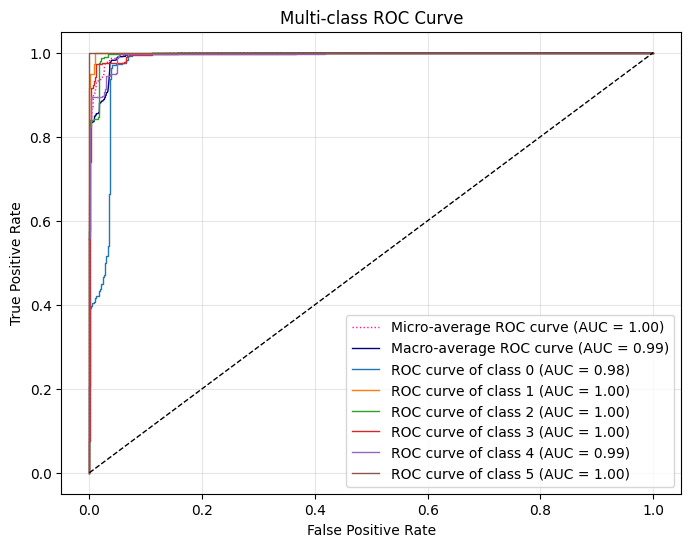

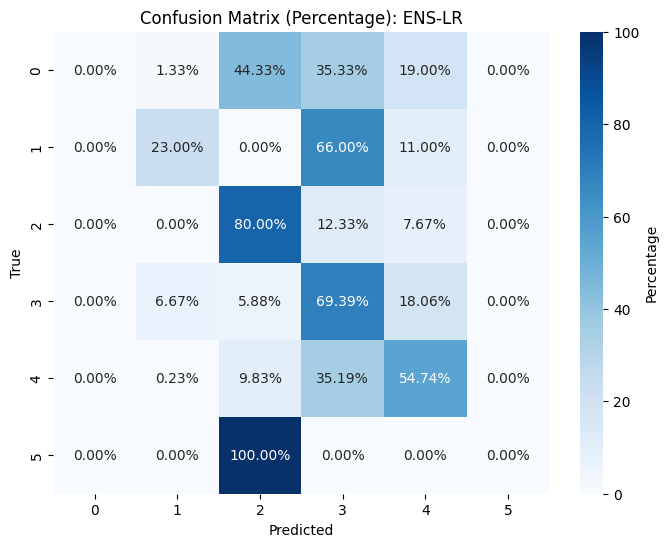

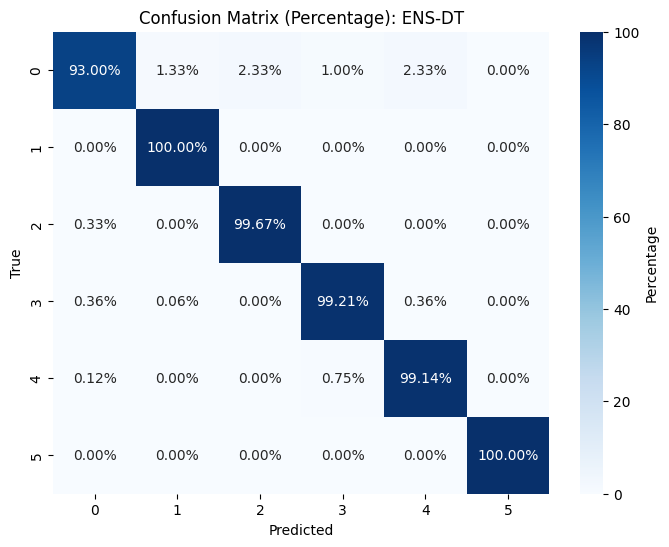

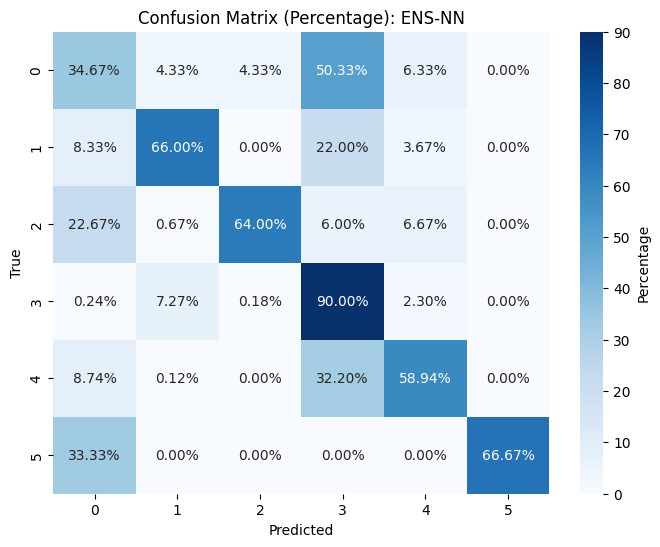

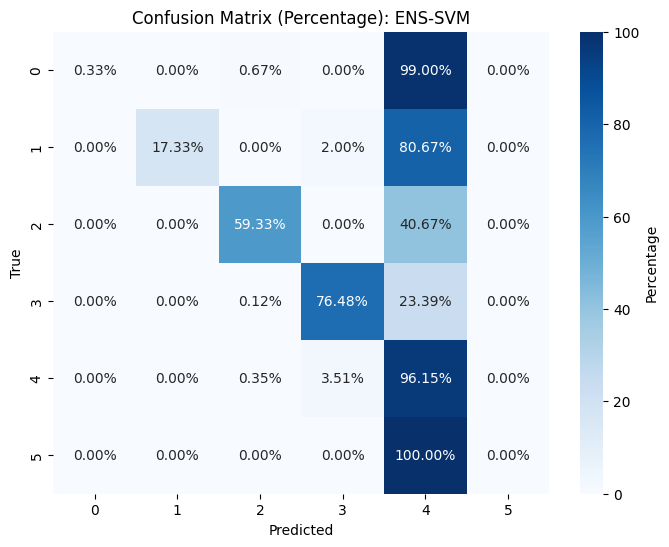

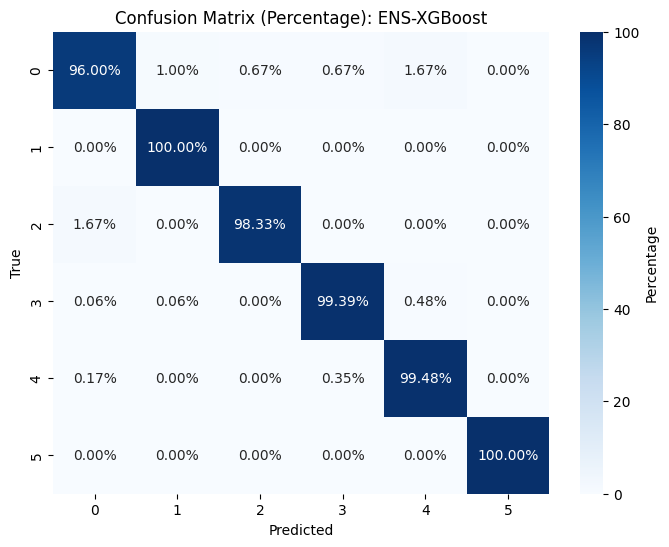

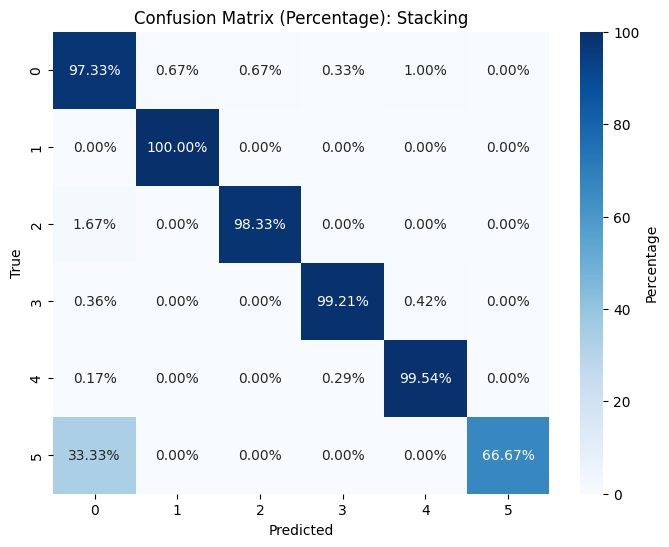

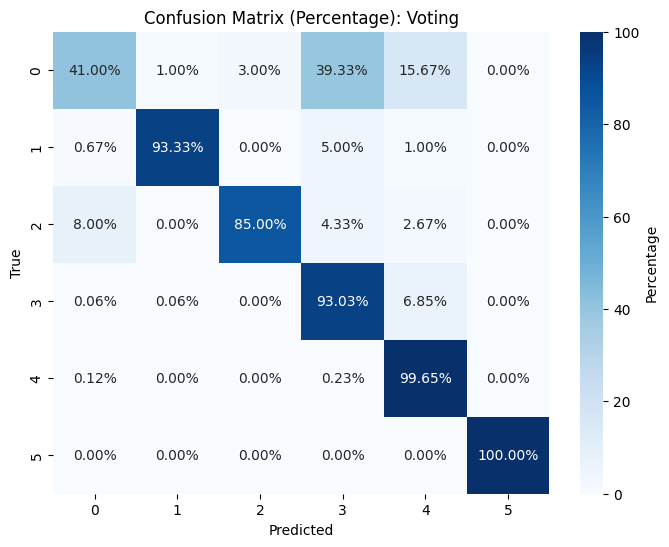

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.000000  0.000000  0.000000   300.000000
1              0.368984  0.230000  0.283368   300.000000
2              0.372671  0.800000  0.508475   300.000000
3              0.545758  0.693939  0.610993  1650.000000
4              0.698459  0.547441  0.613798  1739.000000
5              0.000000  0.000000  0.000000     3.000000
accuracy       0.560578  0.560578  0.560578     0.560578
macro avg      0.330979  0.378563  0.336105  4292.000000
weighted avg   0.544645  0.560578  0.538929  4292.000000
Classification Report for ENS-DT:
              precision    recall  f1-score     support
0              0.968750  0.930000  0.948980   300.00000
1              0.983607  1.000000  0.991736   300.00000
2              0.977124  0.996667  0.986799   300.00000
3              0.990321  0.992121  0.991220  1650.00000
4              0.992516  0.991374  0.991945  1739.00000
5              1.000000  1

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.560578,0.869385,0.560578,0.378563,0.336105
1,ENS-DT,0.988350,0.991146,0.988350,0.985027,0.985113
2,ENS-NN,0.700373,0.827458,0.700373,0.633792,0.662015
3,ENS-SVM,0.737418,0.905621,0.737418,0.416053,0.438080
4,ENS-XGBoost,0.991612,0.999631,0.991612,0.988683,0.989117
5,Stacking,0.991845,0.998314,0.991845,0.935142,0.956020
6,Voting,0.915424,0.994203,0.915424,0.853364,0.879893



Processing dataset: KDD CUP 99
Shape of KDD CUP 99: (494021, 43)
Number of unique classes in 'Attack Type': 5

Evaluating feature selection method: Lasso
Selected features (Lasso): Index(['duration', 'service', 'src_bytes', 'dst_bytes', 'hot', 'count',
       'srv_count', 'dst_host_count', 'dst_host_srv_count', 'target'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.724611,0.796937,0.724611,0.475920,0.444727
1,ENS-DT,0.994053,0.996083,0.994053,0.993875,0.964013
2,ENS-NN,0.921775,0.841481,0.921775,0.707993,0.713763
3,ENS-SVM,0.575023,0.898562,0.575023,0.215297,0.174048
4,ENS-XGBoost,0.997255,0.999946,0.997255,0.997308,0.971287
5,Stacking,0.996798,0.999828,0.996798,0.996717,0.962450
6,Voting,0.969350,0.999505,0.969350,0.898279,0.919555


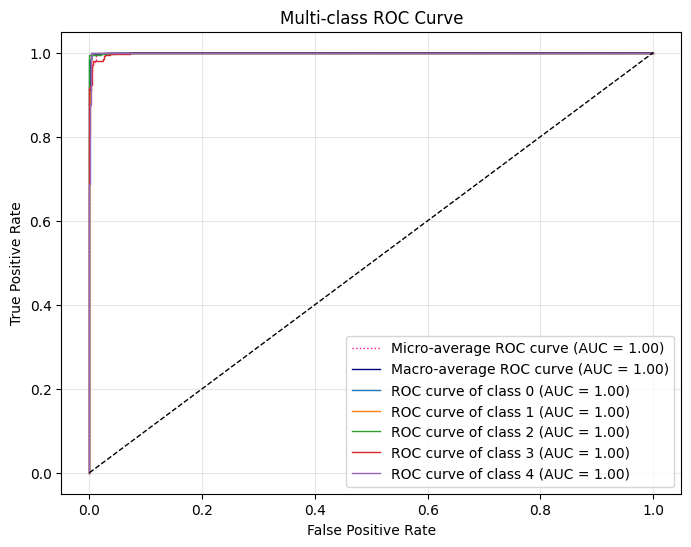

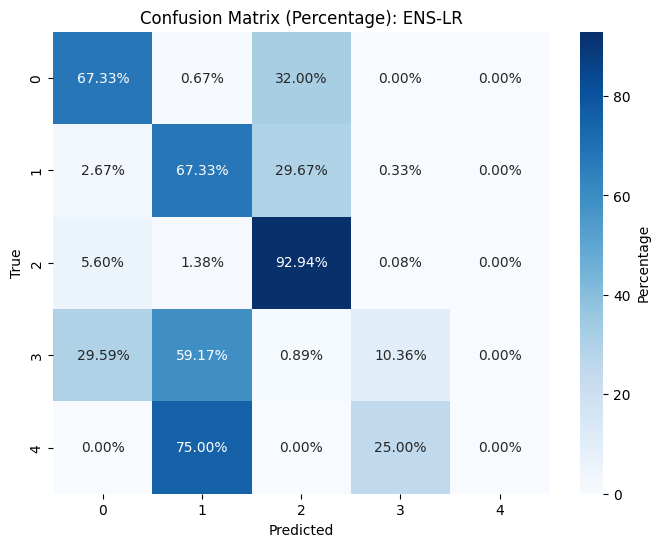

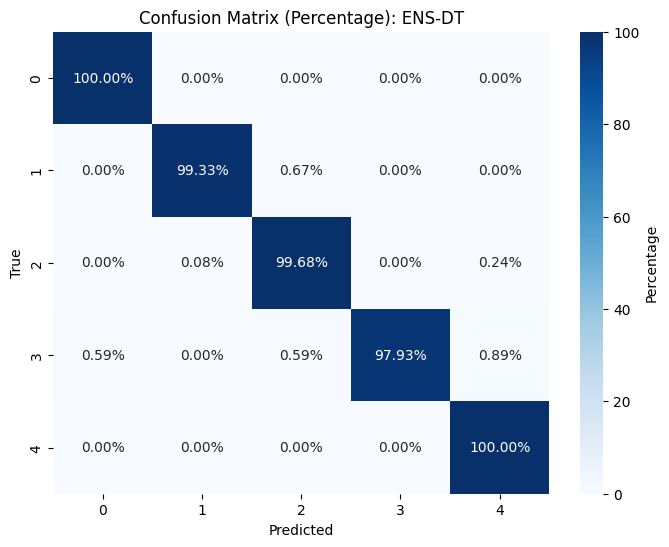

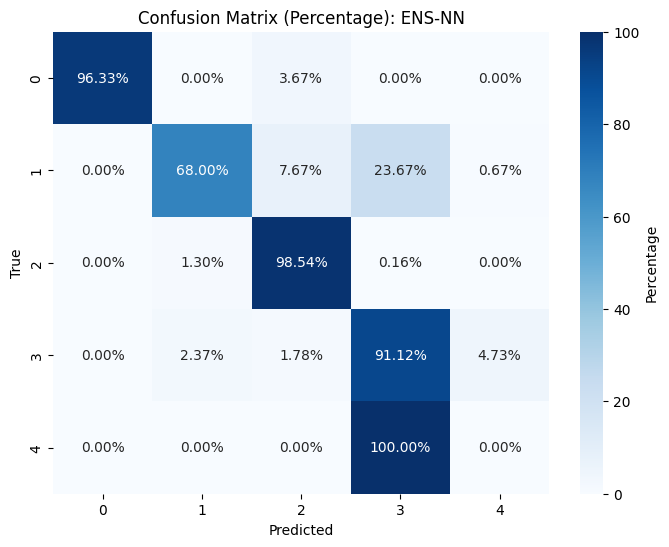

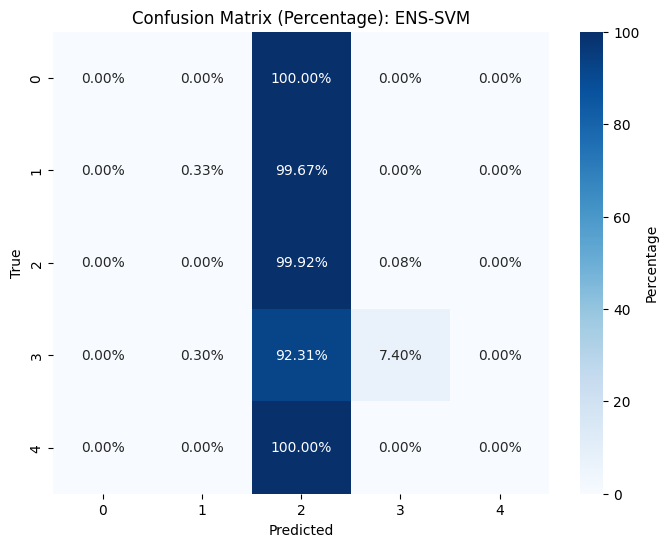

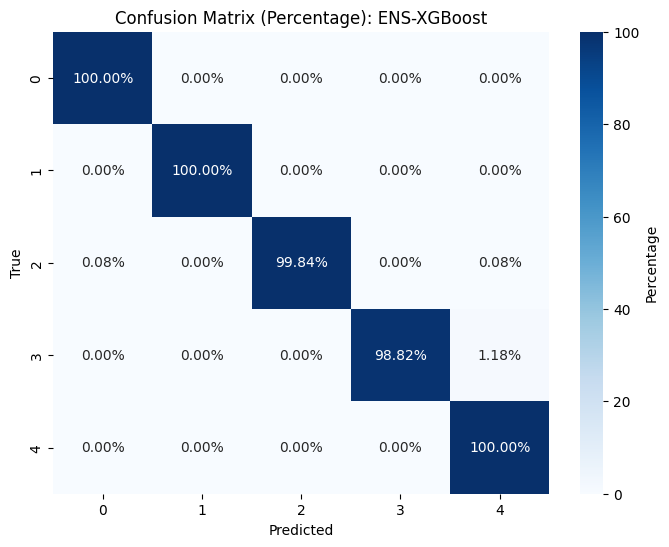

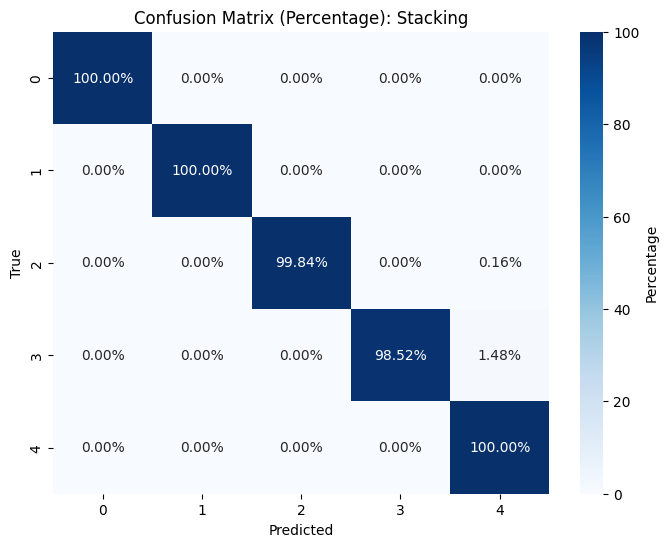

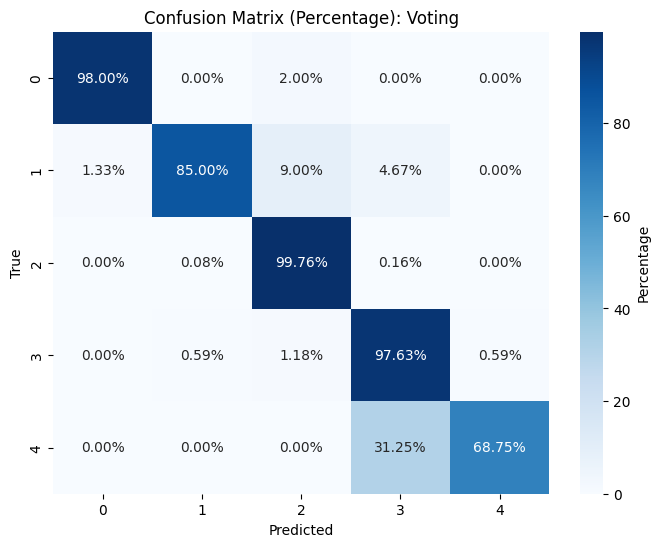

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.532982  0.673333  0.594993   300.000000
1              0.466513  0.673333  0.551160   300.000000
2              0.858965  0.929383  0.892788  1232.000000
3              0.853659  0.103550  0.184697   338.000000
4              0.000000  0.000000  0.000000    16.000000
accuracy       0.724611  0.724611  0.724611     0.724611
macro avg      0.542424  0.475920  0.444727  2186.000000
weighted avg   0.753261  0.724611  0.689015  2186.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.993377  1.000000  0.996678   300.000000
1              0.996656  0.993333  0.994992   300.000000
2              0.996753  0.996753  0.996753  1232.000000
3              1.000000  0.979290  0.989537   338.000000
4              0.727273  1.000000  0.842105    16.000000
accuracy       0.994053  0.994053  0.994053     0.994053
macro avg      0.942

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.724611,0.796937,0.724611,0.475920,0.444727
1,ENS-DT,0.994053,0.996083,0.994053,0.993875,0.964013
2,ENS-NN,0.921775,0.841481,0.921775,0.707993,0.713763
3,ENS-SVM,0.575023,0.898562,0.575023,0.215297,0.174048
4,ENS-XGBoost,0.997255,0.999946,0.997255,0.997308,0.971287
5,Stacking,0.996798,0.999828,0.996798,0.996717,0.962450
6,Voting,0.969350,0.999505,0.969350,0.898279,0.919555



Evaluating feature selection method: Tree-based
Selected features (Tree-based): Index(['target', 'src_bytes', 'logged_in', 'dst_host_srv_count', 'srv_count',
       'count', 'service', 'dst_bytes', 'dst_host_diff_srv_rate',
       'protocol_type'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.761208,0.810195,0.761208,0.494864,0.481777
1,ENS-DT,0.989936,0.992310,0.989936,0.988230,0.964617
2,ENS-NN,0.917658,0.866645,0.917658,0.715216,0.718960
3,ENS-SVM,0.575023,0.890435,0.575023,0.215297,0.174048
4,ENS-XGBoost,0.997713,0.999966,0.997713,0.985992,0.975086
5,Stacking,0.994968,0.999946,0.994968,0.994629,0.961075
6,Voting,0.980329,0.999206,0.980329,0.831017,0.861775


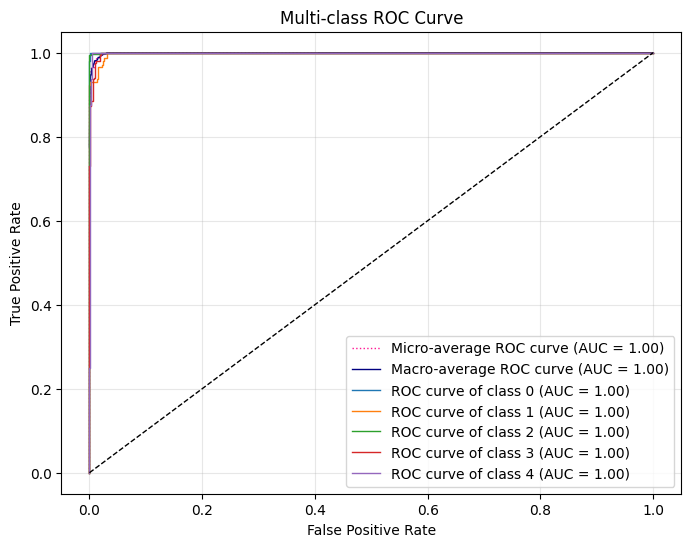

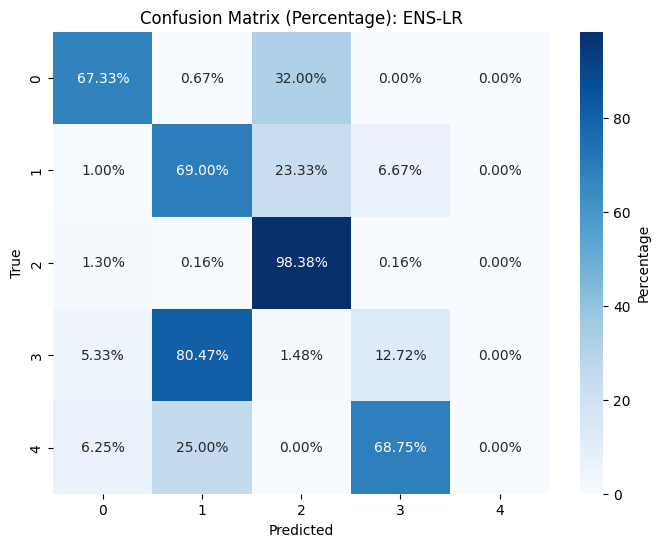

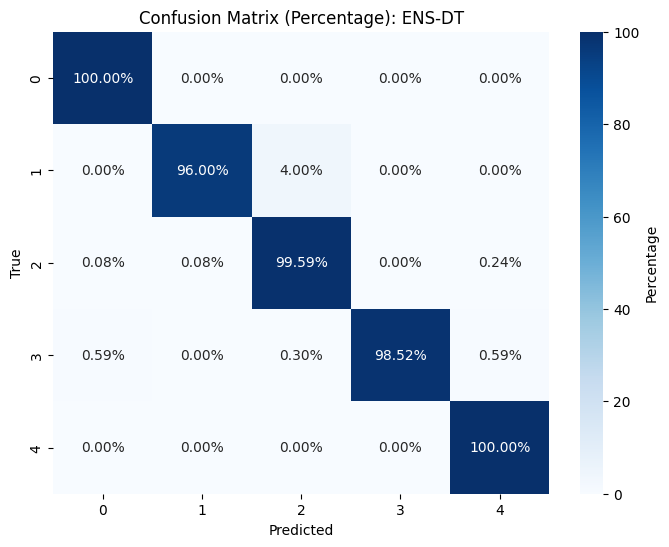

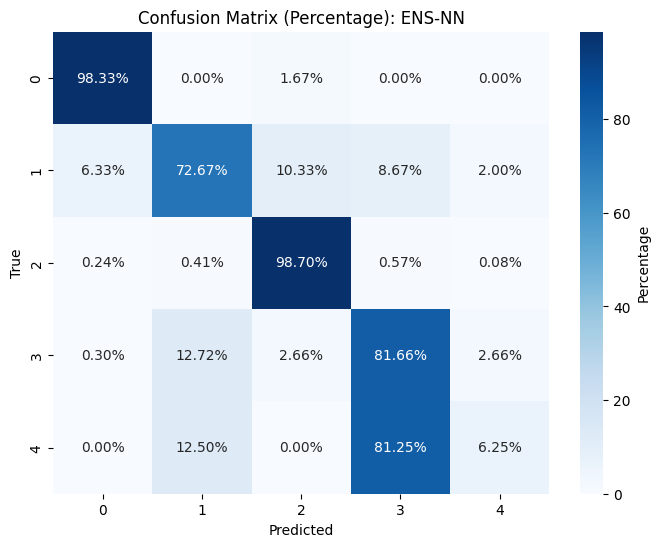

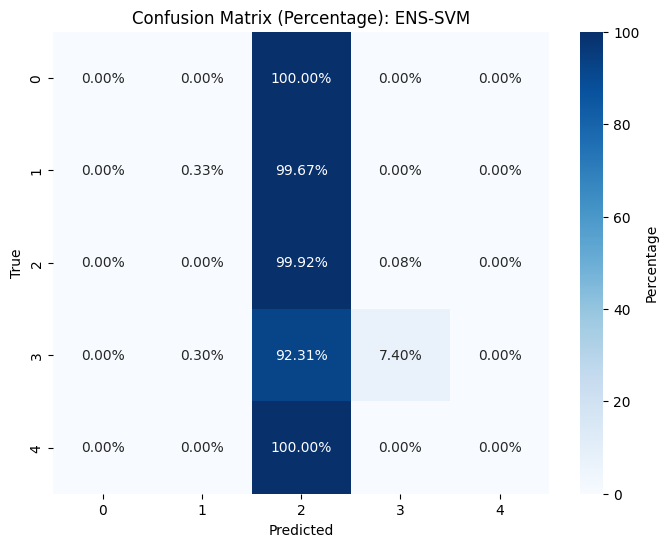

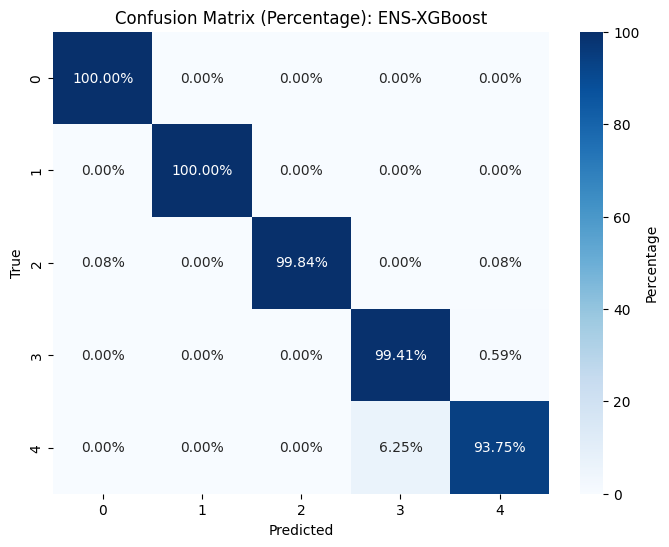

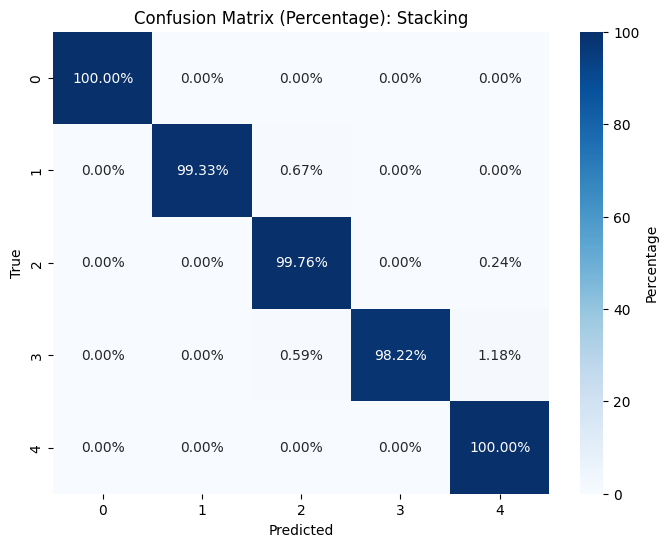

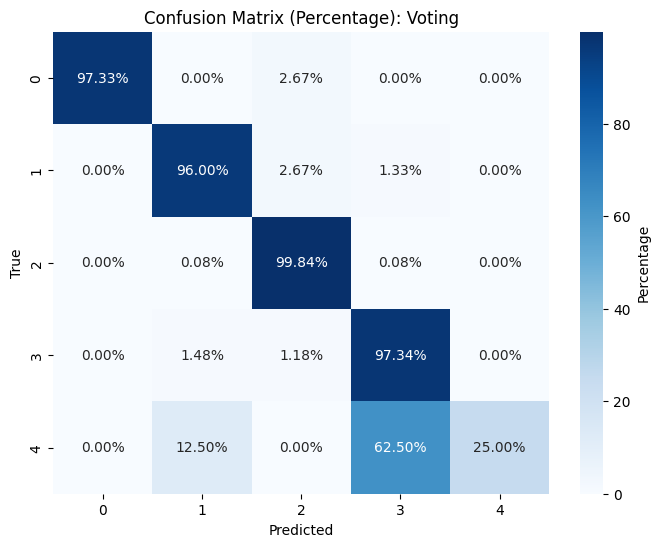

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.841667  0.673333  0.748148   300.000000
1              0.425051  0.690000  0.526048   300.000000
2              0.876356  0.983766  0.926960  1232.000000
3              0.565789  0.127219  0.207729   338.000000
4              0.000000  0.000000  0.000000    16.000000
accuracy       0.761208  0.761208  0.761208     0.761208
macro avg      0.541773  0.494864  0.481777  2186.000000
weighted avg   0.755225  0.761208  0.729408  2186.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.990099  1.000000  0.995025   300.000000
1              0.996540  0.960000  0.977929   300.000000
2              0.989516  0.995942  0.992718  1232.000000
3              1.000000  0.985207  0.992548   338.000000
4              0.761905  1.000000  0.864865    16.000000
accuracy       0.989936  0.989936  0.989936     0.989936
macro avg      0.947

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.761208,0.810195,0.761208,0.494864,0.481777
1,ENS-DT,0.989936,0.992310,0.989936,0.988230,0.964617
2,ENS-NN,0.917658,0.866645,0.917658,0.715216,0.718960
3,ENS-SVM,0.575023,0.890435,0.575023,0.215297,0.174048
4,ENS-XGBoost,0.997713,0.999966,0.997713,0.985992,0.975086
5,Stacking,0.994968,0.999946,0.994968,0.994629,0.961075
6,Voting,0.980329,0.999206,0.980329,0.831017,0.861775



Evaluating feature selection method: RFE
Selected features (RFE): Index(['protocol_type', 'service', 'src_bytes', 'dst_bytes', 'logged_in',
       'count', 'srv_count', 'dst_host_srv_count', 'dst_host_diff_srv_rate',
       'target'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-7e5fe038539f>:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['kmeans_cluster'] = kmeans.fit_predict(train_X)
<ipython-input-23-7e5fe038539f>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_X['dbscan_cluster'] = dbscan.fit_predict(train_X)
/

Results Table:


,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.768527,0.824751,0.768527,0.506423,0.500907
1,ENS-DT,0.989478,0.991902,0.989478,0.987638,0.968709
2,ENS-NN,0.899360,0.914585,0.899360,0.763423,0.766746
3,ENS-SVM,0.575023,0.890848,0.575023,0.215297,0.174048
4,ENS-XGBoost,0.998170,0.999954,0.998170,0.986154,0.980515
5,Stacking,0.990393,0.999966,0.990393,0.988392,0.962353
6,Voting,0.978500,0.999275,0.978500,0.816891,0.841590


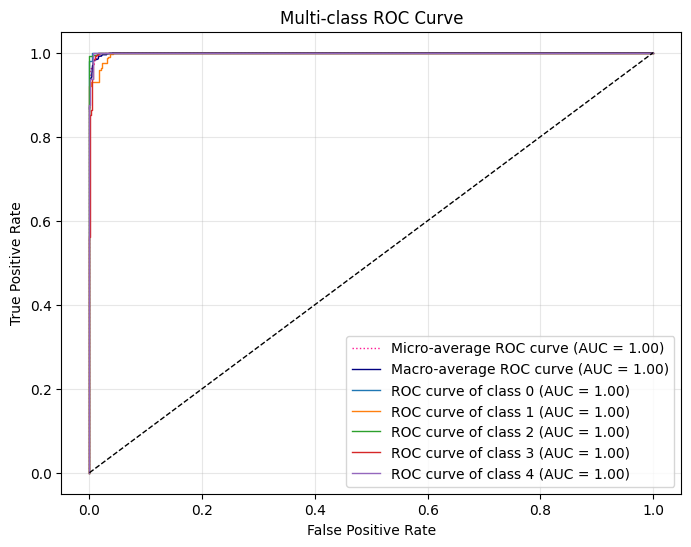

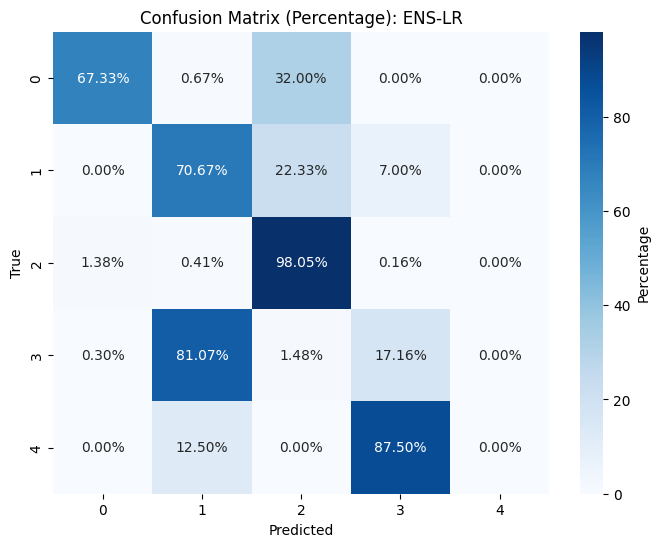

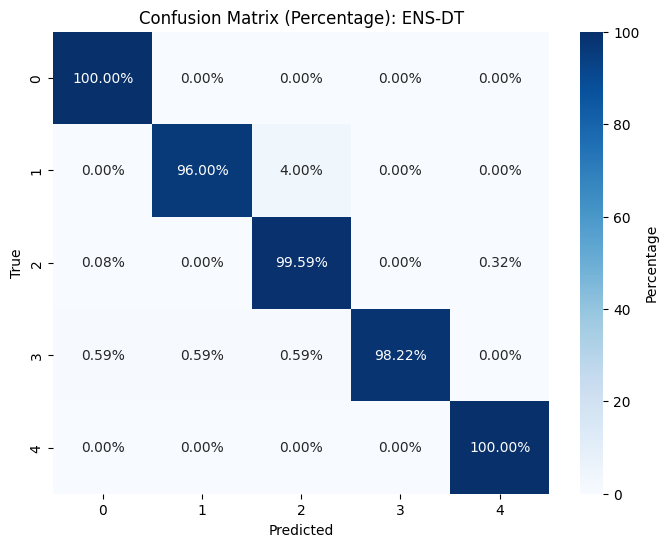

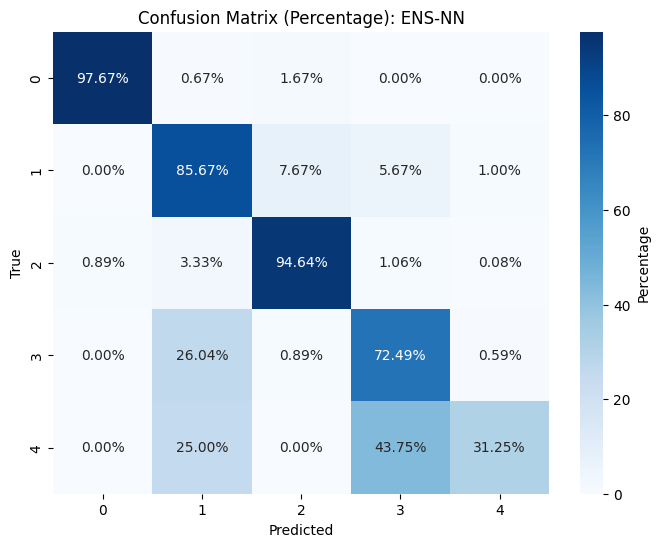

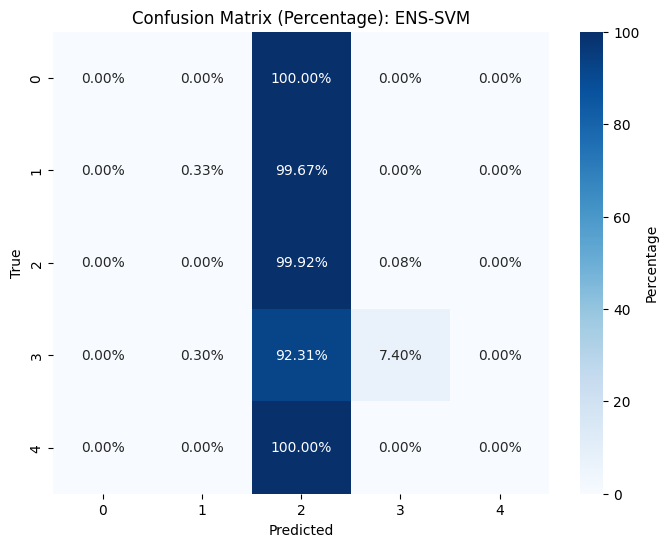

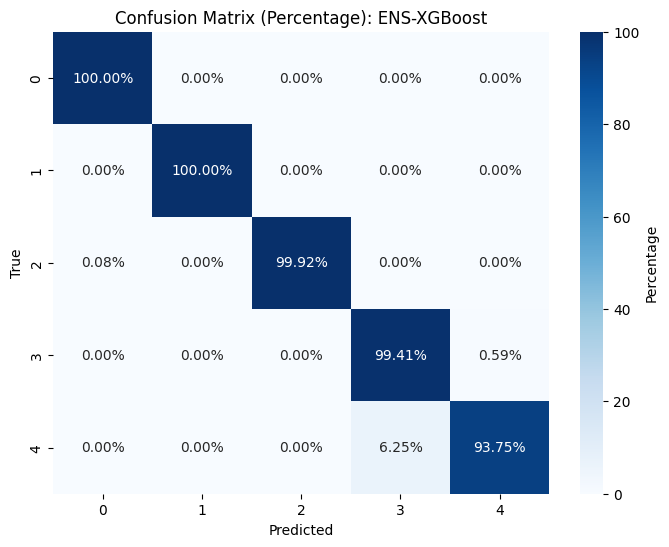

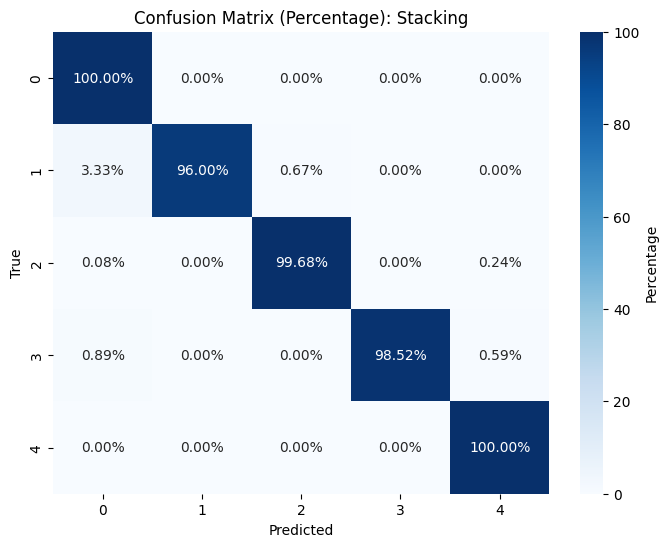

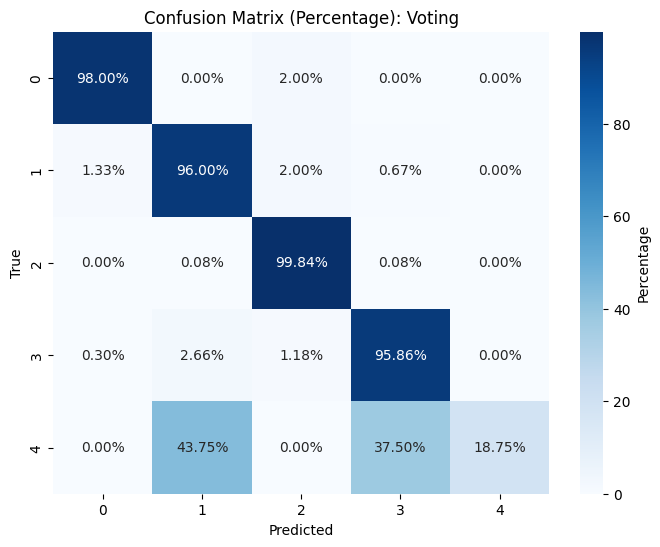

Classification Report for ENS-LR:
              precision    recall  f1-score      support
0              0.918182  0.673333  0.776923   300.000000
1              0.428283  0.706667  0.533333   300.000000
2              0.877907  0.980519  0.926380  1232.000000
3              0.610526  0.171598  0.267898   338.000000
4              0.000000  0.000000  0.000000    16.000000
accuracy       0.768527  0.768527  0.768527     0.768527
macro avg      0.566980  0.506423  0.500907  2186.000000
weighted avg   0.773961  0.768527  0.743334  2186.000000
Classification Report for ENS-DT:
              precision    recall  f1-score      support
0              0.990099  1.000000  0.995025   300.000000
1              0.993103  0.960000  0.976271   300.000000
2              0.988719  0.995942  0.992317  1232.000000
3              1.000000  0.982249  0.991045   338.000000
4              0.800000  1.000000  0.888889    16.000000
accuracy       0.989478  0.989478  0.989478     0.989478
macro avg      0.954

,Model,Accuracy,AUC,Precision,Recall,F1-Score
0,ENS-LR,0.768527,0.824751,0.768527,0.506423,0.500907
1,ENS-DT,0.989478,0.991902,0.989478,0.987638,0.968709
2,ENS-NN,0.899360,0.914585,0.899360,0.763423,0.766746
3,ENS-SVM,0.575023,0.890848,0.575023,0.215297,0.174048
4,ENS-XGBoost,0.998170,0.999954,0.998170,0.986154,0.980515
5,Stacking,0.990393,0.999966,0.990393,0.988392,0.962353
6,Voting,0.978500,0.999275,0.978500,0.816891,0.841590


In [30]:
datasets = {
    "NSL-KDD": nsl_kdd_data,
    "UNSW-NB15": all_data,
    "CICIDS2017": cicd2017,
    "KDD CUP 99": kdd_cup_df
}

target_columns = {
    "NSL-KDD": 'labels',
    "UNSW-NB15": "label",
    "CICIDS2017": ' Label',
    "KDD CUP 99": 'Attack Type'
}

feature_selection_methods = {
    "Lasso": lasso_feature_selection,
    "Tree-based": tree_based_feature_selection,
    "RFE": rfe_feature_selection
}

for dataset_name, path in datasets.items():
    print(f"\nProcessing dataset: {dataset_name}")
    target_col = target_columns[dataset_name]
    
    # Preprocess dataset
    df = preprocess_data(path)
    print(f"Shape of {dataset_name}: {df.shape}")
    print(f"Number of unique classes in '{target_col}': {len(df[target_col].unique())}")
    
    # Sample data from each class
    class_counts = df[target_col].value_counts()
    sampled_data = []
    for class_label, count in class_counts.items():
        if count >= 1000:
            sampled_class = df[df[target_col] == class_label].sample(n=1000, random_state=42)
        else:
            sampled_class = df[df[target_col] == class_label]
        sampled_data.append(sampled_class)
    df = pd.concat(sampled_data).reset_index(drop=True)
    
    # Split data
    X = df.drop(columns=[target_col])
    y = df[target_col]
    train_X, test_X, train_y, test_y = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )
    
    # Evaluate each feature selection method
    for method_name, feature_selector in feature_selection_methods.items():
        print(f"\nEvaluating feature selection method: {method_name}")
        
        # Perform feature selection
        selected_features = feature_selector(train_X, train_y)
        print(f"Selected features ({method_name}): {selected_features}")
        
        # Use selected features for training
        train_X_selected = train_X[selected_features]
        test_X_selected = test_X[selected_features]
        
        # Add clustering features
        train_X_selected = add_cluster_features(train_X_selected)
        test_X_selected = add_cluster_features(test_X_selected)
        
        # Train and evaluate models
        results = train_ensemble_models(
            train_X_selected, train_y, test_X_selected, test_y,
            class_names=sorted(test_y.unique())
        )
        
        print(f"Results for {method_name} on {dataset_name}:")
        display(results)
 

# Visualizations


Processing dataset: NSL-KDD
Shape of NSL-KDD: (148517, 44)
Number of unique classes in 'labels': 3
Columns in NSL-KDD: Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'attack', 'level', 'labels'],
      dtype='object')
Target co

<Figure size 1200x600 with 0 Axes>

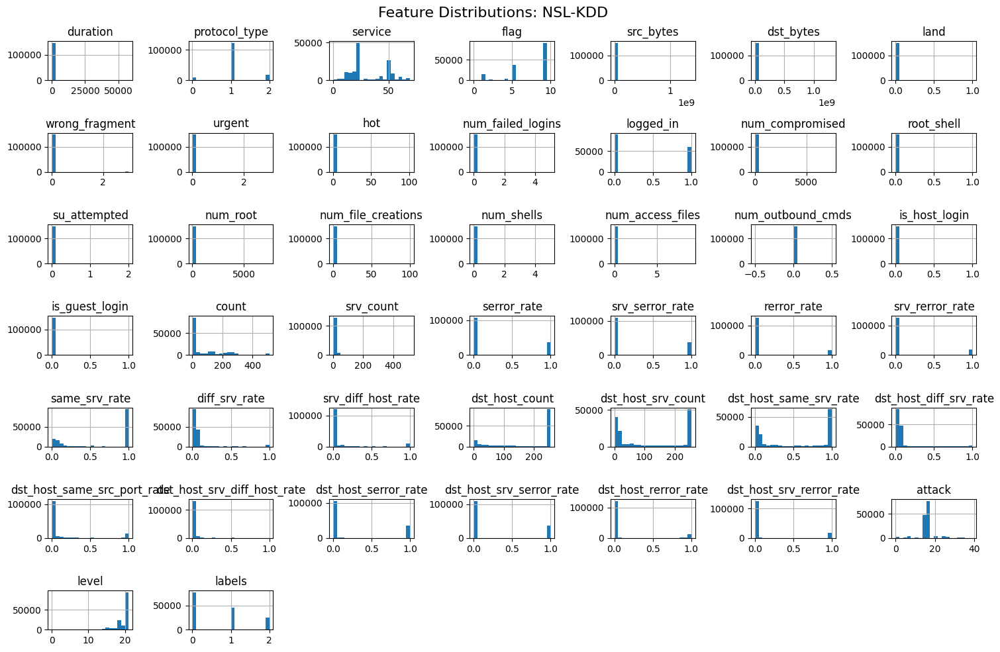

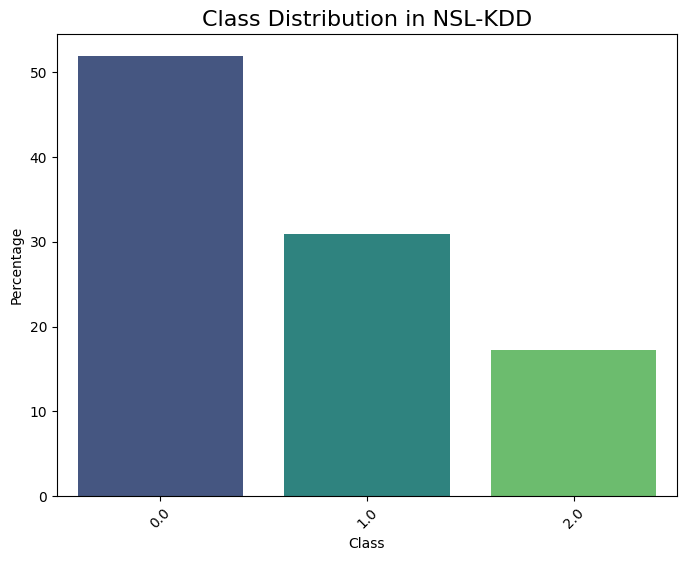

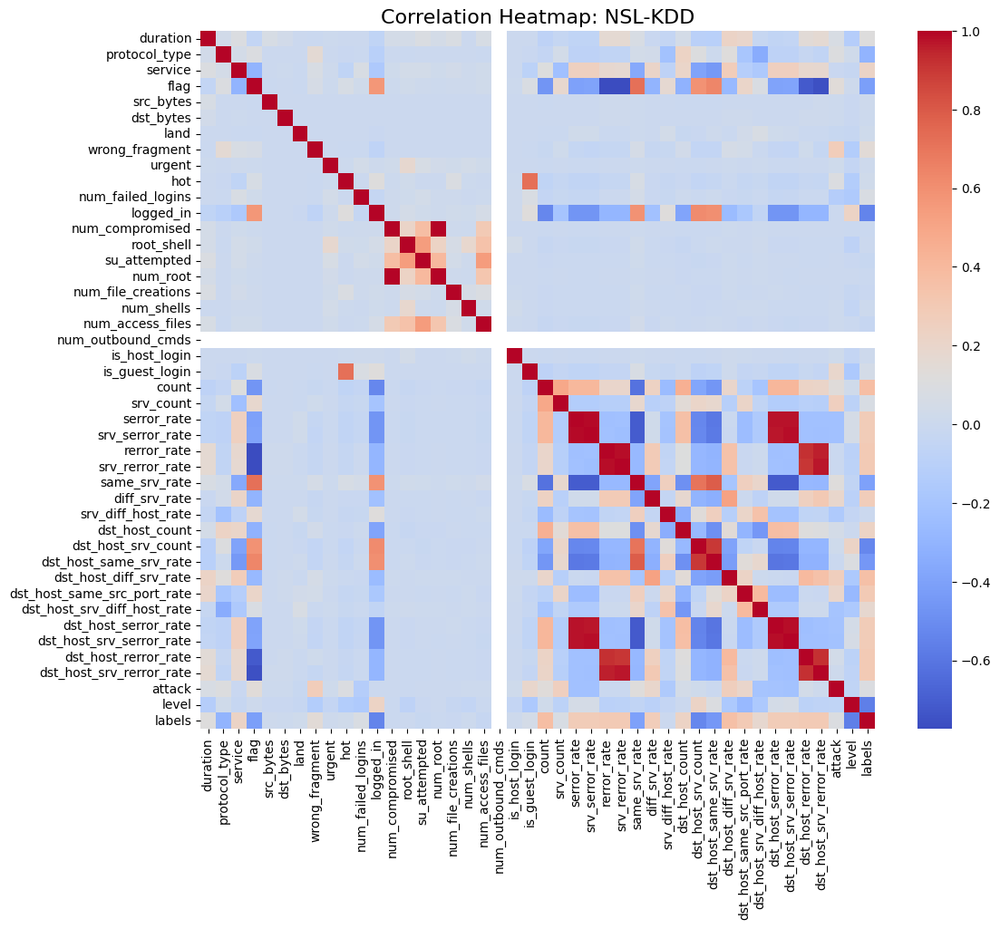

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

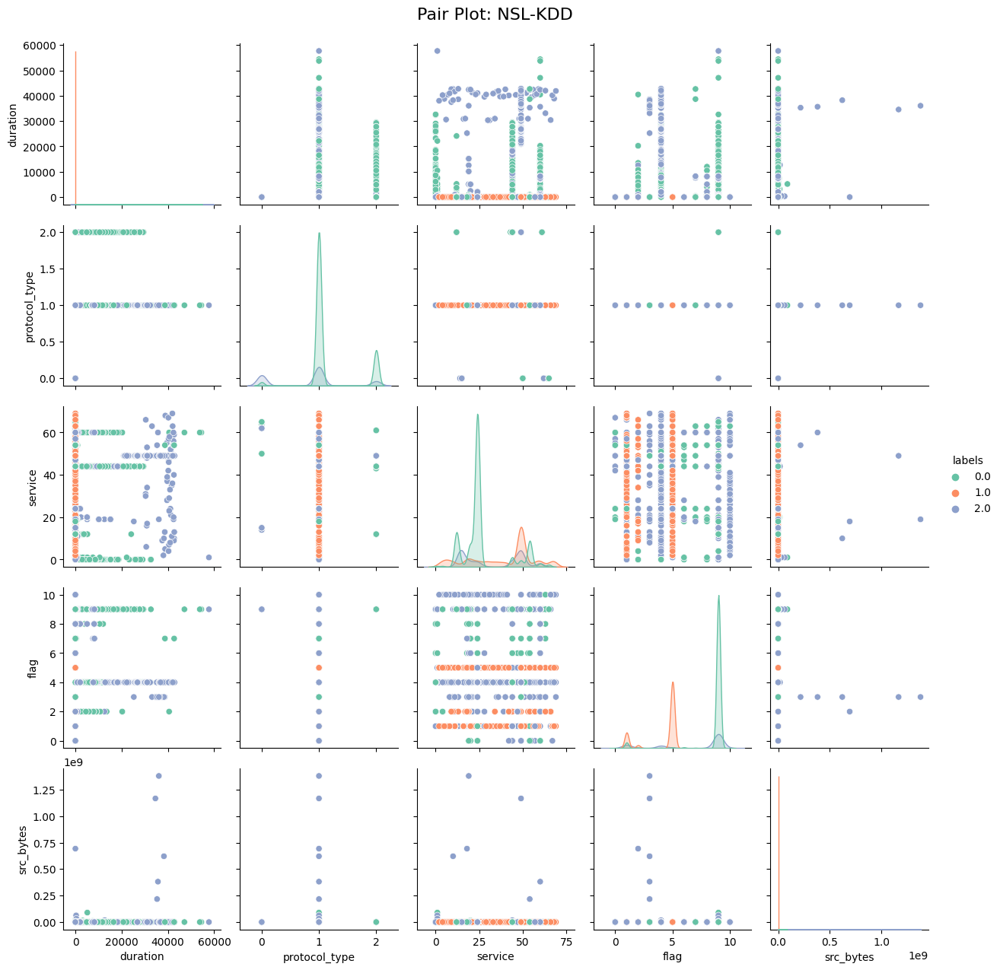


Processing dataset: UNSW-NB15
Shape of UNSW-NB15: (2540047, 49)
Number of unique classes in 'label': 2
Columns in UNSW-NB15: Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'sload', 'dload',
       'spkts', 'dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'sjit', 'djit', 'stime',
       'ltime', 'sintpkt', 'dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'label'],
      dtype='object', name='Name')
Target column: label


<Figure size 1200x600 with 0 Axes>

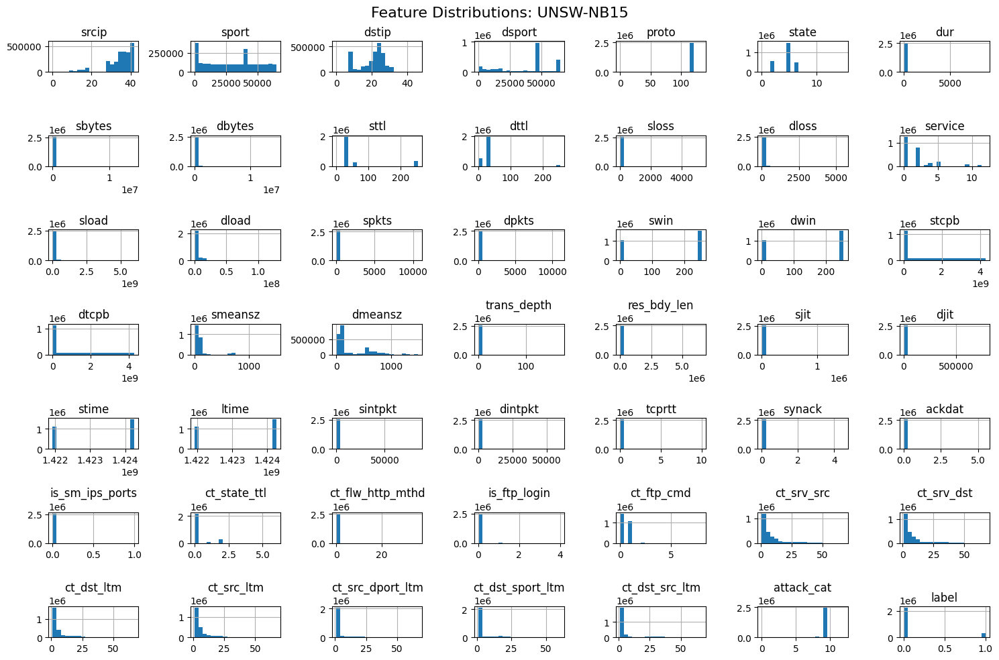

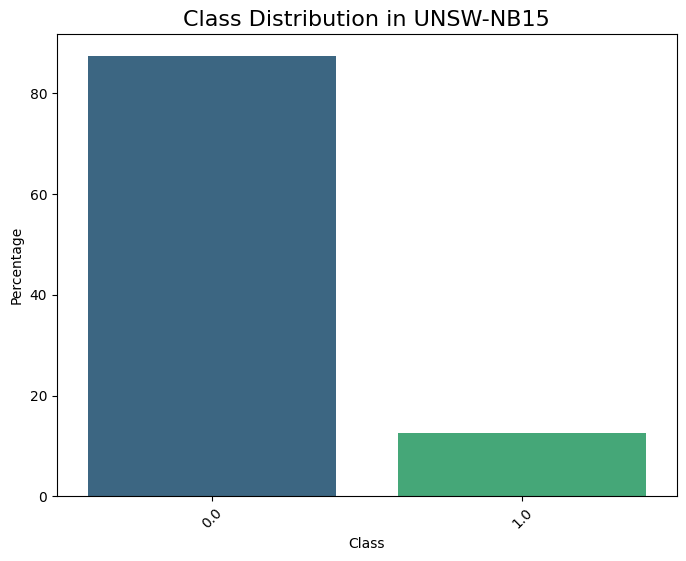

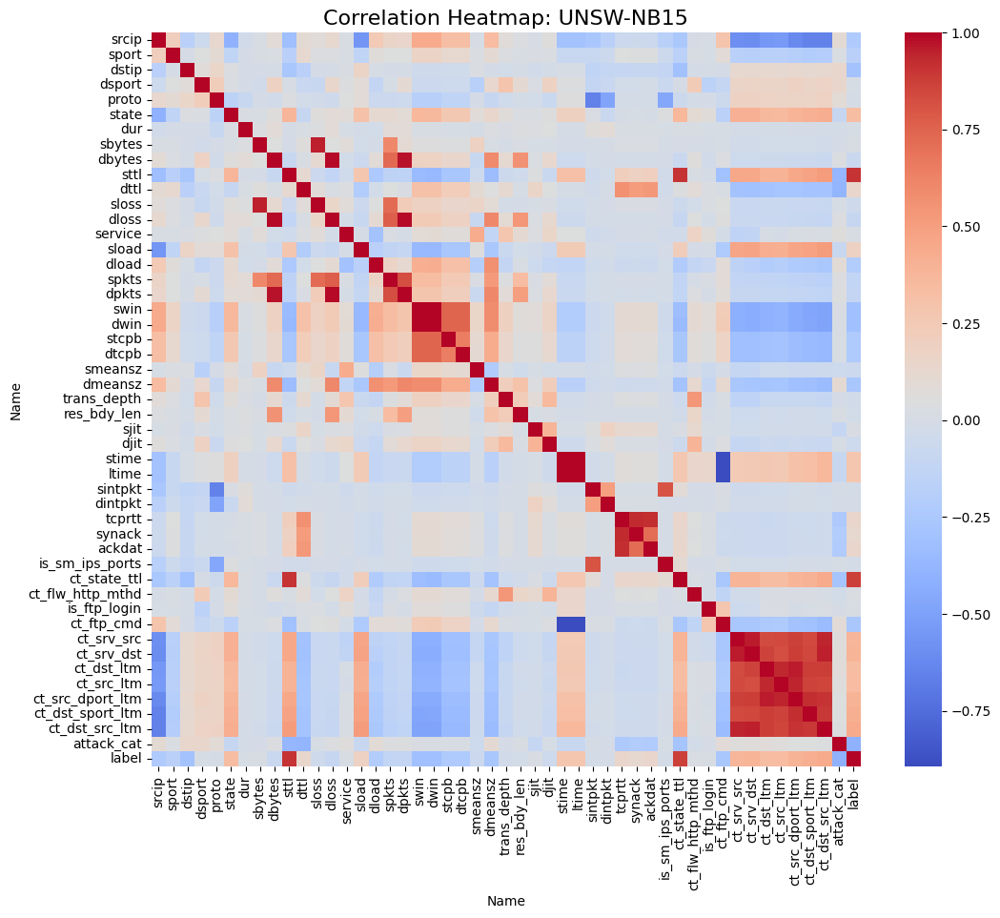

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

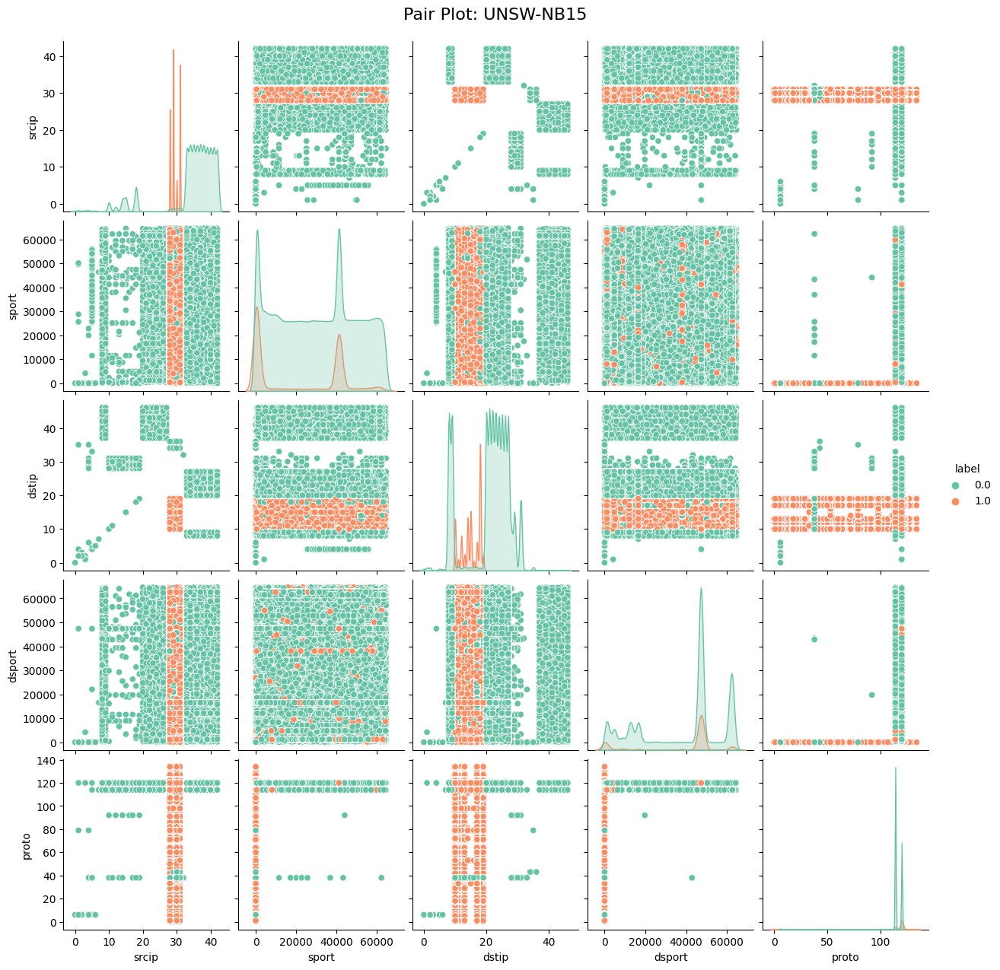


Processing dataset: CICIDS2017
Shape of CICIDS2017: (692703, 79)
Number of unique classes in ' Label': 6
Columns in CICIDS2017: Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags',
       ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
  

<Figure size 1200x600 with 0 Axes>

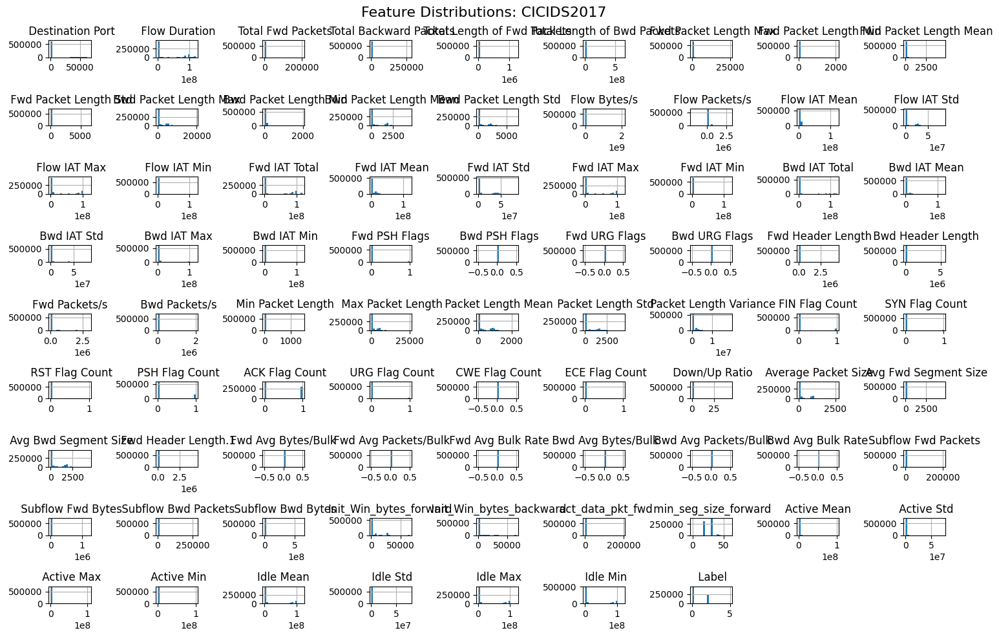

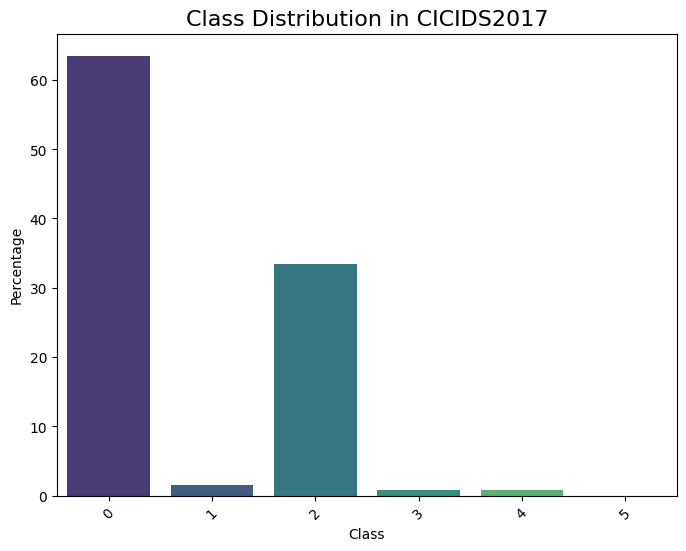

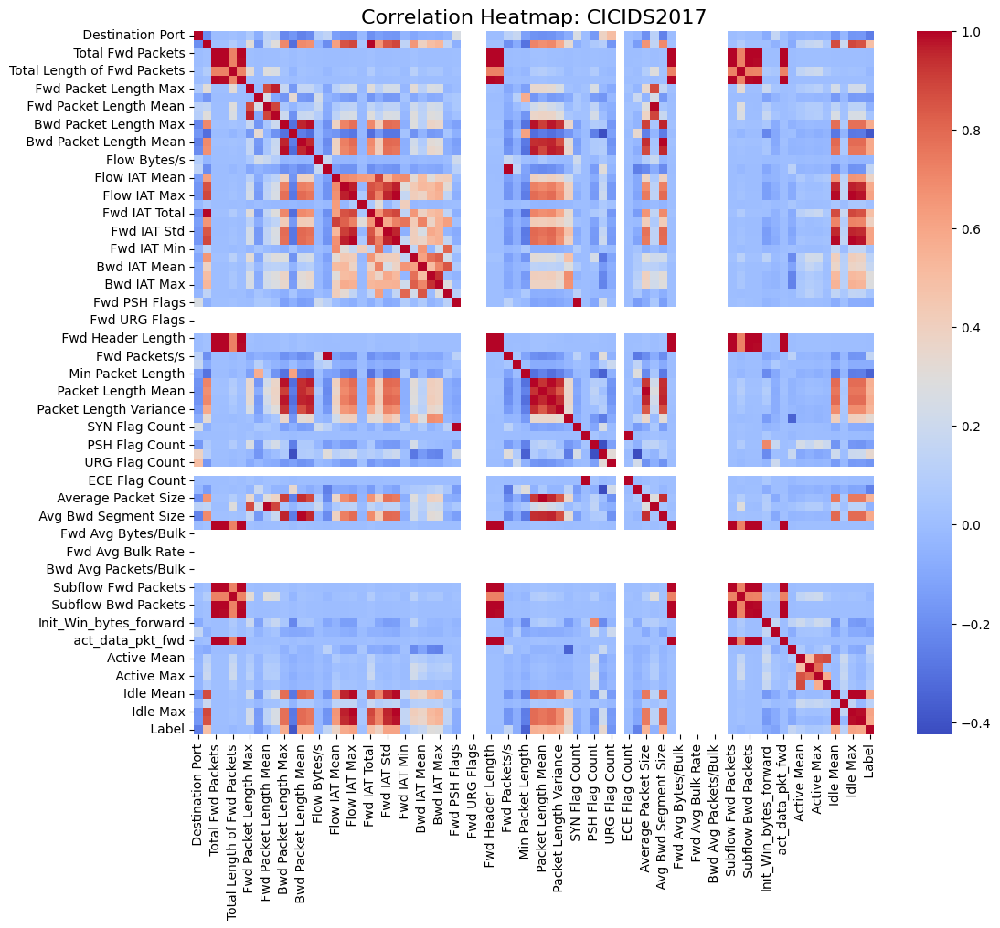

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

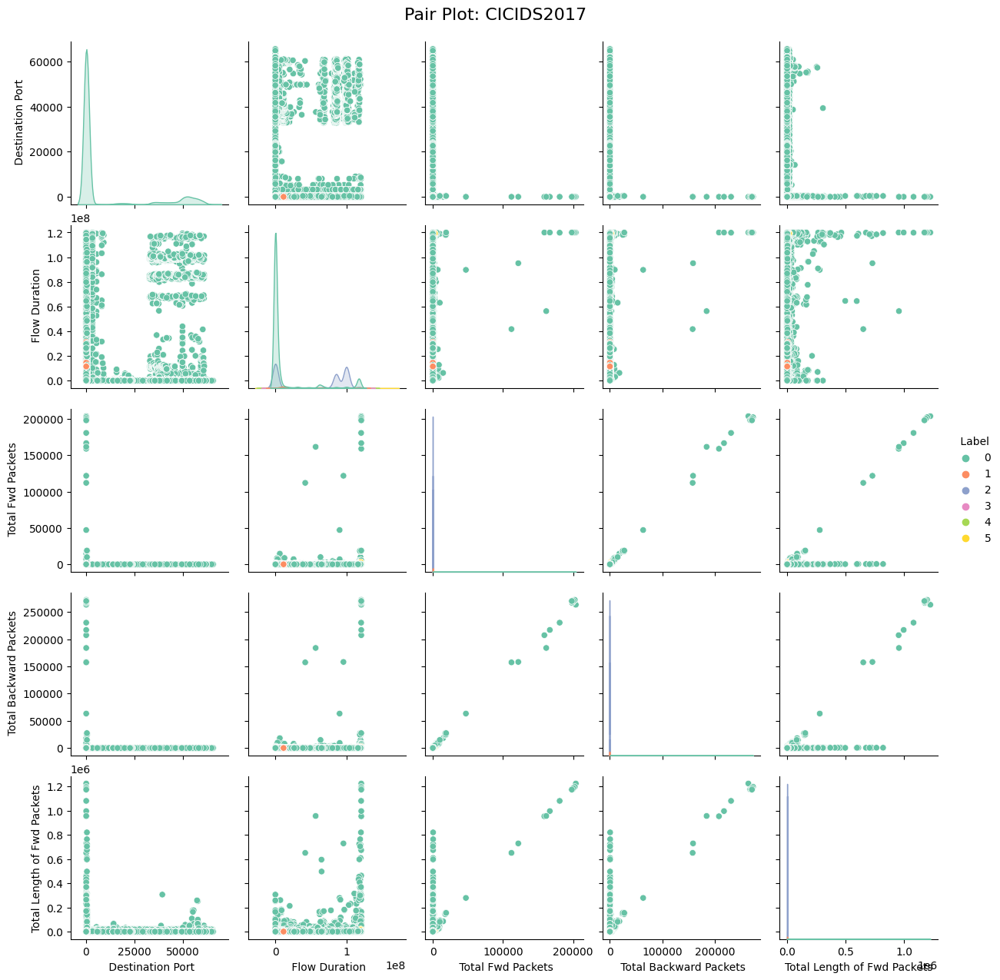


Processing dataset: KDD CUP 99
Shape of KDD CUP 99: (494021, 43)
Number of unique classes in 'Attack Type': 5
Columns in KDD CUP 99: Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'target', 'Attack Type'],
      dtype='object')

<Figure size 1200x600 with 0 Axes>

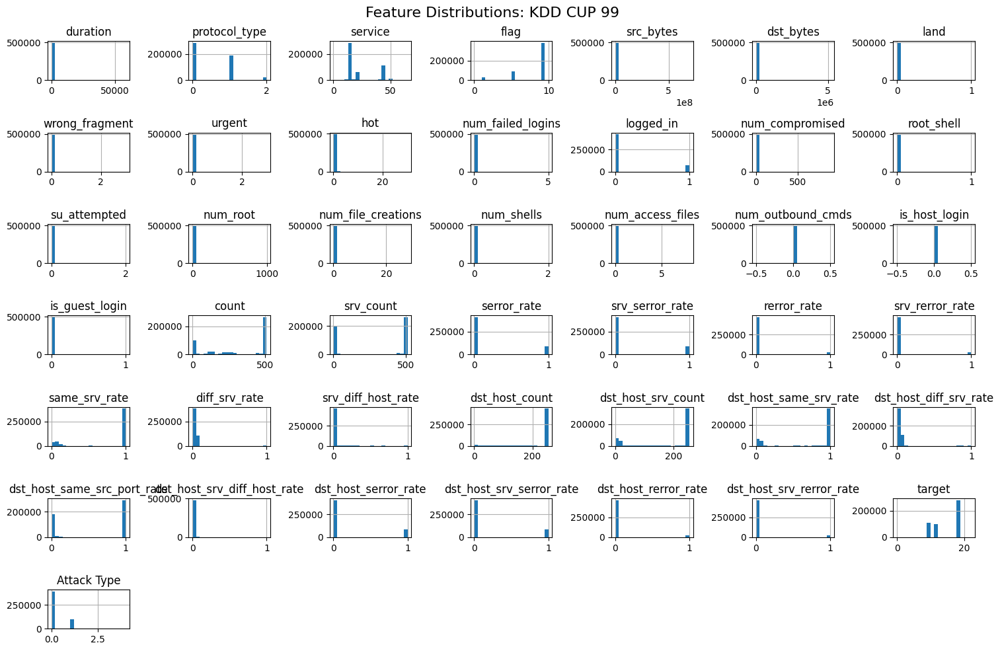

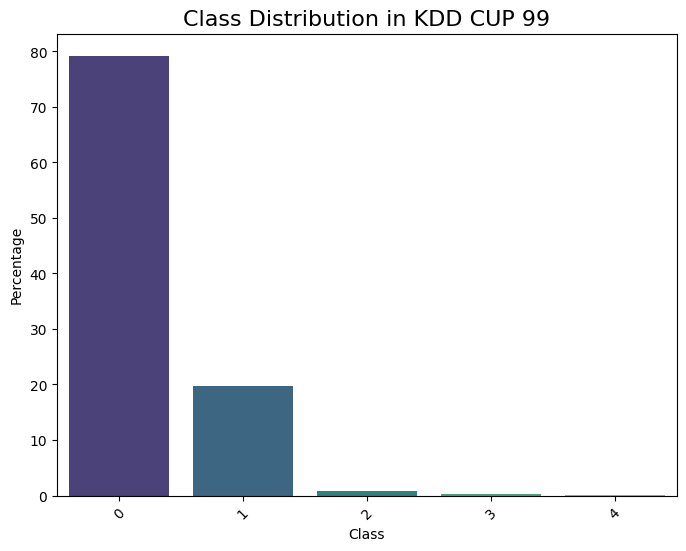

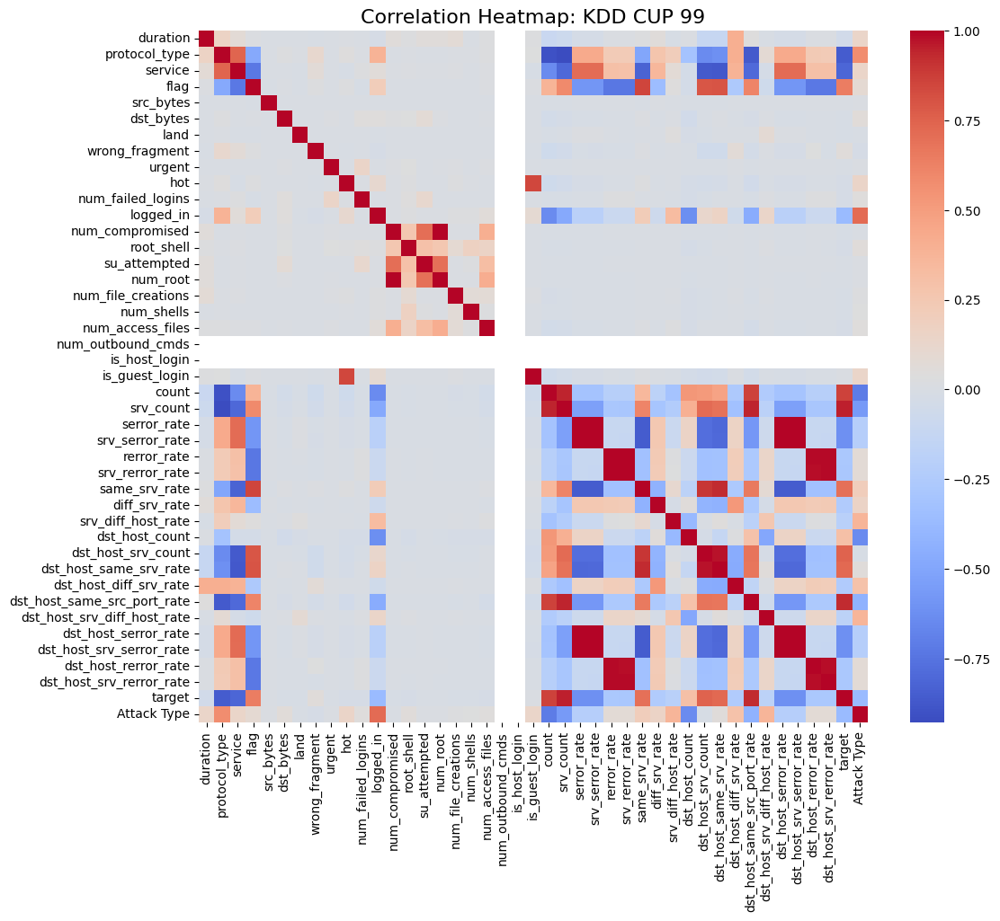

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

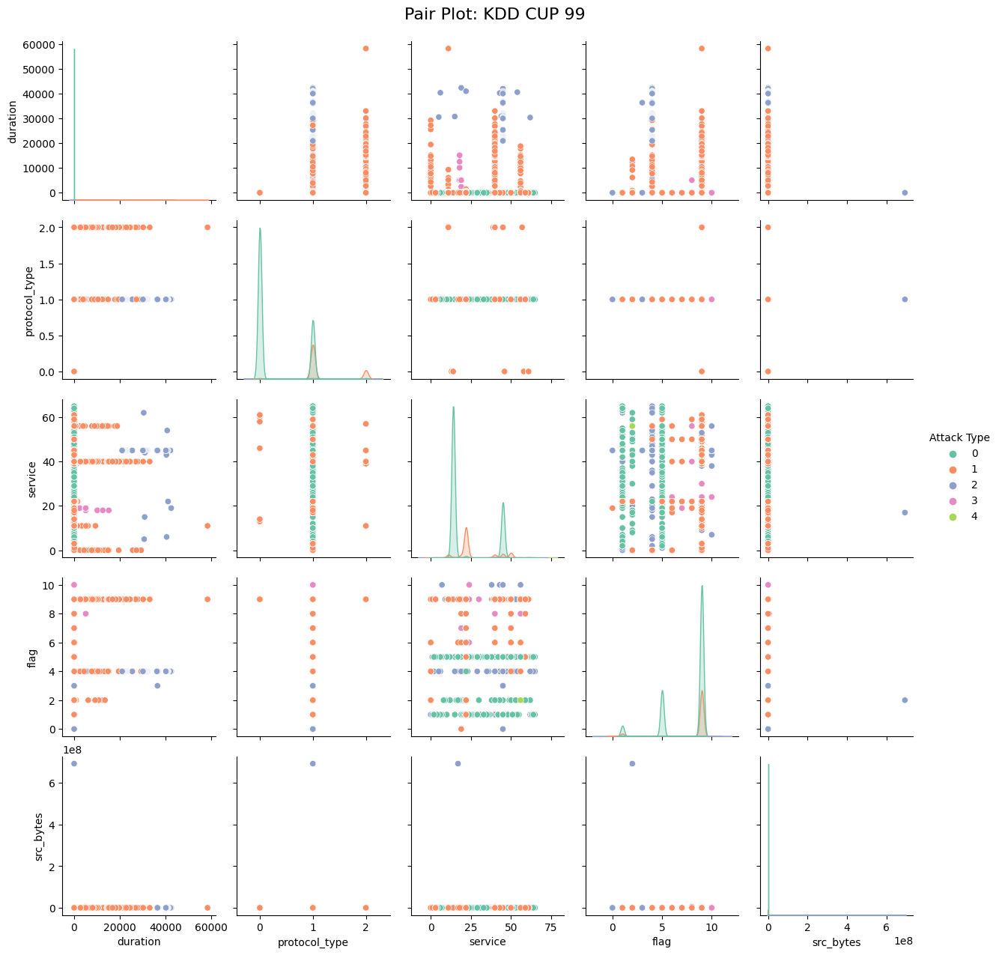

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_dataset(df, dataset_name, target_col):
    """
    Generates insightful figures for EDA.
    """
    # Check if target_col is in the DataFrame
    if target_col not in df.columns:
        raise KeyError(f"Target column '{target_col}' not found in the dataset '{dataset_name}'.")
    
    print(f"Columns in {dataset_name}: {df.columns}")
    print(f"Target column: {target_col}")

    # Plot distribution of numeric features
    numeric_cols = df.select_dtypes(include=["number"]).columns
    plt.figure(figsize=(15, 8))
    df[numeric_cols].hist(bins=20, figsize=(15, 10))
    plt.suptitle(f"Feature Distributions: {dataset_name}", fontsize=16)
    plt.tight_layout()
    plt.savefig(f"{dataset_name}_feature_distributions.png")
    plt.show()

    # Class distribution
    plt.figure(figsize=(8, 6))
    class_counts = df[target_col].value_counts(normalize=True) * 100  # Convert to percentage
    sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")
    plt.title(f"Class Distribution in {dataset_name}", fontsize=16)
    plt.xlabel("Class")
    plt.ylabel("Percentage")
    plt.xticks(rotation=45)
    plt.savefig(f"{dataset_name}_class_distribution.png")
    plt.show()

    # Correlation heatmap
    plt.figure(figsize=(12, 10))
    correlation_matrix = df[numeric_cols].corr()
    sns.heatmap(correlation_matrix, annot=False, cmap="coolwarm", cbar=True)
    plt.title(f"Correlation Heatmap: {dataset_name}", fontsize=16)
    plt.savefig(f"{dataset_name}_correlation_heatmap.png")
    plt.show()

    # Pair plot for a subset of features
    sampled_features = [col for col in numeric_cols if col in df.columns][:5]  # Limit to 5 features
    if target_col not in df.columns:
        raise KeyError(f"Target column '{target_col}' not found in {dataset_name}.")
    sampled_df = df[sampled_features + [target_col]]
    sns.pairplot(sampled_df, hue=target_col, palette="Set2", diag_kind="kde")
    plt.suptitle(f"Pair Plot: {dataset_name}", y=1.02, fontsize=16)
    plt.savefig(f"{dataset_name}_pairplot.png")
    plt.show()


# Process datasets and visualize
for dataset_name, path in datasets.items():
    print(f"\nProcessing dataset: {dataset_name}")
    target_col = target_columns[dataset_name]
    
    # Preprocess dataset
    df = preprocess_data(path)
    print(f"Shape of {dataset_name}: {df.shape}")
    print(f"Number of unique classes in '{target_col}': {len(df[target_col].unique())}")
    
    # Visualize dataset
    visualize_dataset(df, dataset_name, target_col)
